

#  Meta SiMMMulated Dataset Analysis

Contents
- Graphical Causial Models
- Dowhy + Econml Models


# Load Libraries

In [ ]:
pip install --upgrade --force-reinstall scikit-learn --no-cache-dir

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.1/62.1 kB 30.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 83.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.7/307.7 kB 96.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 109.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.3/35.3 MB 156.8 MB/s eta 0:00:00
  Attempting uninstall: threadpoolctl
    Found existing installation: threadpoolctl 3.6.0
    Uninstalling threadpoolctl-3.6.0:
      Successfully uninstalled threadpoolctl-3.6.0
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: joblib
    Found existing installation: joblib 1.5.1
    Uninstalling joblib-1.5.1:
      Successfully uninstalled joblib-1.5.1
  Attempting uninstall: scipy
    Found e

In [ ]:

!pip install dowhy

import arviz as az
import graphviz as gr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
!pip install seaborn

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [10, 6]
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.facecolor"] = "white"

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import dowhy
from dowhy import CausalModel
import dowhy.datasets, dowhy.plotter


# Config dict to set the logging level
import logging.config
DEFAULT_LOGGING = {
    'version': 1,
    'disable_existing_loggers': False,
    'loggers': {
        '': {
            'level': 'INFO',
        },
    }
}

logging.config.dictConfig(DEFAULT_LOGGING)

!apt install graphviz libgraphviz-dev -y # Install the system library graphviz and the necessary development files
!pip install pygraphviz  # Install the pygraphviz package

import pygraphviz as pgv  # Import pygraphviz

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6ubuntu0.1).
libgraphviz-dev is already the newest version (2.42.2-6ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


In [ ]:
!pip install econml


In [ ]:
!pip install scikit-learn==1.2.2  # Install a compatible scikit-learn version

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

[autoreload of numpy.lib.format failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/usr/local/lib/python3.11/dist-packages/IPython/extensions/autoreload.py", line 394, in superreload
    module = reload(module)
             ^^^^^^^^^^^^^^
  File "/usr/lib/python3.11/imp.py", line 315, in reload
    return importlib.reload(module)
           ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.11/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 621, in _exec
  File "<frozen importlib._bootstrap_external>", line 940, in exec_module
  File "<frozen importlib._bootstrap>", line 241, in _call_with_frames_removed
  File "/usr/local/lib/python3.11/dist-packages/numpy/lib/format.py", line 166, in <module>
    from numpy.lib.utils import safe_eval, drop_metadata
  File "/usr/loca

In [ ]:
# Load the dataset
data = pd.read_csv("/content/masters_daily_level_dataset_rev50.csv")

# Check the shape of the target variable before applying ravel()
print("Shape of 'total_revenue' before ravel():", data['total_revenue'].shape)

# Ensure the target variable is reshaped correctly
data['total_revenue'] = data['total_revenue'].values.ravel()

# Check the shape of the target variable after applying ravel()
print("Shape of 'total_revenue' after ravel():", data['total_revenue'].shape)

[autoreload of sklearn.utils._param_validation failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/usr/local/lib/python3.11/dist-packages/IPython/extensions/autoreload.py", line 410, in superreload
    update_generic(old_obj, new_obj)
  File "/usr/local/lib/python3.11/dist-packages/IPython/extensions/autoreload.py", line 347, in update_generic
    update(a, b)
  File "/usr/local/lib/python3.11/dist-packages/IPython/extensions/autoreload.py", line 302, in update_class
    if update_generic(old_obj, new_obj): continue
       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/IPython/extensions/autoreload.py", line 347, in update_generic
    update(a, b)
  File "/usr/local/lib/python3.11/dist-packages/IPython/extensions/autoreload.py", line 266, in update_function
    setattr(old, name, getattr(new, name))
ValueErr

Shape of 'total_revenue' before ravel(): (730,)
Shape of 'total_revenue' after ravel(): (730,)


In [ ]:
# Check the shape of all relevant variables before applying ravel()
print("Shape of 'spend_Facebook' before ravel():", data['spend_Facebook'].shape)
print("Shape of 'spend_TV' before ravel():", data['spend_TV'].shape)
print("Shape of 'spend_Search' before ravel():", data['spend_Search'].shape)
print("Shape of 'total_revenue' before ravel():", data['total_revenue'].shape)

# Ensure all relevant variables are reshaped correctly
data['spend_Facebook'] = data['spend_Facebook'].values.ravel()
data['spend_TV'] = data['spend_TV'].values.ravel()
data['spend_Search'] = data['spend_Search'].values.ravel()
data['total_revenue'] = data['total_revenue'].values.ravel()

# Check the shape of all relevant variables after applying ravel()
print("Shape of 'spend_Facebook' after ravel():", data['spend_Facebook'].shape)
print("Shape of 'spend_TV' after ravel():", data['spend_TV'].shape)
print("Shape of 'spend_Search' after ravel():", data['spend_Search'].shape)
print("Shape of 'total_revenue' after ravel():", data['total_revenue'].shape)

Shape of 'spend_Facebook' before ravel(): (730,)
Shape of 'spend_TV' before ravel(): (730,)
Shape of 'spend_Search' before ravel(): (730,)
Shape of 'total_revenue' before ravel(): (730,)
Shape of 'spend_Facebook' after ravel(): (730,)
Shape of 'spend_TV' after ravel(): (730,)
Shape of 'spend_Search' after ravel(): (730,)
Shape of 'total_revenue' after ravel(): (730,)


In [ ]:
print(data.head())

         DATE  total_revenue  impressions_Facebook  impressions_TV  \
0  2022-01-01   6.811707e+06          6.507254e+07    2.717526e+06   
1  2022-01-02   2.794577e+06          3.483843e+07    1.338692e+06   
2  2022-01-03   1.547816e+07          8.430560e+07    3.491723e+06   
3  2022-01-04   1.402413e+06          3.517237e+07    1.530968e+06   
4  2022-01-05   2.281593e+06          6.180487e+07    2.867573e+06   

   clicks_Search  spend_Facebook      spend_TV   spend_Search  
0  604750.738973   194696.670364  55467.056667  170280.138709  
1  357827.907378   104223.432036  27435.536774   94255.976690  
2  831914.702779   253998.815943  70847.193978  208220.998669  
3  348940.550948   105167.266732  30432.190899   89263.461500  
4  581269.142554   184332.752610  57047.728109  149187.636012  


In [ ]:
data.describe()

Pearson Correlation Matrix:
                spend_Facebook  spend_TV  spend_Search  total_revenue
spend_Facebook           $1.00     $0.92         $0.89          $0.53
spend_TV                 $0.92     $1.00         $0.84          $0.48
spend_Search             $0.89     $0.84         $1.00          $0.46
total_revenue            $0.53     $0.48         $0.46          $1.00


RuntimeError: Colorbar layout of new layout engine not compatible with old engine, and a colorbar has been created.  Engine not changed.

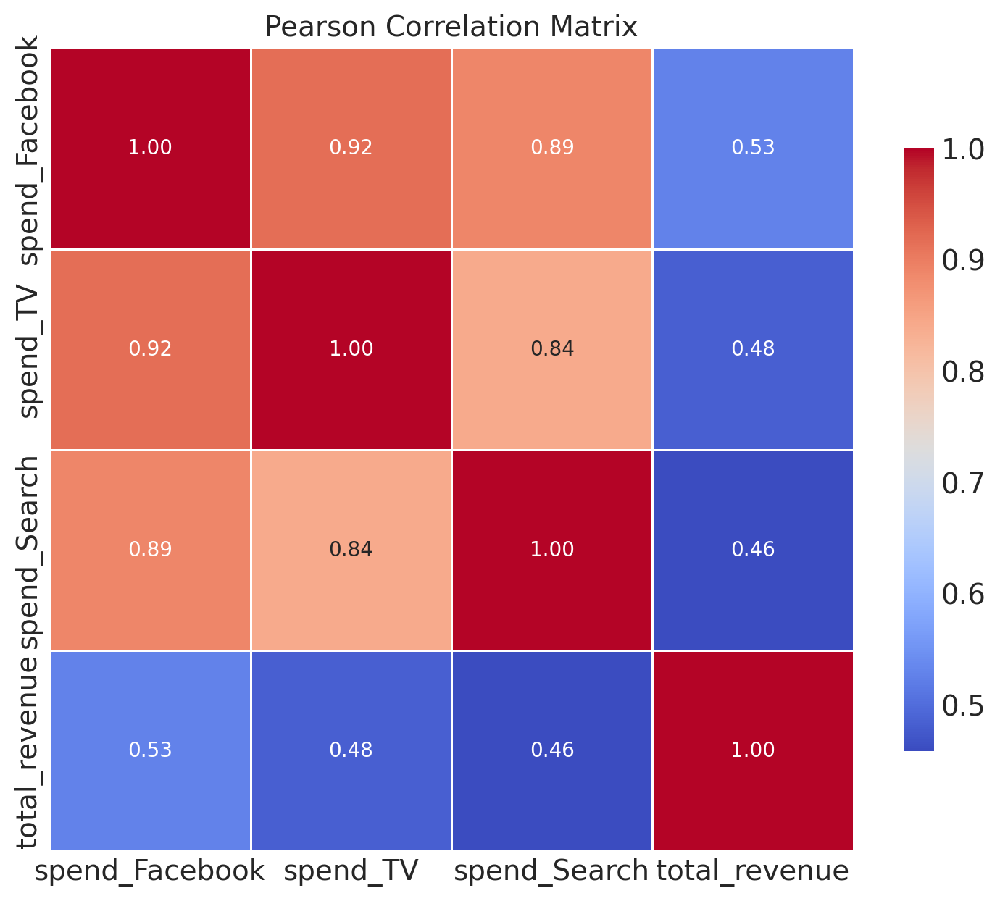

In [ ]:
import seaborn as sns

# Define columns to analyze
columns_to_analyze = ['spend_Facebook','spend_TV','spend_Search' , 'total_revenue']

# Calculate the Pearson correlation matrix for the selected columns
pearson_corr = data[columns_to_analyze].corr(method='pearson')

# Print the Pearson correlation matrix
print("Pearson Correlation Matrix:")
print(pearson_corr)

# Visualize the Pearson correlation matrix using a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(
    pearson_corr,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5,
    square=True,
    cbar_kws={"shrink": 0.75}
)
plt.title('Pearson Correlation Matrix', fontsize=14)
plt.tight_layout()
plt.show()

# Visualize pairwise relationships using Seaborn pairplot
sns.pairplot(data[columns_to_analyze], diag_kind='kde', corner=True, plot_kws={'alpha': 0.6})
plt.suptitle('Pairwise Relationships', y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
sns.pairplot(data)

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Ensure Date column is properly formatted
data["Date"] = pd.to_datetime(data["Date"], errors="coerce")

# Ensure other columns are numeric
for col in ["Tiktok", "Facebook", "Google_ads", "Sales"]:
    data[col] = pd.to_numeric(data[col], errors="coerce")

# Drop rows with NaN values
data = data.dropna()

import plotly.express as px

# Plot all columns against Date
fig = px.line(data, x="Date", y=["Google_ads", "Sales"],
              title="Time Series of Marketing Channels and Sales")
fig.show()

In [ ]:
# Update the treatment and outcome columns, as well as the time column
treatment_column = 'spend_Facebook'  # You can change this to 'Tiktok' or 'Facebook' as needed
outcome_column = 'Sales'
time_column = 'Date'

# Ensure 'Date' column is in datetime format
data[time_column] = pd.to_datetime(data[time_column])

# Plot the treatment-outcome relationship
plt.figure(figsize=(12, 6))  # Increase plot size for better visibility
dowhy.plotter.plot_treatment_outcome(data[treatment_column], data[outcome_column], data[time_column])

# Optional: Format the x-axis to show dates clearly
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.tight_layout()  # To ensure everything fits into the plot
plt.show()


ASSUMPTIONS FOR spend_Facebook



<ipython-input-5-dcefe3be01df>:31: UserWarning: The figure layout has changed to tight
  plt.xlim(0,1); plt.legend(); plt.tight_layout()


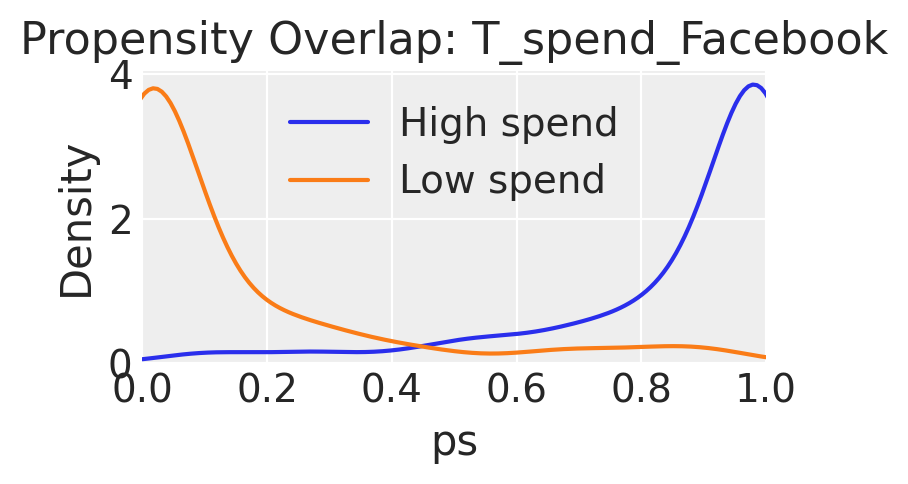


Balance for T_spend_Facebook
 covariate       raw | std-diff   IPTW | std-diff
 spend_TV              1.47           1.10
 spend_Search          1.46           1.13
SUTVA lag-1 corr (total_revenue ~ lag1 T_spend_Facebook): 0.020
Modularity (corr T,Y | T=0): nan

Positivity for T_spend_Facebook

  by spend_TV quantiles:
T_spend_Facebook          0    1
_bin                            
(-0.001, 31030.682]     183    0
(31030.682, 39860.883]  136   46
(39860.883, 49199.773]   44  138
(49199.773, 84748.581]    2  181

  by spend_Search quantiles:
T_spend_Facebook            0    1
_bin                              
(-0.001, 93750.057]       183    0
(93750.057, 122022.63]    127   55
(122022.63, 147017.329]    53  129
(147017.329, 249762.343]    2  181

ASSUMPTIONS FOR spend_TV



<ipython-input-5-dcefe3be01df>:31: UserWarning: The figure layout has changed to tight
  plt.xlim(0,1); plt.legend(); plt.tight_layout()


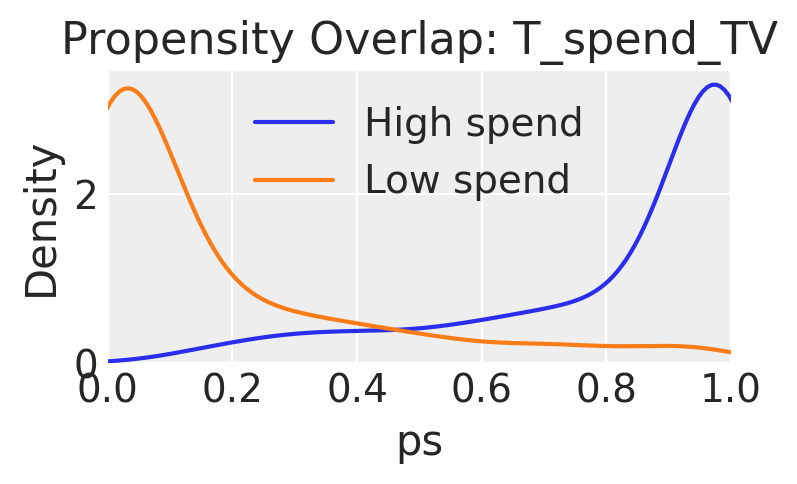


Balance for T_spend_TV
 covariate       raw | std-diff   IPTW | std-diff
 spend_Facebook        1.47           0.83
 spend_Search          1.36           0.83
SUTVA lag-1 corr (total_revenue ~ lag1 T_spend_TV): 0.006
Modularity (corr T,Y | T=0): nan

Positivity for T_spend_TV

  by spend_Facebook quantiles:
T_spend_TV                  0    1
_bin                              
(-0.001, 123730.245]      183    0
(123730.245, 159103.321]  136   46
(159103.321, 197678.332]   40  142
(197678.332, 320060.888]    6  177

  by spend_Search quantiles:
T_spend_TV                  0    1
_bin                              
(-0.001, 93750.057]       178    5
(93750.057, 122022.63]    120   62
(122022.63, 147017.329]    53  129
(147017.329, 249762.343]   14  169

ASSUMPTIONS FOR spend_Search



<ipython-input-5-dcefe3be01df>:31: UserWarning: The figure layout has changed to tight
  plt.xlim(0,1); plt.legend(); plt.tight_layout()


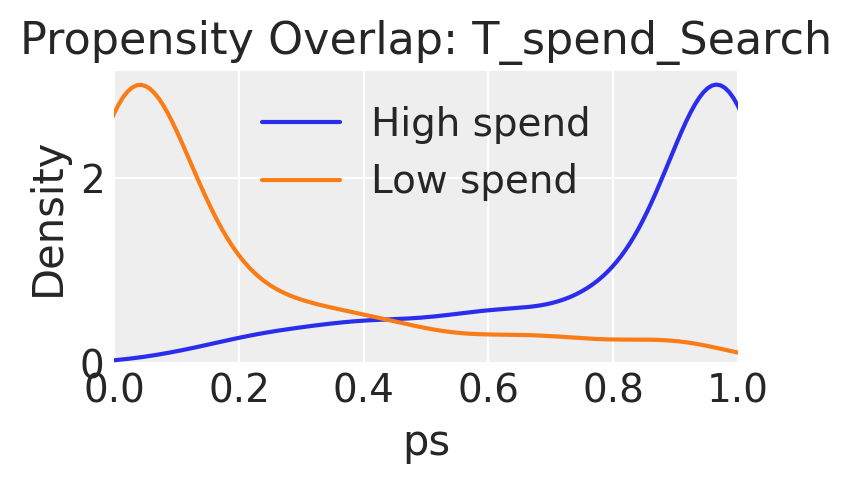


Balance for T_spend_Search
 covariate       raw | std-diff   IPTW | std-diff
 spend_Facebook        1.44           0.82
 spend_TV              1.36           0.69
SUTVA lag-1 corr (total_revenue ~ lag1 T_spend_Search): -0.016
Modularity (corr T,Y | T=0): nan

Positivity for T_spend_Search

  by spend_Facebook quantiles:
T_spend_Search              0    1
_bin                              
(-0.001, 123730.245]      183    0
(123730.245, 159103.321]  127   55
(159103.321, 197678.332]   50  132
(197678.332, 320060.888]    5  178

  by spend_TV quantiles:
T_spend_Search            0    1
_bin                            
(-0.001, 31030.682]     182    1
(31030.682, 39860.883]  116   66
(39860.883, 49199.773]   60  122
(49199.773, 84748.581]    7  176


In [ ]:
# spend_assumptions_checks.py

import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegressionCV
import matplotlib.pyplot as plt
import seaborn as sns

# ─── Load your data ────────────────────────────────────────────────────────────
df = pd.read_csv("masters_daily_level_dataset_rev50.csv", parse_dates=["DATE"])
df.set_index("DATE", inplace=True)

# ─── Binarize each channel spend at its median ─────────────────────────────────
for col in ["spend_Facebook","spend_TV","spend_Search"]:
    df[f"T_{col}"] = (df[col] > df[col].median()).astype(int)

# ─── Diagnostics functions ────────────────────────────────────────────────────
def check_exchangeability(df, T_col, covariate_cols):
    """Propensity‐score overlap + covariate balance for high vs low spend."""
    X = df[covariate_cols]
    y = df[T_col]
    m = LogisticRegressionCV(cv=5, scoring="neg_log_loss", max_iter=1000)
    m.fit(X, y)
    df["ps"] = m.predict_proba(X)[:,1]

    # Overlap plot
    plt.figure(figsize=(4,2.5))
    sns.kdeplot(df.loc[y==1,"ps"], label="High spend")
    sns.kdeplot(df.loc[y==0,"ps"], label="Low spend")
    plt.title(f"Propensity Overlap: {T_col}")
    plt.xlim(0,1); plt.legend(); plt.tight_layout()
    plt.show()

    # Standardized differences before/after IPTW
    def std_diff(col):
        m1 = df.loc[y==1,col].mean()
        m0 = df.loc[y==0,col].mean()
        s  = df[col].std()
        return (m1-m0)/s

    df["_w1"] = 1/df["ps"]
    df["_w0"] = 1/(1-df["ps"])
    def std_diff_iptw(col):
        w1 = df.loc[y==1,"_w1"]
        w0 = df.loc[y==0,"_w0"]
        m1 = np.average(df.loc[y==1,col], weights=w1)
        m0 = np.average(df.loc[y==0,col], weights=w0)
        s1 = df.loc[y==1,col].std()
        s0 = df.loc[y==0,col].std()
        return (m1-m0)/np.sqrt((s1**2+s0**2)/2)

    print(f"\nBalance for {T_col}")
    print(" covariate       raw | std-diff   IPTW | std-diff")
    for c in covariate_cols:
        raw = std_diff(c)
        iptw = std_diff_iptw(c)
        print(f" {c:15s}   {raw:8.2f}       {iptw:8.2f}")
    df.drop(columns=["ps","_w1","_w0"], inplace=True)

def check_sutva(df, T_col, Y_col):
    """Lagged T vs Y to flag potential interference."""
    df = df.sort_index()
    df["_T_lag1"] = df[T_col].shift(1)
    corr = df[[Y_col,"_T_lag1"]].dropna().corr().iloc[0,1]
    print(f"SUTVA lag-1 corr ({Y_col} ~ lag1 {T_col}): {corr:.3f}")
    df.drop(columns=["_T_lag1"], inplace=True)

def check_modularity(df, T_col, Y_col):
    """Should have no T–Y correlation within the low-spend group."""
    ctrl = df[df[T_col]==0]
    corr = ctrl[[T_col, Y_col]].corr().iloc[0,1]
    print(f"Modularity (corr T,Y | T=0): {corr:.3f}")

def check_positivity(df, T_col, covariate_cols, bins=4):
    """Ensure each covariate bin contains both high and low spend days."""
    print(f"\nPositivity for {T_col}")
    for c in covariate_cols:
        df["_bin"] = pd.qcut(df[c], q=bins, duplicates="drop")
        tab = pd.crosstab(df["_bin"], df[T_col])
        print(f"\n  by {c} quantiles:\n{tab}")
    df.drop(columns=["_bin"], inplace=True)

# ─── Run all checks for each spend channel ─────────────────────────────────────
Y = "total_revenue"
spend_cols = ["spend_Facebook","spend_TV","spend_Search"]

for ch in spend_cols:
    Tcol = f"T_{ch}"
    covars = [c for c in spend_cols if c!=ch]
    print("\n" + "="*60)
    print(f"ASSUMPTIONS FOR {ch}\n")
    check_exchangeability(df, Tcol, covars)
    check_sutva(df, Tcol, Y)
    check_modularity(df, Tcol, Y)
    check_positivity(df, Tcol, covars)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression

def check_causal_assumptions(
    df: pd.DataFrame,
    treatment: str,
    outcome: str,
    covariates: list[str],
    ps_trim=(0.05, 0.95),
    balance_thresh=0.1,
    sutva_thresh=0.1
):
    """
    Checks Exchangeability (overlap + balance), Positivity, SUTVA and Modularity
    for a binary high/low split of `treatment` at its median.

    Prints a pass/fail report for each assumption and returns (balance_df, summary_dict).
    """
    # 1) binarize at median
    med = df[treatment].median()
    df = df.copy()
    df['T'] = (df[treatment] > med).astype(int)

    # 2) propensity scores
    X = df[covariates]
    y = df['T']
    lr = LogisticRegression(solver='liblinear').fit(X, y)
    df['ps'] = lr.predict_proba(X)[:,1]

    # 3) Overlap & Positivity
    ps_t = df.loc[df['T']==1, 'ps']
    ps_c = df.loc[df['T']==0, 'ps']
    overlap = (max(ps_t.min(), ps_c.min()), min(ps_t.max(), ps_c.max()))
    prop_in_trim = df['ps'].between(*ps_trim).mean()
    pos_pass = prop_in_trim > (ps_trim[1] - ps_trim[0])

    # 4) Balance (std‐diff raw & IPTW)
    def std_diff(series, t):
        return (series[t==1].mean() - series[t==0].mean()) / series.std(ddof=1)

    raw_sd = {cov: abs(std_diff(df[cov], df['T'])) for cov in covariates}
    df['w'] = np.where(df['T']==1, 1/df['ps'], 1/(1-df['ps']))
    w_sd = {}
    for cov in covariates:
        m1 = np.average(df.loc[df['T']==1, cov], weights=df.loc[df['T']==1, 'w'])
        m0 = np.average(df.loc[df['T']==0, cov], weights=df.loc[df['T']==0, 'w'])
        w_sd[cov] = abs((m1 - m0) / df[cov].std(ddof=1))

    bal = pd.DataFrame({
        'Covariate':       covariates,
        'StdDiff (raw)':   [raw_sd[c] for c in covariates],
        'StdDiff (IPTW)':  [w_sd[c]   for c in covariates],
    })
    bal['Exchangeability Pass'] = (bal['StdDiff (raw)'] < balance_thresh) & \
                                  (bal['StdDiff (IPTW)'] < balance_thresh)

    # 5) SUTVA: lag-1 autocorr of outcome
    autocorr = df[outcome].autocorr(lag=1)
    sutva_pass = abs(autocorr) < sutva_thresh

    # 6) Modularity: corr(Treatment, Outcome) *within* control arm
    if df['T'].sum() < len(df) - 1:
        mod_corr = df[df['T']==0][[treatment, outcome]].corr().iloc[0,1]
        mod_pass = abs(mod_corr) < balance_thresh
    else:
        mod_corr, mod_pass = np.nan, False

    # 7) Print summary
    print(f"\n=== ASSUMPTIONS FOR `{treatment}` ===\n")

    # Overlap & Positivity
    print(f"1) Overlap in PS: [{overlap[0]:.3f}, {overlap[1]:.3f}]  "
          f"{'PASS' if overlap[1]>overlap[0] else 'FAIL'}")
    print(f"   Positivity: {prop_in_trim*100:.1f}% of units in PS∈{ps_trim}  "
          f"{'PASS' if pos_pass else 'FAIL'}\n")

    # Balance
    print("2) Exchangeability (Covariate Balance):")
    print(bal.to_string(index=False, float_format='%.3f'))
    print()

    # SUTVA
    print(f"3) SUTVA (lag-1 autocorr of {outcome}): {autocorr:.3f}  "
          f"{'PASS' if sutva_pass else 'FAIL'}\n")

    # Modularity
    print(f"4) Modularity (corr({treatment},{outcome}|T=0)): {mod_corr:.3f}  "
          f"{'PASS' if mod_pass else 'FAIL'}\n")

    # Bonus: show a quick overlap plot
    fig, ax = plt.subplots(figsize=(5,3))
    df[df['T']==1]['ps'].plot(kind='kde', label='Treated', ax=ax)
    df[df['T']==0]['ps'].plot(kind='kde', label='Control', ax=ax)
    ax.axvspan(ps_trim[0], ps_trim[1], color='grey', alpha=0.2)
    ax.set_xlim(0,1)
    ax.set_xlabel("Propensity score")
    ax.set_title("PS Overlap & Positivity Region")
    ax.legend()
    plt.tight_layout()
    plt.show()

    summary = {
        'overlap': overlap,
        'positivity_%': prop_in_trim*100,
        'autocorr': autocorr,
        'mod_corr': mod_corr
    }

    return bal, summary


=== ASSUMPTIONS FOR `spend_Facebook` ===

1) Overlap in PS: [0.563, 0.651]  PASS
   Positivity: 100.0% of units in PS∈(0.05, 0.95)  PASS

2) Exchangeability (Covariate Balance):
   Covariate  StdDiff (raw)  StdDiff (IPTW)  Exchangeability Pass
    spend_TV          1.475           1.400                 False
spend_Search          1.461           1.430                 False

3) SUTVA (lag-1 autocorr of total_revenue): -0.013  PASS

4) Modularity (corr(spend_Facebook,total_revenue|T=0)): 0.410  FAIL



<ipython-input-6-e62eff1732c0>:101: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


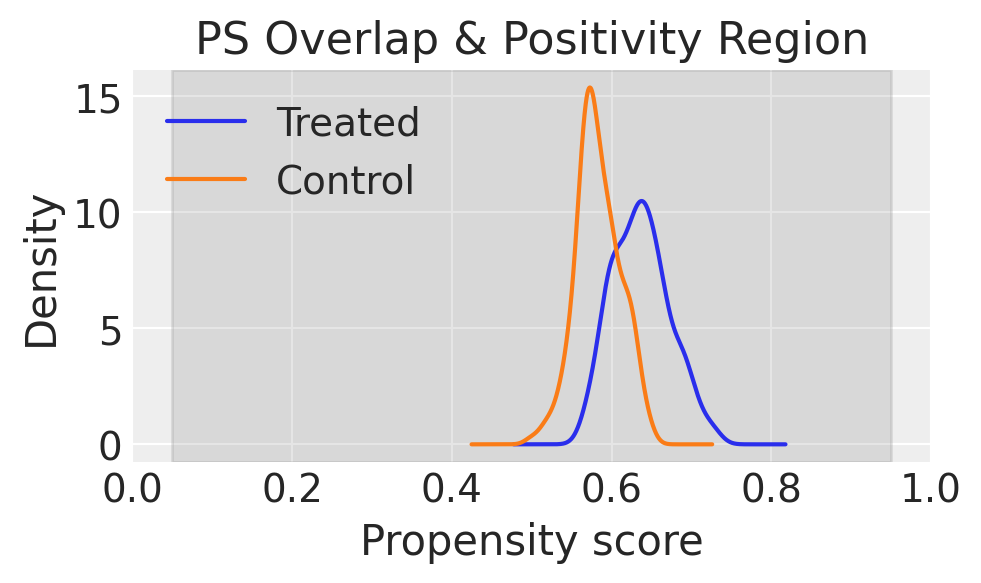


=== Assumptions for spend_Facebook ===
{'overlap': (0.5625322787329561, 0.6506553612998299), 'positivity_%': np.float64(100.0), 'autocorr': np.float64(-0.013200416754393601), 'mod_corr': np.float64(0.41044719683958325)}

=== ASSUMPTIONS FOR `spend_TV` ===

1) Overlap in PS: [0.515, 0.688]  PASS
   Positivity: 100.0% of units in PS∈(0.05, 0.95)  PASS

2) Exchangeability (Covariate Balance):
     Covariate  StdDiff (raw)  StdDiff (IPTW)  Exchangeability Pass
spend_Facebook          1.475           1.400                 False
  spend_Search          1.362           1.369                 False

3) SUTVA (lag-1 autocorr of total_revenue): -0.013  PASS

4) Modularity (corr(spend_TV,total_revenue|T=0)): 0.392  FAIL



<ipython-input-6-e62eff1732c0>:101: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


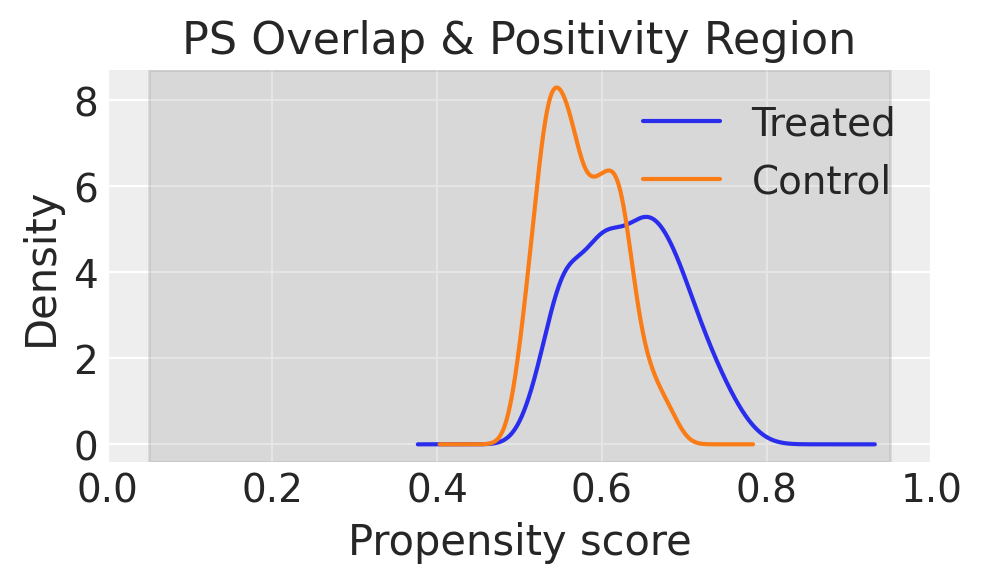


=== Assumptions for spend_TV ===
{'overlap': (0.5152879022745253, 0.6883943020164072), 'positivity_%': np.float64(100.0), 'autocorr': np.float64(-0.013200416754393601), 'mod_corr': np.float64(0.3922368166891573)}

=== ASSUMPTIONS FOR `spend_Search` ===

1) Overlap in PS: [0.561, 0.656]  PASS
   Positivity: 100.0% of units in PS∈(0.05, 0.95)  PASS

2) Exchangeability (Covariate Balance):
     Covariate  StdDiff (raw)  StdDiff (IPTW)  Exchangeability Pass
spend_Facebook          1.443           1.379                 False
      spend_TV          1.357           1.320                 False

3) SUTVA (lag-1 autocorr of total_revenue): -0.013  PASS

4) Modularity (corr(spend_Search,total_revenue|T=0)): 0.365  FAIL



<ipython-input-6-e62eff1732c0>:101: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


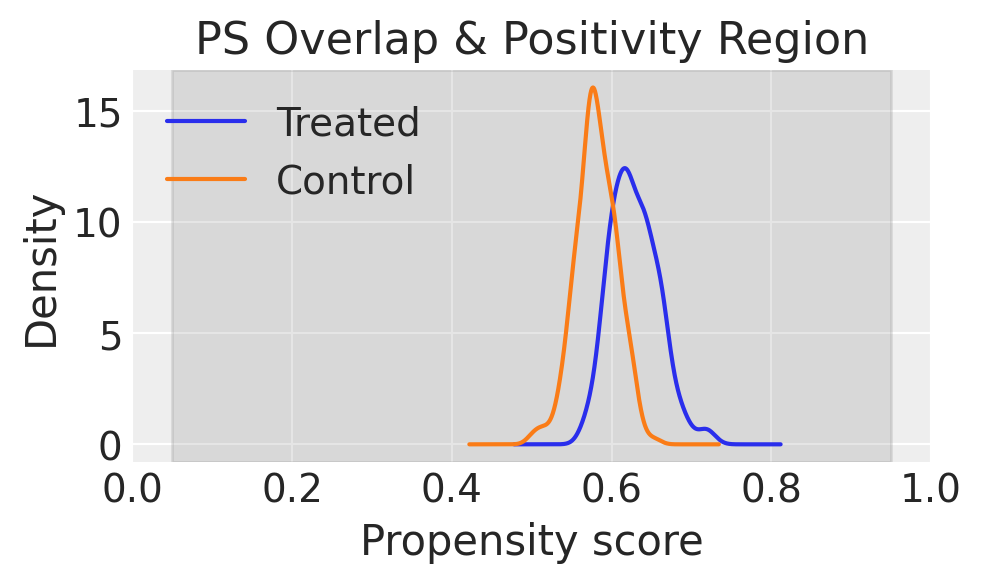


=== Assumptions for spend_Search ===
{'overlap': (0.5613884562891602, 0.6562421329064188), 'positivity_%': np.float64(100.0), 'autocorr': np.float64(-0.013200416754393601), 'mod_corr': np.float64(0.36493298310302874)}


In [ ]:
# define your channels and their “other two” as covariates
treatments = ["spend_Facebook", "spend_TV", "spend_Search"]
covariate_map = {
    "spend_Facebook": ["spend_TV", "spend_Search"],
    "spend_TV":       ["spend_Facebook", "spend_Search"],
    "spend_Search":   ["spend_Facebook", "spend_TV"],
}

# store results in a dict
assumption_results = {}

for treat in treatments:
    covs = covariate_map[treat]
    balance_df, summary = check_causal_assumptions(
        df=data,
        treatment=treat,
        outcome="total_revenue",
        covariates=covs
    )
    assumption_results[treat] = {
        "balance_table": balance_df,
        "summary": summary
    }
    # print a high-level pass/fail for each assumption
    print(f"\n=== Assumptions for {treat} ===")
    print(summary)

# now assumption_results contains both the full balance tables
# and the summary pass/fail for each channel

# Graphic Causal Model

In [ ]:
 # pip install autogluon
! pip install autogluon==1.1.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.2/57.2 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.7/130.7 kB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of thinc to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 21.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 kB 4.2 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of requests[socks] to determine which version is co

In [ ]:
from dowhy import gcm

In [ ]:
help(gcm.fit)
help(gcm.evaluate_causal_model)
help(gcm.StructuralCausalModel)
help(gcm.auto.assign_causal_mechanisms)

Help on function fit in module dowhy.gcm.fitting_sampling:

fit(causal_model: dowhy.gcm.causal_models.ProbabilisticCausalModel, data: pandas.core.frame.DataFrame, return_evaluation_summary: bool = False)
    Fits the causal mechanism of each node to the data. This is done by iterating over the nodes in the graph and
    fitting their assigned causal mechanisms individually to the data by calling the corresponding fit function. Due to
    the modularity assumption, we can fit each mechanism in the graph independently of the other mechanisms. For root
    nodes, the training data is the corresponding column in the provided data. For non-root nodes, the data is based on
    a node's parents and the node itself. Before a node is fitted, this function first validates whether the assigned
    mechanism is valid, i.e., whether a root node follows a StochasticModel and whether a non-root node follows a
    ConditionalStochasticModel.
    
    The details of fitting a causal mechanism depend on

### Model

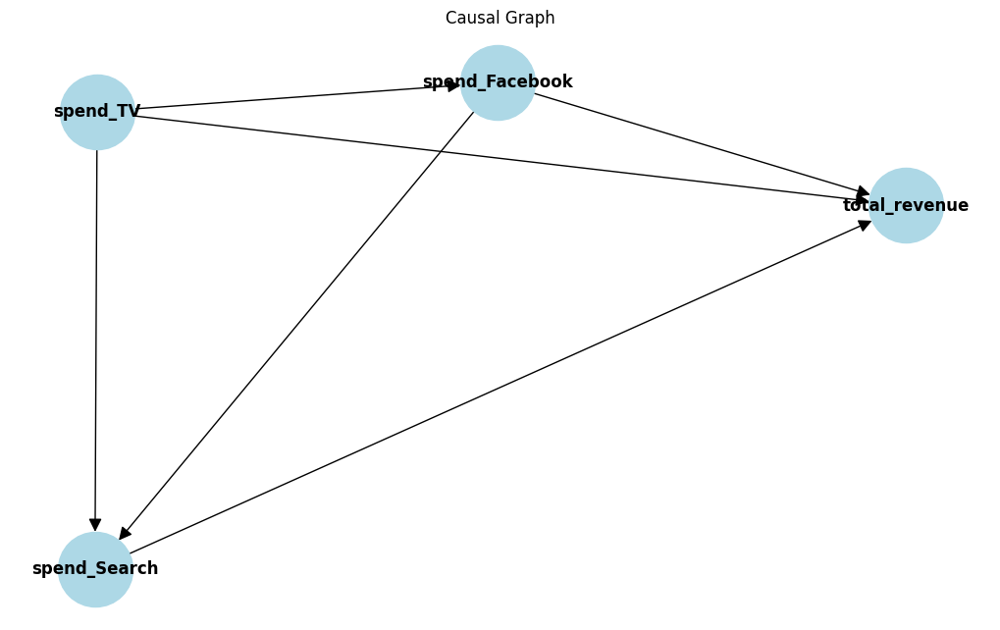

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Define the causal graph
causal_graph = nx.DiGraph([('spend_TV', 'spend_Facebook'),
    ('spend_TV', 'spend_Search'),
    ('spend_Facebook', 'spend_Search'),
    ('spend_Facebook', 'total_revenue'),
    ('spend_Search', 'total_revenue'),
    ('spend_TV', 'total_revenue')
])

# Draw the causal graph
plt.figure(figsize=(10, 6))
pos = nx.spring_layout(causal_graph)  # Position nodes using the spring layout
nx.draw(causal_graph, pos, with_labels=True, node_size=3000, node_color='lightblue', font_size=12, font_weight='bold', arrowsize=20)
plt.title('Causal Graph')
plt.show()

In [ ]:
import networkx as nx
from dowhy import gcm
from dowhy.gcm import auto


# Define the causal graph
causal_graph = nx.DiGraph([
    ('spend_TV', 'spend_Facebook'),
    ('spend_TV', 'spend_Search'),
    ('spend_Facebook', 'spend_Search'),
    ('spend_Facebook', 'total_revenue'),
    ('spend_Search', 'total_revenue'),
    ('spend_TV', 'total_revenue')
])

causal_model = gcm.StructuralCausalModel(causal_graph)

#auto_assignment_summary = gcm.auto.assign_causal_mechanisms(causal_model, data)

auto_assignment_summary = auto.assign_causal_mechanisms(
    causal_model,
    based_on=data,
    quality=auto.AssignmentQuality.BEST  # Try BETTER or BEST
)


In [ ]:
print(auto_assignment_summary)


When using this auto assignment function, the given data is used to automatically assign a causal mechanism to each node. Note that causal mechanisms can also be customized and assigned manually.
The following types of causal mechanisms are considered for the automatic selection:

If root node:
An empirical distribution, i.e., the distribution is represented by randomly sampling from the provided data. This provides a flexible and non-parametric way to model the marginal distribution and is valid for all types of data modalities.

If non-root node and the data is continuous:
Additive Noise Models (ANM) of the form X_i = f(PA_i) + N_i, where PA_i are the parents of X_i and the unobserved noise N_i is assumed to be independent of PA_i.To select the best model for f, different regression models are evaluated and the model with the smallest mean squared error is selected.Note that minimizing the mean squared error here is equivalent to selecting the best choice of an ANM.

If non-root node

In [ ]:
gcm.fit(causal_model, data)
print(gcm.evaluate_causal_model(causal_model, data))


Fitting causal mechanism of node spend_Facebook:  25%|██▌       | 1/4 [00:00<00:00, 72.06it/s]


PicklingError: Can't pickle <class 'sklearn.feature_extraction.text.CountVectorizer'>: it's not the same object as sklearn.feature_extraction.text.CountVectorizer

In [ ]:
import dowhy
print(dowhy.__version__)

0.12


In [ ]:
import dowhy.gcm as gcm

# Use help() to get information about the evaluate_causal_model function
help(gcm.evaluate_causal_model)

# Use dir() to list the attributes and methods of the gcm module
print(dir(gcm))

Help on function evaluate_causal_model in module dowhy.gcm.model_evaluation:

evaluate_causal_model(causal_model: dowhy.gcm.causal_models.ProbabilisticCausalModel, data: pandas.core.frame.DataFrame, max_num_samples: int = -1, evaluate_causal_mechanisms: bool = True, compare_mechanism_baselines: bool = False, evaluate_invertibility_assumptions: bool = True, evaluate_overall_kl_divergence: bool = True, evaluate_causal_structure: bool = True, config: Optional[dowhy.gcm.model_evaluation.EvaluateCausalModelConfig] = None) -> dowhy.gcm.model_evaluation.CausalModelEvaluationResult
    Evaluates the given causal model by running different evaluations.
    
    Evaluation of Causal Mechanisms:
    The quality of the causal mechanisms is assessed using k-fold cross validation. This means that the models are trained
    from scratch multiple times, which might take a significant amount of time for larger models. Within each fold, the models
    are assessed by different metrics. For all models, t

# Performing Causal Tasks



## Interventions

In [ ]:
help(gcm.interventional_samples)

Help on function interventional_samples in module dowhy.gcm.whatif:

interventional_samples(causal_model: dowhy.gcm.causal_models.ProbabilisticCausalModel, interventions: Dict[Any, Callable[[numpy.ndarray], Union[float, numpy.ndarray]]], observed_data: Optional[pandas.core.frame.DataFrame] = None, num_samples_to_draw: Optional[int] = None) -> pandas.core.frame.DataFrame
    Performs intervention on nodes in the causal graph.
    
    :param causal_model: The probabilistic causal model we perform this intervention on .
    :param interventions: Dictionary containing the interventions we want to perform, keyed by node name. An
                          intervention is a function that takes a value as input and returns another value.
                          For example, `{'X': lambda x: 2}` mimics the atomic intervention *do(X:=2)*.
                          A soft intervention can be formulated as `{'X': lambda x: 0.2 * x}`.
    :param observed_data: Optionally, data on which to perfor

In [ ]:
# explicitly perform the intervention
samples = gcm.interventional_samples(causal_model,
                                     {'spend_Facebook': lambda x: 300000},
                                     num_samples_to_draw=1000)
samples.head()

,spend_TV,spend_Facebook,spend_Search,total_revenue
0,26545.148530,300000,198616.579796,2.056540e+06
1,22964.751381,300000,136550.137333,-5.522896e+05
2,42176.279867,300000,180794.085027,3.474358e+06
3,40880.809922,300000,178812.907063,4.644883e+06
4,52373.794971,300000,159629.455241,3.774640e+06


In [ ]:
# Calculate average spend
avg_spend = {
    'spend_Facebook': data['spend_Facebook'].mean(),
    'spend_TV': data['spend_TV'].mean(),
    'spend_Search': data['spend_Search'].mean()
}

# Compute ROI function
def compute_roi(spend_col, alt_val, base_val=0, target='total_revenue'):
    ace = average_causal_effect(
        causal_model,
        target_node=target,
        interventions_alternative={spend_col: lambda _: alt_val},
        interventions_reference={spend_col: lambda _: base_val},
        observed_data=df
    )
    roi = ace / (alt_val - base_val)
    return ace, roi

# Estimate ACE and ROI
results = {}
for channel, alt_spend in avg_spend.items():
    ace, roi = compute_roi(channel, alt_spend)
    results[channel] = {'ACE': ace, 'ROI': roi}

# Display results
for ch, vals in results.items():
    print(f"{ch}: ACE = {vals['ACE']:.2f}, ROI = {vals['ROI']:.2f}")

NameError: name 'average_causal_effect' is not defined

ACE: 1,702,456.82


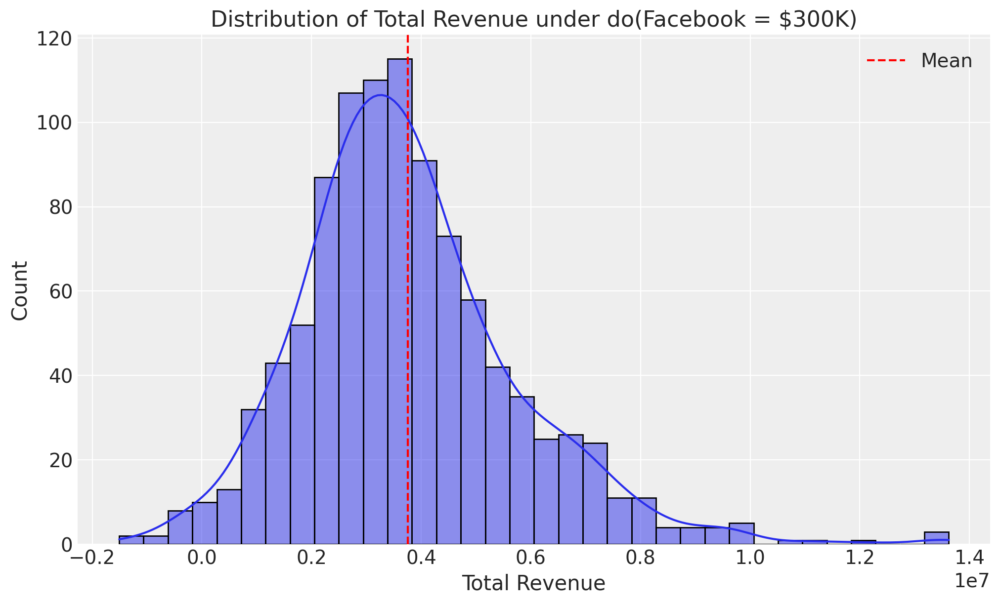

In [ ]:
from dowhy.gcm import average_causal_effect, interventional_samples

# Step 1: Run ACE
ace = average_causal_effect(
    causal_model,
    target_node='total_revenue',
    interventions_alternative={'spend_Facebook': lambda _: 300000},
    interventions_reference={'spend_Facebook': lambda _: 0},
    observed_data=data
)
print(f"ACE: {ace:,.2f}")

# Step 2: Get full distribution
samples = interventional_samples(
    causal_model,
    interventions={'spend_Facebook': lambda _: 300000},
    num_samples_to_draw=1000
)

# Analyze and visualize
import matplotlib.pyplot as plt
import seaborn as sns

sns.histplot(samples['total_revenue'], kde=True)
plt.axvline(samples['total_revenue'].mean(), color='red', linestyle='--', label='Mean')
plt.title('Distribution of Total Revenue under do(Facebook = $300K)')
plt.xlabel('Total Revenue')
plt.legend()
plt.show()

- Calculated the Average Causal Effect (ACE)
You compared the mean revenue when Facebook = 300K to the mean when Facebook = 0.
- The result: $1,702,456.82 — thats your estimated causal impact of spending 300K on Facebook.
- Visualized the Distribution
You plotted the simulated outcomes under the intervention:
	•	It showed uncertainty.
	•	You could see whether results were consistently good or highly variable.

Intervene and visualise one channel

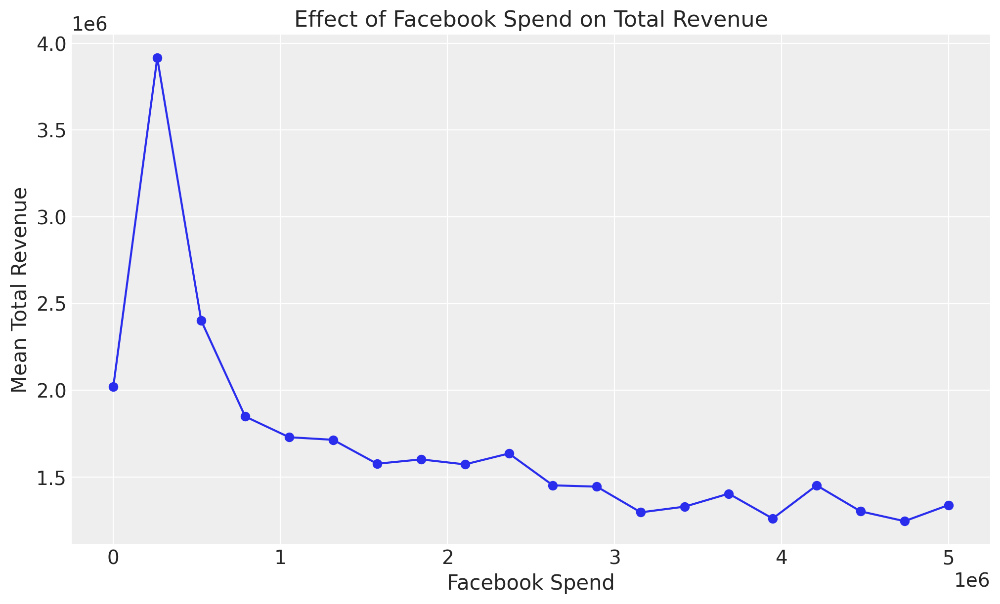

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define a range of values for spend_Facebook
spend_values = np.linspace(0, 5000000, 20)  # Adjust the upper limit as needed, 20 steps between 0 and 1,000,000

# Initialize an empty list to store the results
results = []

# Loop through different spend values and perform the intervention
for spend in spend_values:
    # Perform intervention for each value of spend_Facebook
    samples = gcm.interventional_samples(causal_model,
                                         {'spend_Facebook': lambda x: spend},
                                         num_samples_to_draw=1000)

    # Compute the mean of the relevant outcome variable (e.g., total_revenue) across all samples
    mean_revenue = samples['total_revenue'].mean()

    # Store the results
    results.append(mean_revenue)

# Convert results into a DataFrame for easy plotting
df_results = pd.DataFrame({'spend_Facebook': spend_values, 'mean_revenue': results})

# Plot the results to visualize diminishing returns
plt.figure(figsize=(10, 6))
plt.plot(df_results['spend_Facebook'], df_results['mean_revenue'], marker='o')
plt.xlabel('Facebook Spend')
plt.ylabel('Mean Total Revenue')
plt.title('Effect of Facebook Spend on Total Revenue')
plt.grid(True)
plt.show()

ATE

In [ ]:
from dowhy.gcm import average_causal_effect

# Facebook
ace_facebook_off = average_causal_effect(
    causal_model=causal_model,
    target_node='total_revenue',
    interventions_alternative={'spend_Facebook': lambda _: 0},
    interventions_reference={'spend_Facebook': lambda _: data['spend_Facebook'].mean()},
    observed_data=data
)

# TV
ace_tv = average_causal_effect(
    causal_model=causal_model,
    target_node='total_revenue',
    interventions_alternative={'spend_TV': lambda _: 0},
    interventions_reference={'spend_TV': lambda _: data['spend_TV'].mean()},
    observed_data=data
)

# Search
ace_search = average_causal_effect(
    causal_model=causal_model,
    target_node='total_revenue',
    interventions_alternative={'spend_Search': lambda _: 0},
    interventions_reference={'spend_Search': lambda _: data['spend_Search'].mean()},
    observed_data=data
)

# Print results
print(f"ACE of turning OFF Facebook (vs avg spend): {ace_facebook_off:,.2f}")
print(f"ACE of turning OFF TV (vs avg spend): {ace_tv:,.2f}")
print(f"ACE of turning OFF Search (vs avg spend): {ace_search:,.2f}")

ACE of turning OFF Facebook (vs avg spend): -1,041,147.60
ACE of turning OFF TV (vs avg spend): -2,426,633.37
ACE of turning OFF Search (vs avg spend): -320,218.61


In [ ]:
from dowhy.gcm import interventional_samples
import numpy as np
import pandas as pd

# ---------- 1 ·  Setup ----------------------------------------------------
channel        = 'spend_Facebook'              # change for TV / Search
delta_euros    = data[channel].std()           # one SD  (~ €50k for FB)
n_boot         = 1_000
rng            = np.random.default_rng(42)

obs_mean       = data[channel].mean()
other_channels = ['spend_TV', 'spend_Search']

def const(val):
    """Return a callable that always outputs val (API requires callables)."""
    return lambda _x, _val=val: _val           # default‑arg captures value

fixed_intervs  = {ch: const(data[ch].mean()) for ch in other_channels}

slopes = []

# ---------- 2 ·  Bootstrap loop ------------------------------------------
for _ in range(n_boot):
    df_boot = data.sample(frac=1, replace=True,
                          random_state=rng.integers(1e9))

    ref_dict = {**fixed_intervs, channel: const(obs_mean)}
    alt_dict = {**fixed_intervs, channel: const(obs_mean + delta_euros)}

    # paired draws: identical exogenous noise in both worlds
    seed = rng.integers(1e9)

    ref_world = interventional_samples(
        causal_model, ref_dict, observed_data=df_boot,
        num_samples_to_draw=len(df_boot), seed=seed)

    alt_world = interventional_samples(
        causal_model, alt_dict, observed_data=df_boot,
        num_samples_to_draw=len(df_boot), seed=seed)

    ace   = alt_world['total_revenue'].mean() - ref_world['total_revenue'].mean()
    slopes.append(ace / delta_euros)           # €/€ slope

# ---------- 3 ·  Point estimate & 95 % CI ---------------------------------
slopes  = np.asarray(slopes)
point   = slopes.mean()
ci_low  = np.percentile(slopes, 2.5)
ci_high = np.percentile(slopes, 97.5)

print(f"{channel}: {point:,.2f} €/€  [{ci_low:,.2f}, {ci_high:,.2f}]")

TypeError: interventional_samples() got an unexpected keyword argument 'seed'

TypeError: 'numpy.float64' object is not callable

In [ ]:
help(average_causal_effect)

Help on function average_causal_effect in module dowhy.gcm.whatif:

average_causal_effect(causal_model: dowhy.gcm.causal_models.ProbabilisticCausalModel, target_node: Any, interventions_alternative: Dict[Any, Callable[[numpy.ndarray], Union[float, numpy.ndarray]]], interventions_reference: Dict[Any, Callable[[numpy.ndarray], Union[float, numpy.ndarray]]], observed_data: Optional[pandas.core.frame.DataFrame] = None, num_samples_to_draw: Optional[int] = None) -> float
    Estimates the average causal effect (ACE) on the target of two different sets of interventions.
    The interventions can be specified through the parameters `interventions_alternative` and `interventions_reference`.
    For example, if the alternative intervention is do(T := 1) and the reference intervention
    is do(T := 0), then the average causal effect is given by ACE = E[Y | do(T := 1)] - E[Y | do(T := 0)]:
        >>> average_causal_effect(causal_model, 'Y', {'T': lambda _ : 1}, {'T': lambda _ : 0})
    
    We 

In [ ]:
import numpy as np
import pandas as pd
from dowhy.gcm import average_causal_effect
from tqdm import tqdm

def bootstrap_ace_ci(causal_model, target_node, interventions_alternative, interventions_reference, data, n_bootstrap=100, ci=0.95):
    ace_values = []
    for _ in tqdm(range(n_bootstrap), desc=f"Bootstrapping for {list(interventions_alternative.keys())[0]}"):
        sample = data.sample(frac=1, replace=True)
        ace = average_causal_effect(
            causal_model=causal_model,
            target_node=target_node,
            interventions_alternative=interventions_alternative,
            interventions_reference=interventions_reference,
            observed_data=sample
        )
        ace_values.append(ace)

    lower = np.percentile(ace_values, (1 - ci) / 2 * 100)
    upper = np.percentile(ace_values, (1 + ci) / 2 * 100)
    mean = np.mean(ace_values)
    return mean, lower, upper

# Estimate ACE and CIs for each channel
channels = ['Facebook', 'TV', 'Search']
intervention_keys = ['spend_Facebook', 'spend_TV', 'spend_Search']
results = []

for channel, key in zip(channels, intervention_keys):
    mean_spend = data[key].mean()
    ace, ci_low, ci_high = bootstrap_ace_ci(
        causal_model,
        target_node='total_revenue',
        interventions_alternative={key: lambda _: 0},
        interventions_reference={key: lambda _: mean_spend},
        data=data
    )
    roi = ace / mean_spend
    results.append({
        "Channel": channel,
        "Average Spend": mean_spend,
        "ACE (Revenue Impact)": ace,
        "95% CI Lower": ci_low,
        "95% CI Upper": ci_high,
        "Causal ROI": roi
    })

# Format results
df = pd.DataFrame(results).sort_values("Causal ROI", ascending=False)
df['Average Spend'] = df['Average Spend'].map('${:,.0f}'.format)
df['ACE (Revenue Impact)'] = df['ACE (Revenue Impact)'].map('${:,.0f}'.format)
df['95% CI Lower'] = df['95% CI Lower'].map('${:,.0f}'.format)
df['95% CI Upper'] = df['95% CI Upper'].map('${:,.0f}'.format)
df['Causal ROI'] = df['Causal ROI'].map('{:.2f}x'.format)

print(df)

Bootstrapping for spend_Search: 100%|██████████| 100/100 [00:12<00:00,  8.08it/s]

    Channel Average Spend ACE (Revenue Impact) 95% CI Lower 95% CI Upper  \
2    Search      $121,388            $-251,504    $-486,246    $-103,537   
0  Facebook      $161,696          $-1,119,040  $-1,309,594    $-918,346   
1        TV       $40,585          $-2,416,629  $-2,577,236  $-2,207,583   

  Causal ROI  
2     -2.07x  
0     -6.92x  
1    -59.55x  


Intervene and visualise all channels

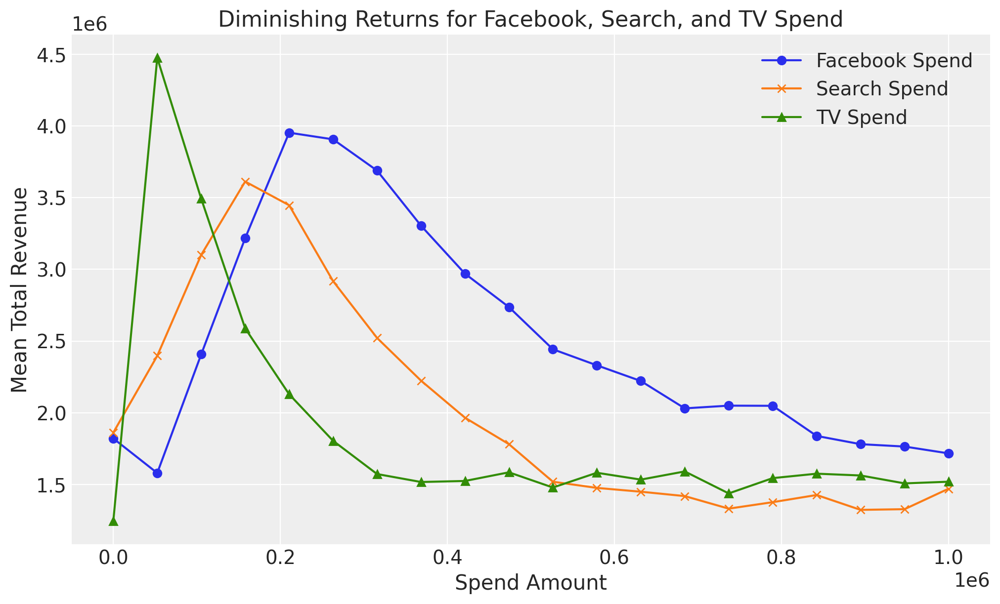

In [ ]:
# Define a range of values for spend_Facebook, spend_Search, and spend_TV
spend_values = np.linspace(0, 1000000, 20)  # Same spend range for all channels

# Initialize empty lists to store the results for each channel
results_facebook = []
results_search = []
results_tv = []

# Loop through different spend values for each channel
for spend in spend_values:
    # Perform intervention for Facebook Spend
    samples_facebook = gcm.interventional_samples(causal_model,
                                                 {'spend_Facebook': lambda x: spend},
                                                 num_samples_to_draw=1000)
    mean_revenue_facebook = samples_facebook['total_revenue'].mean()
    results_facebook.append(mean_revenue_facebook)

    # Perform intervention for Search Spend
    samples_search = gcm.interventional_samples(causal_model,
                                               {'spend_Search': lambda x: spend},
                                               num_samples_to_draw=1000)
    mean_revenue_search = samples_search['total_revenue'].mean()
    results_search.append(mean_revenue_search)

    # Perform intervention for TV Spend
    samples_tv = gcm.interventional_samples(causal_model,
                                           {'spend_TV': lambda x: spend},
                                           num_samples_to_draw=1000)
    mean_revenue_tv = samples_tv['total_revenue'].mean()
    results_tv.append(mean_revenue_tv)

# Convert results into a DataFrame for easy plotting
df_results = pd.DataFrame({
    'spend': spend_values,
    'Facebook Revenue': results_facebook,
    'Search Revenue': results_search,
    'TV Revenue': results_tv
})

# Plot the results to visualize diminishing returns for all three channels
plt.figure(figsize=(10, 6))
plt.plot(df_results['spend'], df_results['Facebook Revenue'], label='Facebook Spend', marker='o')
plt.plot(df_results['spend'], df_results['Search Revenue'], label='Search Spend', marker='x')
plt.plot(df_results['spend'], df_results['TV Revenue'], label='TV Spend', marker='^')

plt.xlabel('Spend Amount')
plt.ylabel('Mean Total Revenue')
plt.title('Diminishing Returns for Facebook, Search, and TV Spend')
plt.legend()
plt.grid(True)
plt.show()

<ipython-input-25-d923827d3e01>:93: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-25-d923827d3e01>:93: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


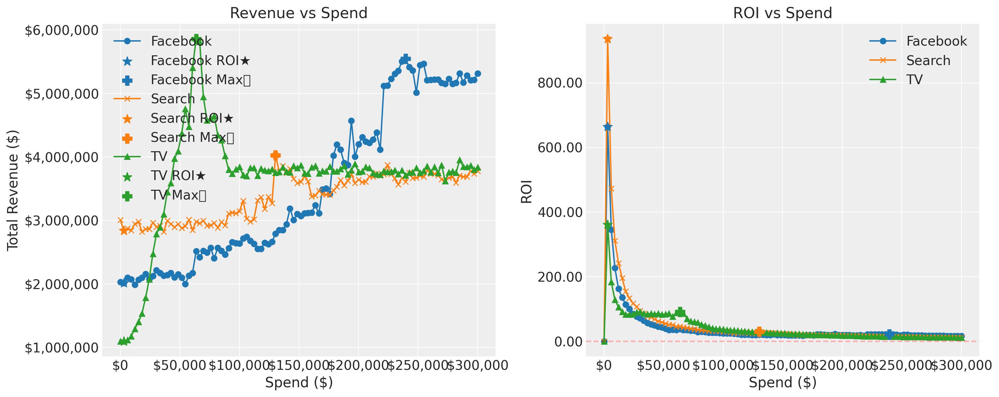


📊 Summary of ROI-optimal vs Revenue-maximizing spend:
    Channel  ROI Optimal Spend  Max ROI  Revenue at ROI Optimal  \
0  Facebook          $3,030.30  $663.69           $2,014,224.32   
1    Search          $3,030.30  $936.06           $2,839,568.12   
2        TV          $3,030.30  $361.12           $1,097,333.23   

   Revenue Optimal Spend   Max Revenue  ROI at Revenue Optimal  
0            $239,393.94 $5,546,209.83                  $22.17  
1            $130,303.03 $4,026,767.00                  $29.90  
2             $63,636.36 $5,860,287.41                  $91.09  


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
from dowhy import gcm

def analyze_marketing_channels(causal_model, channels, spend_range=(0, 300_000), num_points=100, samples_per_point=1000):
    spend_values = np.linspace(spend_range[0], spend_range[1], num_points)
    results = {channel: [] for channel in channels}

    for spend in spend_values:
        for channel in channels:
            samples = gcm.interventional_samples(
                causal_model,
                {f'spend_{channel}': lambda x: spend},
                num_samples_to_draw=samples_per_point
            )
            mean_revenue = samples['total_revenue'].mean()
            roi = (mean_revenue - spend) / spend if spend > 0 else 0
            results[channel].append({
                'spend': spend,
                'revenue': mean_revenue,
                'roi': roi
            })

    # Convert to DataFrame
    df_results = pd.DataFrame({'spend': spend_values})
    for channel in channels:
        df_results[f'{channel}_revenue'] = [r['revenue'] for r in results[channel]]
        df_results[f'{channel}_roi'] = [r['roi'] for r in results[channel]]

    return df_results

def find_optimal_points(df_results, channels):
    optimal_points = {}
    for channel in channels:
        roi_max_idx = df_results[f'{channel}_roi'].idxmax()
        rev_max_idx = df_results[f'{channel}_revenue'].idxmax()

        optimal_points[channel] = {
            'ROI Optimal Spend': df_results.loc[roi_max_idx, 'spend'],
            'Max ROI': df_results.loc[roi_max_idx, f'{channel}_roi'],
            'Revenue at ROI Optimal': df_results.loc[roi_max_idx, f'{channel}_revenue'],
            'Revenue Optimal Spend': df_results.loc[rev_max_idx, 'spend'],
            'Max Revenue': df_results.loc[rev_max_idx, f'{channel}_revenue'],
            'ROI at Revenue Optimal': df_results.loc[rev_max_idx, f'{channel}_roi']
        }
    return optimal_points

def plot_marketing_analysis(df_results, channels, optimal_points):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    markers = ['o', 'x', '^', 's', 'D']
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

    for i, channel in enumerate(channels):
        color = colors[i % len(colors)]
        marker = markers[i % len(markers)]
        opt = optimal_points[channel]

        # Revenue plot
        ax1.plot(df_results['spend'], df_results[f'{channel}_revenue'],
                 label=channel, marker=marker, color=color)
        ax1.scatter(opt['ROI Optimal Spend'], opt['Revenue at ROI Optimal'],
                    color=color, s=100, zorder=5, marker='*', label=f'{channel} ROI★')
        ax1.scatter(opt['Revenue Optimal Spend'], opt['Max Revenue'],
                    color=color, s=100, zorder=5, marker='P', label=f'{channel} Max💰')

        # ROI plot
        ax2.plot(df_results['spend'], df_results[f'{channel}_roi'],
                 label=channel, marker=marker, color=color)
        ax2.scatter(opt['ROI Optimal Spend'], opt['Max ROI'],
                    color=color, s=100, zorder=5, marker='*')
        ax2.scatter(opt['Revenue Optimal Spend'], opt['ROI at Revenue Optimal'],
                    color=color, s=100, zorder=5, marker='P')

    ax1.set_title('Revenue vs Spend')
    ax1.set_xlabel('Spend ($)')
    ax1.set_ylabel('Total Revenue ($)')
    ax1.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'${x:,.0f}'))
    ax1.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f'${x:,.0f}'))
    ax1.legend()
    ax1.grid(True)

    ax2.set_title('ROI vs Spend')
    ax2.set_xlabel('Spend ($)')
    ax2.set_ylabel('ROI')
    ax2.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'${x:,.0f}'))
    ax2.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.2f}'))
    ax2.axhline(0, color='red', linestyle='--', alpha=0.3)
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

# === Run ===
channels = ['Facebook', 'Search', 'TV']
results = analyze_marketing_channels(causal_model, channels)
optimal_points = find_optimal_points(results, channels)
plot_marketing_analysis(results, channels, optimal_points)

summary_df = pd.DataFrame(optimal_points).T.reset_index().rename(columns={'index': 'Channel'})
pd.set_option('display.float_format', lambda x: f'${x:,.2f}' if isinstance(x, float) else str(x))
print("\n📊 Summary of ROI-optimal vs Revenue-maximizing spend:")
print(summary_df)

<ipython-input-26-ca373329bb8a>:123: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


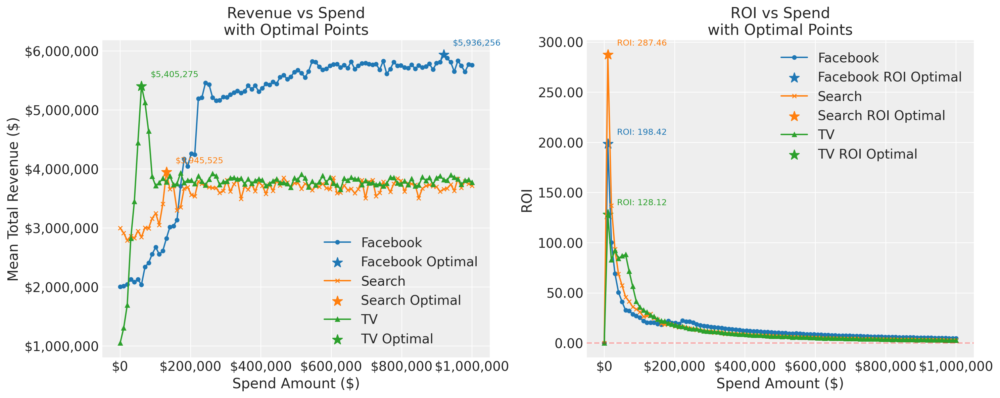

📊 Summary of ROI-optimal vs Revenue-maximizing spend:


,Channel,ROI Optimal Spend,Max ROI,Revenue at ROI Optimal,Revenue Optimal Spend,Max Revenue,ROI at Revenue Optimal
1,Search,"$10,101.01",$287.46,"$2,913,733.09","$131,313.13","$3,945,525.50",$29.05
0,Facebook,"$10,101.01",$198.42,"$2,014,345.49","$919,191.92","$5,936,256.10",$5.46
2,TV,"$10,101.01",$128.12,"$1,304,278.67","$60,606.06","$5,405,275.42",$88.19


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from dowhy import gcm

# ------------------------- Analyze Function -------------------------

def analyze_with_sequential_interventions(causal_model, channels):
    spend_values = create_spend_grid()  # Use the improved grid from before
    results = {channel: [] for channel in channels}

    for channel in channels:
        for spend in spend_values:
            # Create a conditional intervention
            intervention_sequence = []

            # First set all channel spends to 0
            for ch in channels:
                intervention_sequence.append({
                    'intervention_type': 'direct',
                    'target_variables': [f'spend_{ch}'],
                    'value': 0
                })

            # Then set target channel spend
            intervention_sequence.append({
                'intervention_type': 'direct',
                'target_variables': [f'spend_{channel}'],
                'value': spend
            })

            # Execute the sequential intervention
            samples = gcm.interventional_samples(
                causal_model,
                intervention_sequence,
                num_samples_to_draw=1000
            )

            # Process results as before
            mean_revenue = samples['total_revenue'].mean()
            roi = (mean_revenue - spend) / spend if spend > 0 else 0
            results[channel].append({
                'spend': spend,
                'revenue': mean_revenue,
                'roi': roi
            })

    # Format results
    df_results = pd.DataFrame({'spend': spend_values})
    for channel in channels:
        df_results[f'{channel}_revenue'] = [r['revenue'] for r in results[channel]]
        df_results[f'{channel}_roi'] = [r['roi'] for r in results[channel]]

    return df_results
# ------------------------- Find Optimal Points -------------------------

def find_optimal_points(df_results, channels):
    optimal_points = {}
    for channel in channels:
        roi_idx = df_results[f'{channel}_roi'].idxmax()
        optimal_points[channel] = {
            'roi_spend': df_results.loc[roi_idx, 'spend'],
            'roi': df_results.loc[roi_idx, f'{channel}_roi'],
            'revenue_at_roi': df_results.loc[roi_idx, f'{channel}_revenue']
        }

        rev_idx = df_results[f'{channel}_revenue'].idxmax()
        optimal_points[channel].update({
            'rev_spend': df_results.loc[rev_idx, 'spend'],
            'revenue': df_results.loc[rev_idx, f'{channel}_revenue'],
            'roi_at_rev': df_results.loc[rev_idx, f'{channel}_roi']
        })

    return optimal_points

# ------------------------- Plot Function -------------------------

def plot_marketing_analysis(df_results, channels, optimal_points):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    markers = ['o', 'x', '^']
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

    for i, channel in enumerate(channels):
        color = colors[i % len(colors)]

        # Revenue plot
        ax1.plot(df_results['spend'], df_results[f'{channel}_revenue'],
                 label=channel, color=color, marker=markers[i], markersize=4)
        ax1.scatter(optimal_points[channel]['rev_spend'], optimal_points[channel]['revenue'],
                    color=color, marker='*', s=120, label=f"{channel} Optimal")
        ax1.annotate(f"${optimal_points[channel]['revenue']:,.0f}",
                     (optimal_points[channel]['rev_spend'], optimal_points[channel]['revenue']),
                     textcoords="offset points", xytext=(10, 10), fontsize=9, color=color)

        # ROI plot
        ax2.plot(df_results['spend'], df_results[f'{channel}_roi'],
                 label=channel, color=color, marker=markers[i], markersize=4)
        ax2.scatter(optimal_points[channel]['roi_spend'], optimal_points[channel]['roi'],
                    color=color, marker='*', s=120, label=f"{channel} ROI Optimal")
        ax2.annotate(f"ROI: {optimal_points[channel]['roi']:.2f}",
                     (optimal_points[channel]['roi_spend'], optimal_points[channel]['roi']),
                     textcoords="offset points", xytext=(10, 10), fontsize=9, color=color)

    # Format axes
    ax1.set_title("Revenue vs Spend\nwith Optimal Points")
    ax1.set_xlabel("Spend Amount ($)")
    ax1.set_ylabel("Mean Total Revenue ($)")
    ax1.grid(True)
    ax1.legend()
    ax1.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"${x:,.0f}"))
    ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f"${y:,.0f}"))

    ax2.set_title("ROI vs Spend\nwith Optimal Points")
    ax2.set_xlabel("Spend Amount ($)")
    ax2.set_ylabel("ROI")
    ax2.grid(True)
    ax2.legend()
    ax2.axhline(y=0, color='red', linestyle='--', alpha=0.3)
    ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"${x:,.0f}"))
    ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f"{y:.2f}"))

    plt.tight_layout()
    plt.show()

# ------------------------- Summary Table -------------------------

def summarize_optimal_points(optimal_points):
    summary = pd.DataFrame({
        'Channel': optimal_points.keys(),
        'ROI Optimal Spend': [v['roi_spend'] for v in optimal_points.values()],
        'Max ROI': [v['roi'] for v in optimal_points.values()],
        'Revenue at ROI Optimal': [v['revenue_at_roi'] for v in optimal_points.values()],
        'Revenue Optimal Spend': [v['rev_spend'] for v in optimal_points.values()],
        'Max Revenue': [v['revenue'] for v in optimal_points.values()],
        'ROI at Revenue Optimal': [v['roi_at_rev'] for v in optimal_points.values()],
    })
    print("📊 Summary of ROI-optimal vs Revenue-maximizing spend:")
    return summary

# ------------------------- Run Everything -------------------------

channels = ['Facebook', 'Search', 'TV']

results = analyze_marketing_channels(
    causal_model,
    channels=channels,
    spend_range=(0, 1_000_000),
    num_points=100,  # Higher resolution
    samples_per_point=1000
)

optimal_points = find_optimal_points(results, channels)

plot_marketing_analysis(results, channels, optimal_points)

summary_df = summarize_optimal_points(optimal_points)
display(summary_df.sort_values("Max ROI", ascending=False))

In [ ]:
import numpy as np
from dowhy.gcm import interventional_samples

def const(val):
    return lambda _x, _val=val: _val

def marginal_slopes_gcm(causal_model, data, channels, delta=1_000, n_boot=500):
    rng    = np.random.default_rng(42)
    means  = {ch: data[f"spend_{ch}"].mean() for ch in channels}
    fixed  = {f"spend_{ch}": const(means[ch]) for ch in channels}
    results = {}

    for ch in channels:
        node   = f"spend_{ch}"
        slopes = []
        for _ in range(n_boot):
            # 1) Bootstrap sample rows
            dfb = data.sample(frac=1, replace=True,
                              random_state=rng.integers(1e9))
            obs = dfb[node].mean()

            # 2) Build interventions
            ref_int = {**fixed, node: const(obs)}
            alt_int = {**fixed, node: const(obs + delta)}

            # 3) Paired draws via seeding
            seed = rng.integers(1e9)
            np.random.seed(seed)
            ref_world = interventional_samples(
                causal_model,
                interventions=ref_int,
                observed_data=dfb          # use observed_data, not num_samples_to_draw
            )

            np.random.seed(seed)
            alt_world = interventional_samples(
                causal_model,
                interventions=alt_int,
                observed_data=dfb
            )

            # 4) Compute local slope
            ace = alt_world["total_revenue"].mean() - ref_world["total_revenue"].mean()
            slopes.append(ace / delta)

        arr = np.array(slopes)
        results[ch] = (arr.mean(), np.percentile(arr, 2.5), np.percentile(arr, 97.5))
    return results

# === Usage ===
channels = ["Facebook", "TV", "Search"]
marginal_results = marginal_slopes_gcm(causal_model, data, channels,
                                       delta=1_000, n_boot=1_000)
for ch, (slope, lo, hi) in marginal_results.items():
    print(f"{ch}: {slope:,.2f} €/€  [{lo:,.2f}, {hi:,.2f}]")

Facebook: -9.28 €/€  [-251.77, 38.41]
TV: -56.45 €/€  [-122.44, -17.70]
Search: 18.21 €/€  [-41.54, 35.35]


## Counterfactuals

What the Counterfactual Query is Doing

1. **Observed Data:**
- The observed data represents the current state or the actual values of the variables at a specific point in time. In this case, observed_data = data.tail(1) selects the most recent observation from the dataset.

2. **Intervention:**
- The intervention specifies the change you want to make to one or more variables. In this example, the intervention is {'spend_TV': lambda x: 15000}, which means you are setting the value of spend_TV to 15000.

3. **Generating Counterfactual Samples:**
- The gcm.counterfactual_samples function generates counterfactual samples by applying the specified intervention to the observed data. It uses the causal model to predict the values of other variables after the intervention.


In [ ]:
gcm.counterfactual_samples(
    causal_model,
    {'Facebook': lambda x: 300000},
    observed_data=pd.DataFrame(data=dict(X=[0], Y=[5], Z=[110])))

ValueError: Node Facebook can not be found in the given graph!

In [ ]:
help(gcm.counterfactual_samples)

Help on function counterfactual_samples in module dowhy.gcm.whatif:

counterfactual_samples(causal_model: Union[dowhy.gcm.causal_models.StructuralCausalModel, dowhy.gcm.causal_models.InvertibleStructuralCausalModel], interventions: Dict[Any, Callable[[numpy.ndarray], Union[float, numpy.ndarray]]], observed_data: Optional[pandas.core.frame.DataFrame] = None, noise_data: Optional[pandas.core.frame.DataFrame] = None) -> pandas.core.frame.DataFrame
    Estimates counterfactual data for observed data if we were to perform specified interventions. This function
    implements the 3-step process for computing counterfactuals by Pearl (see https://ftp.cs.ucla.edu/pub/stat_ser/r485.pdf).
    
    :param causal_model: The (invertible) structural causal model we perform this intervention on. If noise_data is
                         None and observed_data is provided, this must be an invertible structural model, otherwise,
                         this can be either a structural causal model or a

In [ ]:
from sklearn.model_selection import TimeSeriesSplit

 #Create an invertible structural causal model
causal_model = gcm.InvertibleStructuralCausalModel(causal_graph)

# Auto-assign causal mechanisms
auto_assignment_summary = gcm.auto.assign_causal_mechanisms(causal_model, data)
print(auto_assignment_summary)

# Fit the causal model using time series split for cross-validation
tscv = TimeSeriesSplit(n_splits=5)
for train_index, test_index in tscv.split(data):
    train_data = data.iloc[train_index]
    test_data = data.iloc[test_index]
    gcm.fit(causal_model, train_data)

# Define the observed data (most recent observation)
observed_data = data.tail(1)

# Make a counterfactual query: What if spend_TV was 15000 instead of its current value?
counterfactual_result = gcm.counterfactual_samples(
    causal_model,
    {'spend_TV': lambda x: 15000},
    observed_data=observed_data
)

# Print the counterfactual result
print(counterfactual_result)

When using this auto assignment function, the given data is used to automatically assign a causal mechanism to each node. Note that causal mechanisms can also be customized and assigned manually.
The following types of causal mechanisms are considered for the automatic selection:

If root node:
An empirical distribution, i.e., the distribution is represented by randomly sampling from the provided data. This provides a flexible and non-parametric way to model the marginal distribution and is valid for all types of data modalities.

If non-root node and the data is continuous:
Additive Noise Models (ANM) of the form X_i = f(PA_i) + N_i, where PA_i are the parents of X_i and the unobserved noise N_i is assumed to be independent of PA_i.To select the best model for f, different regression models are evaluated and the model with the smallest mean squared error is selected.Note that minimizing the mean squared error here is equivalent to selecting the best choice of an ANM.

If non-root node

Fitting causal mechanism of node total_revenue: 100%|██████████| 4/4 [00:00<00:00, 158.90it/s]

   spend_TV  spend_Facebook  spend_Search  total_revenue
0     15000   115679.234528  70682.740935   62217.673574


In [ ]:

# Define the observed data (most recent observation)
observed_data = data.tail(100)

# Generate counterfactual samples for a range of spend_TV values
spend_TV_values = np.linspace(0, 1000000, 100)  # Adjust the range and number of points as needed
predicted_revenue = []

for spend_TV in spend_TV_values:
    counterfactual_result = gcm.counterfactual_samples(
        causal_model,
        {'spend_TV': lambda x: spend_TV},
        observed_data=observed_data
    )
    predicted_revenue.append(counterfactual_result['total_revenue'].values[0])

# Plot the diminishing return curve
plt.figure(figsize=(10, 6))
plt.plot(spend_TV_values, predicted_revenue, label='Predicted Revenue')
plt.xlabel('Spend on TV')
plt.ylabel('Total Revenue')
plt.title('Diminishing Return Curve for Spend on TV')
plt.legend()
plt.grid(True)
plt.show()

ValueError: Since no noise_data is given, this has to be estimated from the given observed_data. This can only be done with InvertibleStructuralCausalModel.

In [ ]:
help(gcm.confidence_intervals)

Help on function confidence_intervals in module dowhy.gcm.confidence_intervals:

confidence_intervals(estimation_func: Union[Callable[[], numpy.ndarray], Callable[[], Dict[Any, float]]], confidence_level: float = 0.95, num_bootstrap_resamples: int = 20, bootstrap_results_summary_func: Callable[[numpy.ndarray], numpy.ndarray] = <function estimate_geometric_median at 0x787d033256c0>, n_jobs: int = 1) -> Tuple[Union[numpy.ndarray, Dict[Any, numpy.ndarray]], Union[numpy.ndarray, Dict[Any, numpy.ndarray]]]
    Estimates confidence intervals based on the outputs generated by calling the given estimation_func. Since one result
    for each repetition is produced, all results can be summarized by the method defined in
    summary_method_of_bootstrap_results.
    For instance, summary_method_of_bootstrap_results = lambda x: numpy.mean(x, axis=0) to get the mean over all runs.
    By default, the geometric median is returned.
    
    Currently, the confidence intervals are empirically estimated

<ipython-input-47-bf1eb6a6da5c>:39: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


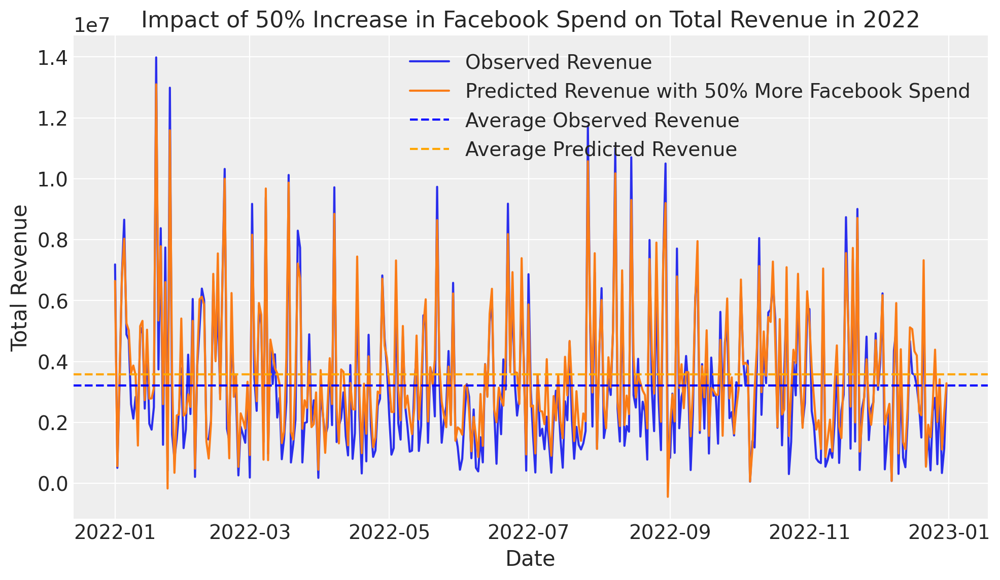

In [ ]:
# Create an invertible structural causal model
causal_model = gcm.InvertibleStructuralCausalModel(causal_graph)

# Ensure the data is sorted by time
data['DATE'] = pd.to_datetime(data['DATE'])
data = data.sort_values(by='DATE')

# Filter the data for the year 2022
data_2022 = data[data['DATE'].dt.year == 2022]

# Define the observed data for 2022
observed_data = data_2022

# Generate counterfactual samples by increasing spend_Facebook by 50%
counterfactual_result = gcm.counterfactual_samples(
    causal_model,
    {'spend_Facebook': lambda x: x * 1.5},
    observed_data=observed_data
)

# Extract the predicted total revenue from counterfactuals
predicted_revenue = counterfactual_result['total_revenue'].values

# Calculate the average observed and predicted revenue
average_observed_revenue = data_2022['total_revenue'].mean()
average_predicted_revenue = np.mean(predicted_revenue)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(data_2022['DATE'], data_2022['total_revenue'], label='Observed Revenue')
plt.plot(data_2022['DATE'], predicted_revenue, label='Predicted Revenue with 50% More Facebook Spend')
plt.axhline(y=average_observed_revenue, color='blue', linestyle='--', label='Average Observed Revenue')
plt.axhline(y=average_predicted_revenue, color='orange', linestyle='--', label='Average Predicted Revenue')
plt.xlabel('Date')
plt.ylabel('Total Revenue')
plt.title('Impact of 50% Increase in Facebook Spend on Total Revenue in 2022')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:

# Print the results
print("Average Observed Revenue in 2022:", average_observed_revenue)
print("Average Predicted Revenue with 50% More Facebook Spend in 2022:", average_predicted_revenue)

Average Observed Revenue in 2022: 3214513.9695811337
Average Predicted Revenue with 50% More Facebook Spend in 2022: 3576117.88482086


## Altnerative approach


### Step 1 Explore the data

In [ ]:
def generate_new_old_dataframes(data, new_year, old_year):
    # Ensure the 'Date' column is in datetime format
    data['DATE'] = pd.to_datetime(data['DATE'])

    # Filter new data based on new_year
    new_conditions = (data['DATE'].dt.year == new_year)
    df_new = data[new_conditions].copy()

    # Filter old data based on old_year
    old_conditions = (data['DATE'].dt.year == old_year)
    df_old = data[old_conditions].copy()

    return df_new, df_old

In [ ]:
def plot_metric_distributions(df_new, df_old, metric_columns):
    for metric_column in metric_columns:
        fig, ax = plt.subplots()

        kde_new = stats.gaussian_kde(df_new[metric_column].dropna())
        kde_old = stats.gaussian_kde(df_old[metric_column].dropna())

        x_range = np.linspace(
            min(df_new[metric_column].min(), df_old[metric_column].min()),
            max(df_new[metric_column].max(), df_old[metric_column].max()),
            1000
        )
        ax.plot(x_range, kde_new(x_range), color='#FF6B6B', lw=2, label='After')
        ax.plot(x_range, kde_old(x_range), color='#4ECDC4', lw=2, label='Before')

        ax.fill_between(x_range, kde_new(x_range), alpha=0.3, color='#FF6B6B')
        ax.fill_between(x_range, kde_old(x_range), alpha=0.3, color='#4ECDC4')

        ax.set_xlabel(metric_column)
        ax.set_ylabel('Density')
        ax.set_title(f'Comparison of {metric_column} distribution')

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        ax.grid(True, linestyle='--', alpha=0.7)
        ax.legend(fontsize=10)

        plt.tight_layout()
        plt.show()

In [ ]:
df_new, df_old = generate_new_old_dataframes(data, new_year=2022, old_year=2023)


The figure layout has changed to tight


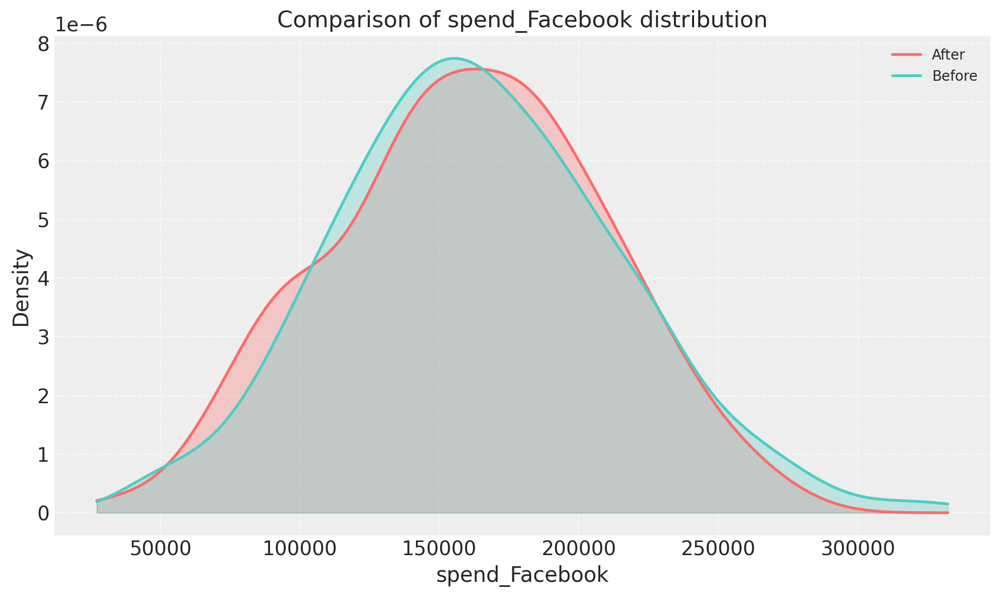

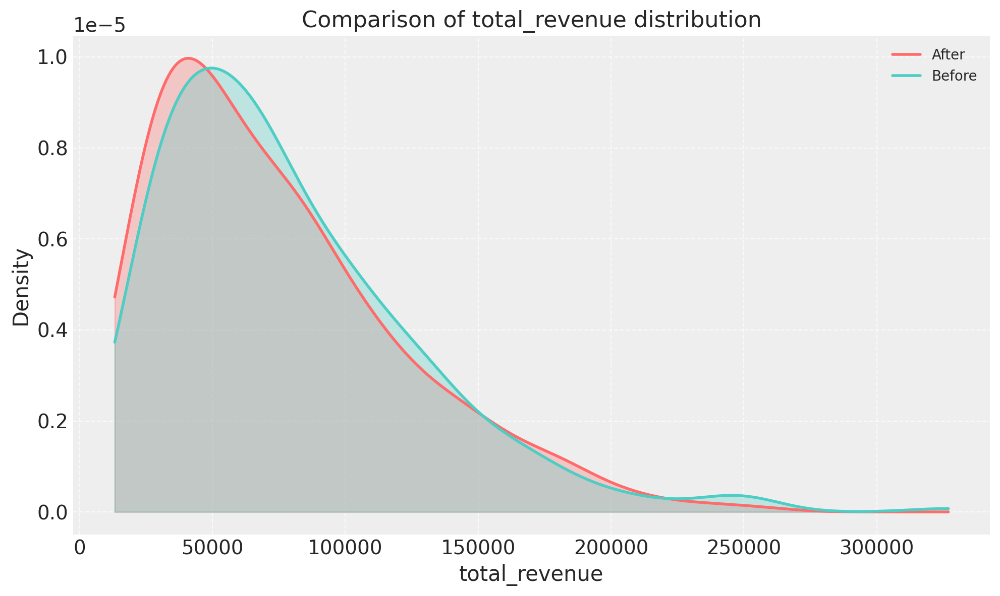

In [ ]:
# Define KPI
metric_columns = ['spend_Facebook', 'total_revenue']
plot_metric_distributions(df_new, df_old, metric_columns)

In [ ]:
def compare_metrics(df_new, df_old, metrics):
    comparison_data = []

    for metric in metrics:
        try:
            mean_old = df_old[metric].mean()
            median_old = df_old[metric].median()
            variance_old = df_old[metric].var()

            mean_new = df_new[metric].mean()
            median_new = df_new[metric].median()
            variance_new = df_new[metric].var()

            if mean_old == 0:
                print(f"Mean for {metric} in the old data is zero. Skipping mean change calculation.")
                mean_change = None
            else:
                mean_change = ((mean_new - mean_old) / mean_old) * 100

            if median_old == 0:
                print(f"Median for {metric} in the old data is zero. Skipping median change calculation.")
                median_change = None
            else:
                median_change = ((median_new - median_old) / median_old) * 100

            if variance_old == 0:
                print(f"Variance for {metric} in the old data is zero. Skipping variance change calculation.")
                variance_change = None
            else:
                variance_change = ((variance_new - variance_old) / variance_old) * 100

            comparison_data.append({
                'Metric': metric,
                'Δ mean': mean_change,
                'Δ median': median_change,
                'Δ variance': variance_change
            })
        except KeyError as e:
            print(f"Metric {metric} not found in one of the DataFrames: {e}")
            pass

    comparison_df = pd.DataFrame(comparison_data)
    return comparison_df

In [ ]:
comparison_df = compare_metrics(df_new, df_old, ['total_revenue', 'spend_TV', 'spend_Facebook', 'spend_Search'])
print(comparison_df)

           Metric    Δ mean  Δ median  Δ variance
0   total_revenue -5.244647 -5.700612   -7.509685
1        spend_TV -2.825611 -1.718502    7.257274
2  spend_Facebook -2.380766 -1.094867   -7.511090
3    spend_Search -3.347468 -0.180869   -4.595873


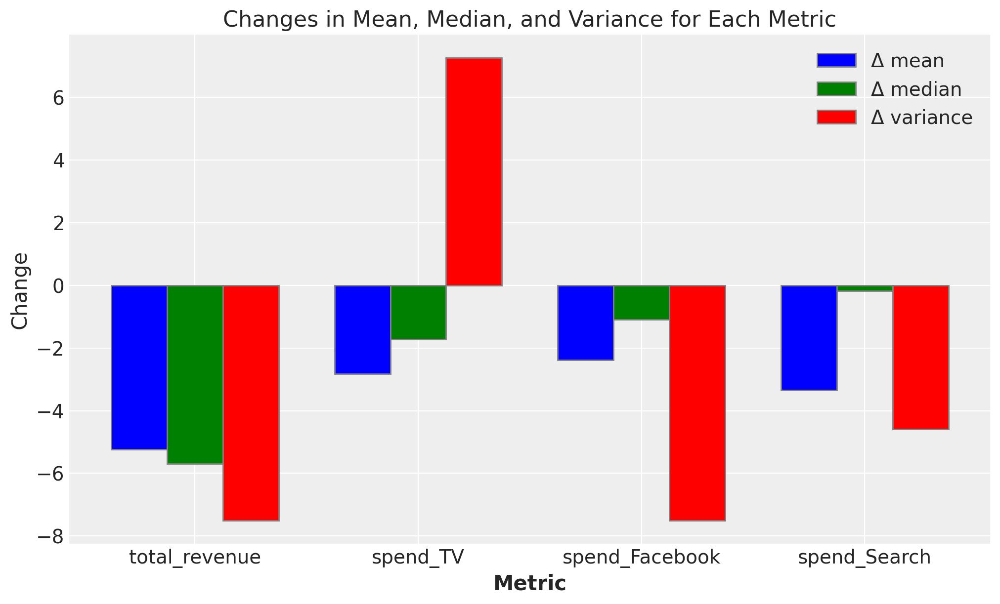

In [ ]:
# Data
data = {
    'Metric': ['total_revenue', 'spend_TV', 'spend_Facebook', 'spend_Search'],
    'Δ mean': [-5.244647, -2.825611, -2.380766, -3.347468],
    'Δ median': [-5.700612, -1.718502, -1.094867, -0.180869],
    'Δ variance': [-7.509685, 7.257274, -7.511090, -4.59587]
}

# Create DataFrame
df = pd.DataFrame(data)

# Plotting
fig, ax = plt.subplots(figsize=(10, 6))

# Bar width
bar_width = 0.25

# Positions of the bars on the x-axis
r1 = range(len(df))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]

# Create bars
plt.bar(r1, df['Δ mean'], color='b', width=bar_width, edgecolor='grey', label='Δ mean')
plt.bar(r2, df['Δ median'], color='g', width=bar_width, edgecolor='grey', label='Δ median')
plt.bar(r3, df['Δ variance'], color='r', width=bar_width, edgecolor='grey', label='Δ variance')

# Add xticks on the middle of the group bars
plt.xlabel('Metric', fontweight='bold')
plt.xticks([r + bar_width for r in range(len(df))], df['Metric'])

# Add labels and title
plt.ylabel('Change')
plt.title('Changes in Mean, Median, and Variance for Each Metric')

# Add legend
plt.legend()

# Show the plot
plt.show()

### 2. Draw causal graph and 3. Fit causal graph

Edges in the graph:
[('spend_TV', 'spend_Facebook'), ('spend_TV', 'spend_Search'), ('spend_TV', 'total_revenue'), ('spend_Facebook', 'spend_Search'), ('spend_Facebook', 'total_revenue'), ('spend_Search', 'total_revenue')]


There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword


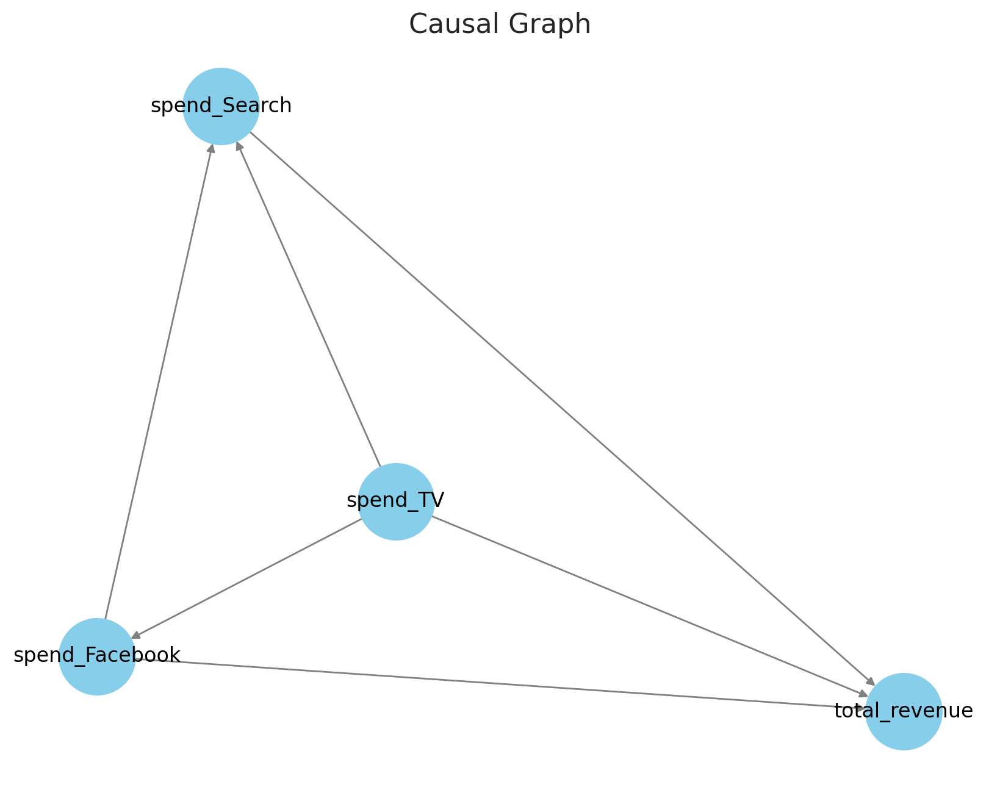

When using this auto assignment function, the given data is used to automatically assign a causal mechanism to each node. Note that causal mechanisms can also be customized and assigned manually.
The following types of causal mechanisms are considered for the automatic selection:

If root node:
An empirical distribution, i.e., the distribution is represented by randomly sampling from the provided data. This provides a flexible and non-parametric way to model the marginal distribution and is valid for all types of data modalities.

If non-root node and the data is continuous:
Additive Noise Models (ANM) of the form X_i = f(PA_i) + N_i, where PA_i are the parents of X_i and the unobserved noise N_i is assumed to be independent of PA_i.To select the best model for f, different regression models are evaluated and the model with the smallest mean squared error is selected.Note that minimizing the mean squared error here is equivalent to selecting the best choice of an ANM.

If non-root node

Fitting causal mechanism of node total_revenue: 100%|██████████| 4/4 [00:00<00:00, 66.54it/s]

When using this auto assignment function, the given data is used to automatically assign a causal mechanism to each node. Note that causal mechanisms can also be customized and assigned manually.
The following types of causal mechanisms are considered for the automatic selection:

If root node:
An empirical distribution, i.e., the distribution is represented by randomly sampling from the provided data. This provides a flexible and non-parametric way to model the marginal distribution and is valid for all types of data modalities.

If non-root node and the data is continuous:
Additive Noise Models (ANM) of the form X_i = f(PA_i) + N_i, where PA_i are the parents of X_i and the unobserved noise N_i is assumed to be independent of PA_i.To select the best model for f, different regression models are evaluated and the model with the smallest mean squared error is selected.Note that minimizing the mean squared error here is equivalent to selecting the best choice of an ANM.

If non-root node

In [ ]:
import pydot
import networkx as nx

# Define the DOT string for the causal graph
dot_graph = """
digraph {
    spend_TV -> spend_Facebook;
    spend_TV -> spend_Search;
    spend_Facebook -> spend_Search;
    spend_Facebook -> total_revenue;
    spend_Search -> total_revenue;
    spend_TV -> total_revenue;
}
"""

# Parse the DOT graph using pydot
pydot_graph = pydot.graph_from_dot_data(dot_graph)[0]

# Convert the pydot graph to a NetworkX graph
nx_graph = nx.DiGraph(nx.nx_pydot.from_pydot(pydot_graph))

from dowhy import gcm
causal_model = gcm.StructuralCausalModel(nx_graph)


# Print the edges to confirm
print("Edges in the graph:")
print(nx_graph.edges())

# Optional: visualize the graph (requires matplotlib)
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
pos = nx.spring_layout(nx_graph)
nx.draw(nx_graph, pos, with_labels=True, node_color="skyblue", node_size=2000, edge_color="gray", font_size=12)
plt.title("Causal Graph")
plt.show()

#auto_assignment_summary = gcm.auto.assign_causal_mechanisms(causal_model, data)
print(gcm.auto.assign_causal_mechanisms(causal_model, data, quality=gcm.auto.AssignmentQuality.BETTER))

gcm.fit(causal_model, data)

print(auto_assignment_summary)

### 4. Identify causal drivers for KPI changes

In [ ]:
def calculate_difference_estimation(causal_model, df_old, df_new, target_column, difference_estimation_func, num_samples=2000, confidence_level=0.90, num_bootstrap_resamples=4):

    difference_contribs, uncertainty_contribs = gcm.confidence_intervals(
        lambda : gcm.distribution_change(causal_model,
                                          df_old,
                                          df_new,
                                          target_column,
                                          num_samples=num_samples,
                                          difference_estimation_func=difference_estimation_func,
                                          shapley_config=gcm.shapley.ShapleyConfig(approximation_method=gcm.shapley.ShapleyApproximationMethods.PERMUTATION, num_permutations=50)),
        confidence_level=confidence_level,
        num_bootstrap_resamples=num_bootstrap_resamples
    )

    return difference_contribs, uncertainty_contribs

median_diff_contribs, median_diff_uncertainty = calculate_difference_estimation(causal_model, df_old, df_new, 'total_revenue', lambda x1, x2: np.mean(x2) - np.mean(x1))

Estimating bootstrap interval...: 100%|██████████| 4/4 [00:16<00:00,  4.17s/it]


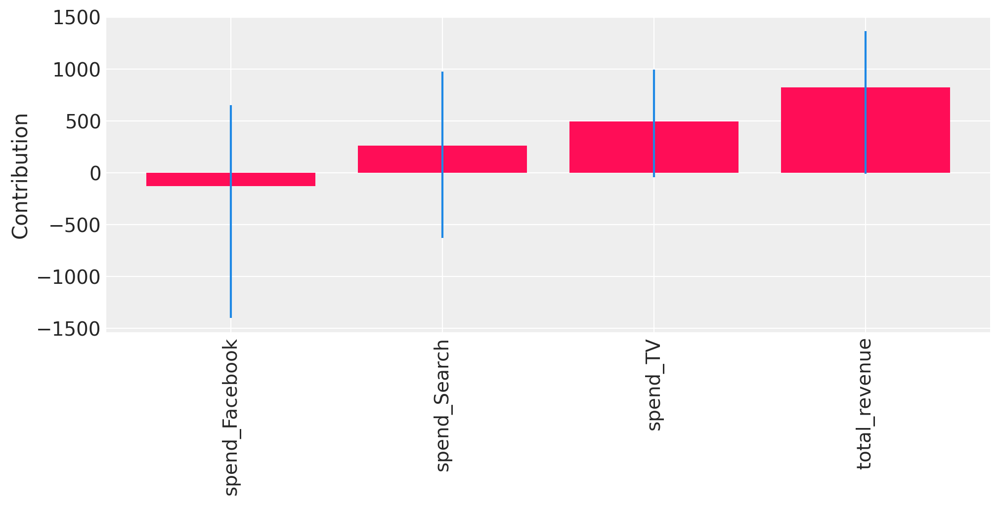

In [ ]:
gcm.util.bar_plot(median_diff_contribs, median_diff_uncertainty, 'Contribution', figure_size=(10,5))


In [ ]:
def show_tabular(median_contribs, uncertainty_contribs):
    rows = []
    for node, median_contrib in median_contribs.items():
        rows.append(dict(node=node, median=median_contrib, lb=uncertainty_contribs[node][0], ub=uncertainty_contribs[node][1]))
    df = pd.DataFrame(rows).set_index('node')
    df.rename(columns=dict(median='median', lb='lb', ub='ub'), inplace=True)
    return df

# show_tabular(median_contribs, uncertainty_contribs)
result_df = pd.DataFrame(show_tabular(median_diff_contribs, median_diff_uncertainty))
result_df

,median,lb,ub
node,,,
spend_Facebook,-132.446116,-1401.397007,651.484807
spend_Search,262.037433,-629.197761,975.707438
spend_TV,491.770608,-46.689540,993.620491
total_revenue,820.238336,-10.092107,1365.468247


In [ ]:
def filter_significant_rows(result_df, direction, ub_col, lb_col):

    if direction == 'positive':
        significant_rows = result_df[(result_df[ub_col] > 0) & (result_df[lb_col] > 0)]
    elif direction == 'negative':
        significant_rows = result_df[(result_df[ub_col] < 0) & (result_df[lb_col] < 0)]
    else:
        raise ValueError("Invalid direction. Choose 'positive' or 'negative'.")

    return significant_rows

In [ ]:
positive_significant_rows = filter_significant_rows(result_df, 'positive', 'ub', 'lb')
positive_significant_rows

,median,lb,ub
node,,,


### 5. Optimal intervention

In [ ]:
def intervention_influence(causal_model, target, step_size=1, non_interveneable_nodes=None, confidence_level=0.95, prints=False, threshold_insignificant=0.0001):
    progress_bar_was_on = gcm.config.show_progress_bars

    if progress_bar_was_on:
        gcm.config.disable_progress_bars()

    causal_effects = {}
    causal_effects_confidence_interval = {}
    capped_effects = []

    if non_interveneable_nodes is None:
        non_interveneable_nodes = []

    for node in causal_model.graph.nodes:
        if node in non_interveneable_nodes:
            continue

        # Define interventions
        def intervention(x):
            return x + step_size

        def non_intervention(x):
            return x

        interventions_alternative = {node: intervention}
        interventions_reference = {node: non_intervention}

        effect = gcm.confidence_intervals(
            partial(gcm.average_causal_effect,
                    causal_model=causal_model,
                    target_node=target,
                    interventions_alternative=interventions_alternative,
                    interventions_reference=interventions_reference,
                    num_samples_to_draw=10000),
            n_jobs=-1,
            num_bootstrap_resamples=40,
            confidence_level=confidence_level)

        causal_effects[node] = effect[0][0]
        causal_effects_confidence_interval[node] = effect[1].squeeze()

        # Apply non-negativity constraint - Here, spend cannot be negative. However, small negative values can happen in the analysis due to misspecifications.
        if  node.endswith('_spend') and causal_effects[node] < 0:
            causal_effects[node] = 0
            causal_effects_confidence_interval[node] = [np.nan, np.nan]

    if progress_bar_was_on:
        gcm.config.enable_progress_bars()

    print(causal_effects)
    if prints:
        for node in sorted(causal_effects, key=causal_effects.get, reverse=True):
            if abs(causal_effects[node]) < threshold_insignificant:
                print(f"{'Increasing' if step_size > 0 else 'Decreasing'} {node} by {step_size} has no significant effect on {target}.")
            else:
                print(f"{'Increasing' if step_size > 0 else 'Decreasing'} {node} by {step_size} {'increases' if causal_effects[node] > 0 else 'decreases'} {target} "
                        f"by around {causal_effects[node]} with a confidence interval ({confidence_level * 100}%) of {causal_effects_confidence_interval[node]}.")

    all_variables = list(causal_effects.keys())
    all_causal_effects = [causal_effects[key] for key in all_variables]
    all_lower_bounds = [causal_effects_confidence_interval[key][0] for key in all_variables]
    all_upper_bounds = [causal_effects_confidence_interval[key][1] for key in all_variables]
    result_df = pd.DataFrame({'Variable': all_variables,
                              'Causal Effect': all_causal_effects,
                              'Lower CI': all_lower_bounds,
                              'Upper CI': all_upper_bounds},
                             index = all_variables)

    return result_df

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
from functools import partial
from dowhy import gcm
from dowhy.utils.plotting import plot

from scipy import stats
from statsmodels.stats.multitest import multipletests

ValueError: numpy.dtype size changed, may indicate binary incompatibility. Expected 96 from C header, got 88 from PyObject

In [ ]:
interv_result = intervention_influence(causal_model=causal_model, target='total_revenue', non_interveneable_nodes=['total_revenue'], prints=True)
interv_result

{'spend_TV': -77.93915158152026, 'spend_Facebook': -153.7137405876794, 'spend_Search': 39.84250103628692}
Increasing spend_Search by 1 increases total_revenue by around 39.84250103628692 with a confidence interval (95.0%) of [-1042.65262132   538.86821394].
Increasing spend_TV by 1 decreases total_revenue by around -77.93915158152026 with a confidence interval (95.0%) of [-1297.7938904    833.63027837].
Increasing spend_Facebook by 1 decreases total_revenue by around -153.7137405876794 with a confidence interval (95.0%) of [-1090.55582186   769.1176085 ].


,Variable,Causal Effect,Lower CI,Upper CI
spend_TV,spend_TV,-77.939152,-1297.793890,833.630278
spend_Facebook,spend_Facebook,-153.713741,-1090.555822,769.117609
spend_Search,spend_Search,39.842501,-1042.652621,538.868214


In [ ]:
filter_significant_rows(interv_result, 'positive', 'Upper CI', 'Lower CI')


,Variable,Causal Effect,Lower CI,Upper CI


In [ ]:
samples = gcm.interventional_samples(causal_model,
                                     {'Facebook': lambda y: 300000 },
                                     num_samples_to_draw=1000)
samples.head()

# DoWhy And EconML


Correlation Matrix:

                spend_Facebook  spend_TV  spend_Search  total_revenue
spend_Facebook        1.000000  0.913834      0.892985       0.494423
spend_TV              0.913834  1.000000      0.842571       0.438964
spend_Search          0.892985  0.842571      1.000000       0.435996
total_revenue         0.494423  0.438964      0.435996       1.000000


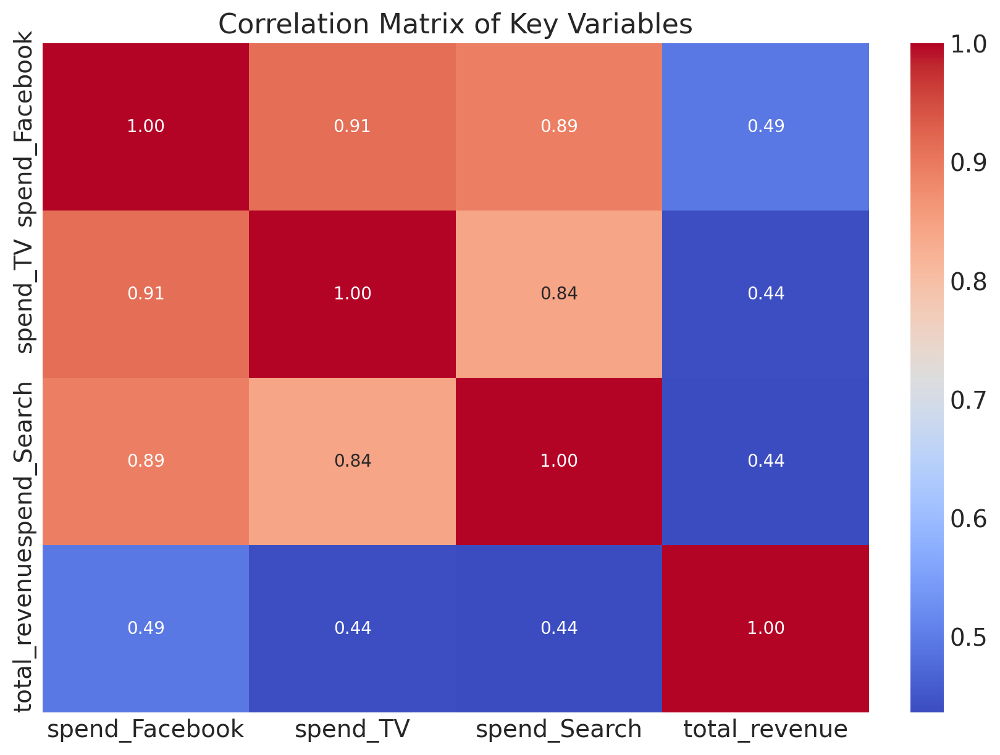


Correlation of Channels with Total Revenue:
spend_Facebook    0.494
spend_TV          0.439
spend_Search      0.436
Name: total_revenue, dtype: float64


In [ ]:
# ----- Correlation Summary -----

# Calculate correlation matrix
correlation_matrix = data.corr()

# Print the correlation matrix
print("\nCorrelation Matrix:\n")
print(correlation_matrix)

# Optional: Visualize the correlation matrix
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Key Variables')
plt.show()

correlation_with_revenue = correlation_matrix['total_revenue'].drop('total_revenue')

# Display correlation summary
print("\nCorrelation of Channels with Total Revenue:")
print(correlation_with_revenue.sort_values(ascending=False).round(3))

<ipython-input-9-fea0d28d4250>:27: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


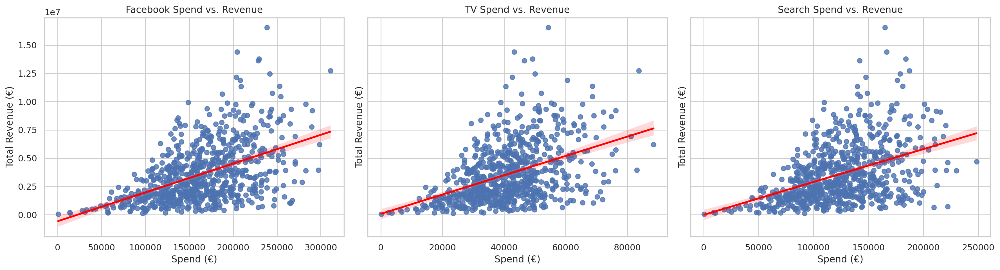

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set plot style
sns.set(style="whitegrid", context="notebook")

# Create a figure with subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

# Facebook Spend vs. Revenue
sns.regplot(data=data, x='spend_Facebook', y='total_revenue', ax=axes[0], ci=95, line_kws={'color': 'red'})
axes[0].set_title('Facebook Spend vs. Revenue')

# TV Spend vs. Revenue
sns.regplot(data=data, x='spend_TV', y='total_revenue', ax=axes[1], ci=95, line_kws={'color': 'red'})
axes[1].set_title('TV Spend vs. Revenue')

# Search Spend vs. Revenue
sns.regplot(data=data, x='spend_Search', y='total_revenue', ax=axes[2], ci=95, line_kws={'color': 'red'})
axes[2].set_title('Search Spend vs. Revenue')

# Common axis labels
for ax in axes:
    ax.set_xlabel("Spend (€)")
    ax.set_ylabel("Total Revenue (€)")

plt.tight_layout()
plt.show()

In [ ]:
# Select relevant variables
vars_of_interest = ['spend_Facebook', 'spend_TV', 'spend_Search', 'total_revenue']

# Get descriptive statistics
desc_stats = data[vars_of_interest].describe(percentiles=[.25, .5, .75]).T

# Add sample size as a column
desc_stats['N'] = data[vars_of_interest].count()

# Rename for academic clarity
desc_stats = desc_stats.rename(columns={
    'mean': 'Mean',
    'std': 'Std. Dev.',
    'min': 'Min',
    '25%': '25th %ile',
    '50%': 'Median',
    '75%': '75th %ile',
    'max': 'Max'
})

# Reorder and round
desc_stats = desc_stats[['N', 'Mean', 'Std. Dev.', 'Min', '25th %ile', 'Median', '75th %ile', 'Max']].round(2)

# Display as academic-style table
import pandas as pd
import IPython.display as display
display.display(desc_stats)

,N,Mean,Std. Dev.,Min,25th %ile,Median,75th %ile,Max
spend_Facebook,730,163433.50,50083.31,492.28,129221.30,161443.83,198044.31,311090.54
spend_TV,730,41133.88,13264.99,112.94,32287.69,41055.79,49203.05,88516.46
spend_Search,730,123808.72,38721.15,385.28,96302.44,122880.08,150513.26,248429.72
total_revenue,730,3593418.09,2577703.85,55399.14,1637360.13,3011756.86,4992039.60,16547884.06


In [ ]:
import pandas as pd

data = pd.read_csv('/content/masters_daily_level_dataset_rev50.csv')

In [ ]:
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Load your data (replace with your actual data)
data = pd.read_csv('/content/masters_daily_level_dataset_rev50.csv')

# Convert 'DATE' column to datetime objects
data['DATE'] = pd.to_datetime(data['DATE'])

# Drop the 'DATE' column as it is not needed for causal analysis
data = data.drop(columns=['DATE'])

# Focus only on the relevant variables
data = data[['spend_Facebook', 'spend_TV', 'spend_Search', 'total_revenue']]

# Check for NaN values and remove them
if data.isnull().values.any():
    data = data.dropna()

# Define the formula for the regression model
formula = 'total_revenue ~ spend_TV + spend_Facebook + spend_Search'

# Fit the regression model
model = smf.ols(formula=formula, data=data).fit()

# Print the summary of the regression model
print(model.summary())

# Extract the coefficient for spend_TV (causal effect estimate)
causal_effect = model.params['spend_TV']
print(f"Causal Effect of spend_TV on total_revenue: {causal_effect}")

                            OLS Regression Results                            
Dep. Variable:          total_revenue   R-squared:                       0.278
Model:                            OLS   Adj. R-squared:                  0.275
Method:                 Least Squares   F-statistic:                     93.13
Date:                Sun, 27 Jul 2025   Prob (F-statistic):           5.38e-51
Time:                        09:25:34   Log-Likelihood:                -11617.
No. Observations:                 730   AIC:                         2.324e+04
Df Residuals:                     726   BIC:                         2.326e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept      -6.329e+05   2.49e+05     -2.

## Facebook Model


In [ ]:
import statsmodels.api as sm
import pandas as pd

# Define the dependent variable (Outcome)
y = data['total_revenue']

# Define the independent variable (Treatment), add constant to the model
X = data[['spend_Facebook']]
X = sm.add_constant(X)  # Adds a constant term (intercept) to the model

# Fit the OLS model
ols_model = sm.OLS(y, X).fit()

# Print the regression results
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:          total_revenue   R-squared:                       0.277
Model:                            OLS   Adj. R-squared:                  0.276
Method:                 Least Squares   F-statistic:                     279.5
Date:                Sun, 27 Jul 2025   Prob (F-statistic):           2.40e-53
Time:                        09:22:34   Log-Likelihood:                -11618.
No. Observations:                 730   AIC:                         2.324e+04
Df Residuals:                     728   BIC:                         2.325e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -6.598e+05   2.45e+05     -2.

Step 1: Causal Graph

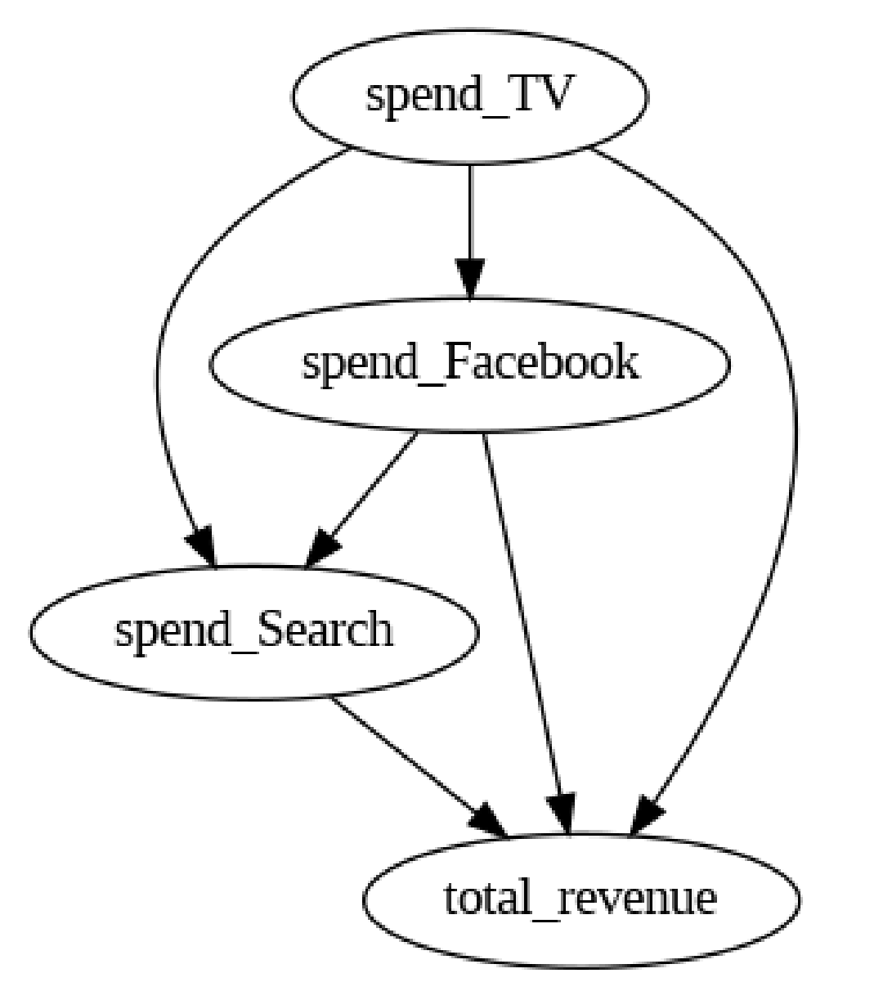

In [ ]:
from dowhy import CausalModel
from IPython.display import Image, display



# Define the DOT string for the causal graph
causal_graph = """
digraph {
    spend_TV ->  spend_Facebook
    spend_TV -> spend_Search;
    spend_Facebook -> spend_Search;
    spend_TV -> total_revenue;
    spend_Facebook -> total_revenue;
    spend_Search -> total_revenue;
}
"""

# Create the causal model
model = CausalModel(
    data=data,
    treatment='spend_Facebook',
    outcome='total_revenue',
    identify_vars = True,
    common_causes=['spend_TV', 'spend_Search'],
    graph=causal_graph)

model.view_model()





Step 2: Identification

In [ ]:
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True,  optimize_backdoor=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
        d                                                
─────────────────(E[total_revenue|spend_TV,spend_Search])
d[spend_Facebook]                                        
Estimand assumption 1, Unconfoundedness: If U→{spend_Facebook} and U→total_revenue then P(total_revenue|spend_Facebook,spend_TV,spend_Search,U) = P(total_revenue|spend_Facebook,spend_TV,spend_Search)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

### Estimand : 4
Estimand name: general_adjustment
Estimand expression:
        d                                   
─────────────────(E[total_revenue|spend_TV])
d[spend_Facebook]                           
Estimand assumption 1, Unconfoundedness: If U→{spend_Facebook} and U→total_revenue then P(total_revenue|spend_Facebook,spend_TV,U) = P(total_revenue|spend_Facebook,spend_TV)



Step 3: Estimation

In [ ]:
!pip install scikit-learn==1.2.2  # Install a compatible scikit-learn version


### LR

In [ ]:
#DoWhy

estimate = model.estimate_effect(identified_estimand,
        method_name="backdoor.linear_regression", confidence_intervals=True,test_significance=True)
print("Causal Estimate is " + str(estimate))
print(f"Estimate value: {estimate.value}, Type: {type(estimate.value)}")
print(f"Intercept value: {estimate.params['intercept']}, Type: {type(estimate.params['intercept'])}")

Causal Estimate is *** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
        d                                                
─────────────────(E[total_revenue|spend_TV,spend_Search])
d[spend_Facebook]                                        
Estimand assumption 1, Unconfoundedness: If U→{spend_Facebook} and U→total_revenue then P(total_revenue|spend_Facebook,spend_TV,spend_Search,U) = P(total_revenue|spend_Facebook,spend_TV,spend_Search)

## Realized estimand
b: total_revenue~spend_Facebook+spend_TV+spend_Search
Target units: ate

## Estimate
Mean value: 25.534294571261853
p-value: [4.39845137e-09]
95.0% confidence interval: [[17.09611537 33.97247377]]

Estimate value: 25.534294571261853, Type: <class 'numpy.float64'>
Intercept value: -632941.9034190226, Type: <class 'numpy.float64'>


/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]


### DoubleML

In [ ]:
import econml
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor


dml_estimate = model.estimate_effect(identified_estimand,
                                    method_name="backdoor.econml.dml.DML",
                                    method_params={
                                        'init_params': {'model_y':GradientBoostingRegressor(),
                                                        'model_t': GradientBoostingRegressor(),
                                                        'model_final':LassoCV(fit_intercept=False), },
                                        'fit_params': {}
                                     })
print(dml_estimate)

/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
        d                                                
─────────────────(E[total_revenue|spend_TV,spend_Search])
d[spend_Facebook]                                        
Estimand assumption 1, Unconfoundedness: If U→{spend_Facebook} and U→total_revenue then P(total_revenue|spend_Facebook,spend_TV,spend_Search,U) = P(total_revenue|spend_Facebook,spend_TV,spend_Search)

## Realized estimand
b: total_revenue~spend_Facebook+spend_TV+spend_Search | 
Target units: ate

## Estimate
Mean value: 24.158279824925625
Effect estimates: [[24.15827982]]



In [ ]:
# Main imports
from econml.metalearners import TLearner, SLearner, XLearner, DomainAdaptationLearner

# Helper imports
import numpy as np
from numpy.random import binomial, multivariate_normal, normal, uniform
from sklearn.ensemble import RandomForestClassifier, GradientBoostingRegressor
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

%matplotlib inline

### Causal Forest

Treatment Effects: [32.66291888 24.09587606 37.08598712 29.35481056 40.73821374  0.10519119
 12.40479233  5.21105983 38.35693851 20.29470386 27.16236648 54.67855827
 -7.26700415 30.45731285 28.20490474 50.27292094 36.27982623  2.70010478
 23.52280002 31.19226466 23.33497982 22.99568958 -7.46500917 23.29398577
 18.09564066 50.20710776 44.89995419 32.19950104 14.1487773  23.01541183
 23.54345594 34.60463225 25.68141614 36.0900367  36.51615451 34.98206896
 37.35521326 36.77388608 23.61864617 30.5647937  10.81709837  6.97209941
 14.88720684 37.73280486  2.35323989  9.08189829  2.74684429 -1.16673576
 16.16567167 38.65329578 22.18307304 48.78586604 14.8414504  -1.84489703
 13.68280799 31.29825743 29.56631564 24.14590322 37.67191865 37.36950742
 33.99130523  8.67695986  0.10519119 26.71963398  5.21105983 17.24798297
 42.29558655 43.50179967  6.6742079  33.34298354 24.81653198 47.19681788
 30.37825171 18.1335452  29.27776722 23.5472388  24.20678288 23.46859895
 25.0711397  24.79548999 39.2778

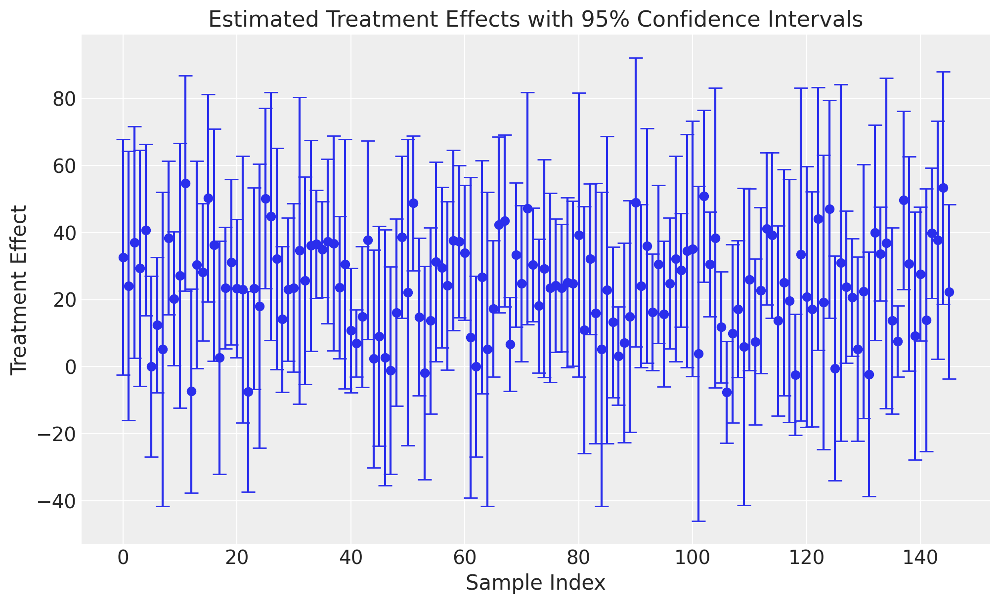

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from econml.dml import CausalForestDML

# Define the outcome, treatment, and covariates
Y = data['total_revenue'].values
T = data['spend_Facebook'].values
X = data[['spend_TV', 'spend_Search']].values

# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test, T_train, T_test = train_test_split(X, Y, T, test_size=0.2, random_state=42)

# Initialize CausalForestDML
cf_dml_estimator = CausalForestDML(
    model_y=RandomForestRegressor(),
    model_t=RandomForestRegressor(),
    discrete_treatment=False,
    random_state=42
)

# Fit the model
cf_dml_estimator.fit(Y_train, T_train, X=X_train)

# Estimate treatment effects
treatment_effects = cf_dml_estimator.effect(X_test)

# Estimate confidence intervals for treatment effects
lower_bounds, upper_bounds = cf_dml_estimator.effect_interval(X_test, alpha=0.05)

# Print the treatment effects and confidence intervals
print("Treatment Effects:", treatment_effects)
print("Lower Bounds:", lower_bounds)
print("Upper Bounds:", upper_bounds)

# Optionally, visualize the treatment effects with confidence intervals
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.errorbar(range(len(treatment_effects)), treatment_effects, yerr=[treatment_effects - lower_bounds, upper_bounds - treatment_effects], fmt='o', capsize=5)
plt.xlabel('Sample Index')
plt.ylabel('Treatment Effect')
plt.title('Estimated Treatment Effects with 95% Confidence Intervals')
plt.grid(True)
plt.show()

In [ ]:
np.mean(treatment_effects)

np.float64(24.041963849382938)

applying the treatment increases the expected outcome (Y) by 21,295.90 units.

In [ ]:
feature_importance = cf_dml_estimator.feature_importances_
feature_importance


array([0.4587954, 0.5412046])

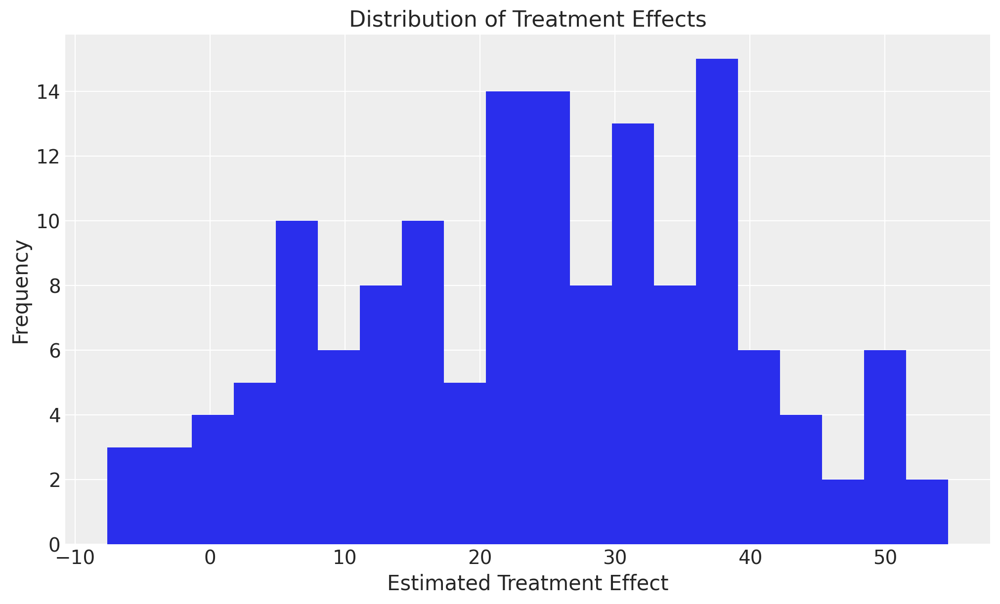

In [ ]:
import matplotlib.pyplot as plt

plt.hist(treatment_effects, bins=20)
plt.xlabel("Estimated Treatment Effect")
plt.ylabel("Frequency")
plt.title("Distribution of Treatment Effects")
plt.show()

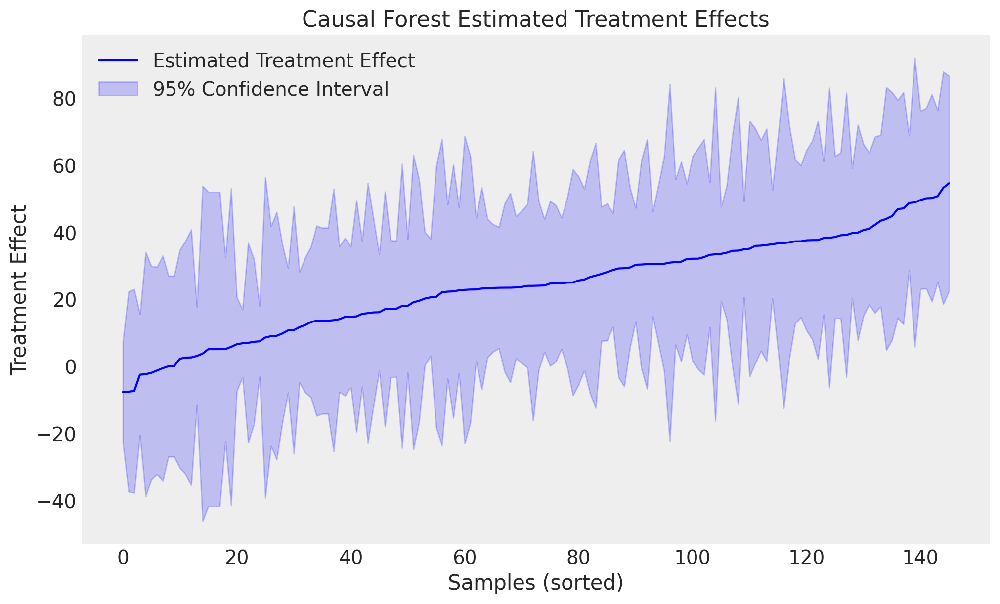

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Number of samples
n_samples = len(X_test)

# Sort values for a cleaner plot
sorted_indices = np.argsort(treatment_effects)
sorted_treatment_effects = treatment_effects[sorted_indices]
sorted_lower_bounds = lower_bounds[sorted_indices]
sorted_upper_bounds = upper_bounds[sorted_indices]

# Create plot
plt.figure(figsize=(10, 6))
plt.plot(range(n_samples), sorted_treatment_effects, label="Estimated Treatment Effect", color='blue')
plt.fill_between(range(n_samples), sorted_lower_bounds, sorted_upper_bounds, color='blue', alpha=0.2, label="95% Confidence Interval")

# Labels and legend
plt.xlabel("Samples (sorted)")
plt.ylabel("Treatment Effect")
plt.title("Causal Forest Estimated Treatment Effects")
plt.legend()
plt.grid()

# Show plot
plt.show()

Sorted Treatment Effects: [ 1.53985916  5.42450837  6.50452439  8.58453751  9.7958616  10.22544722
 10.54316591 10.69547105 11.2572632  13.13689294 14.46370348 14.57986311
 14.79195251 14.86501988 15.11647914 15.138563   15.51122923 16.18512625
 16.40530715 16.54187229 16.69819273 16.9145804  17.90763135 18.33205201
 18.48386824 19.28983616 19.89637657 20.31526702 20.45206948 20.65370859
 20.90799941 20.94234651 21.06838288 21.357468   21.47740196 22.12127433
 22.52896438 22.83975458 23.57893793 23.79464801 23.80599879 24.11600295
 24.31405612 24.36080975 24.48353115 24.56227701 24.58544259 24.61431178
 24.69157572 24.77669651 25.0338567  25.06404923 25.0917674  25.81716824
 25.84747537 25.84747537 26.03407398 27.10498155 27.50052969 27.52916824
 27.67000093 27.67655135 27.82800908 28.21080024 28.28153373 28.94374311
 29.08716399 29.19552578 29.46026366 29.50665354 29.73994238 30.61887433
 30.96691686 30.99405192 31.17690467 31.35790159 31.518327   31.57163366
 31.74984058 31.9070252  

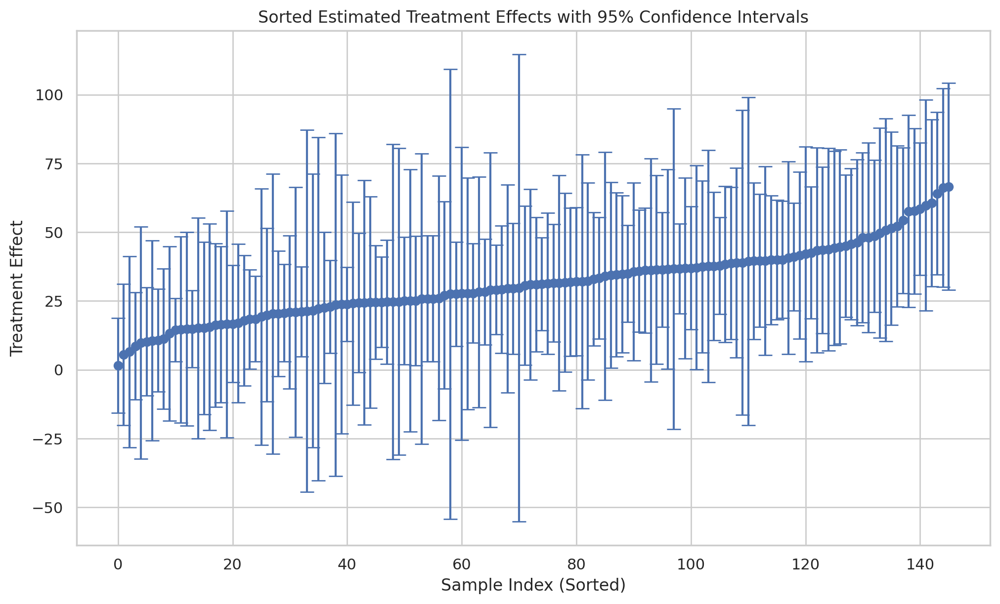

High Impact Samples (spend_TV, spend_Search): [[ 30764.39560719 122367.74749999]
 [ 31370.19007875 123635.63776958]
 [ 50577.62989233 151394.01995944]
 [ 38013.64221157 146150.22669788]
 [ 26831.19738507  95253.31957581]
 [ 25149.93079407  92504.79056655]
 [ 27035.41067073  92820.52106816]
 [ 25166.36209797  93459.69201614]
 [ 53576.73229209 203702.76756943]
 [ 38730.45688773 144415.09504091]
 [ 39567.10057989  95449.14709524]
 [ 43270.4530909  166552.29544686]
 [ 45125.05390644 163983.94346487]
 [ 49767.74775552 160073.13118451]
 [ 62511.89356823 180289.36544076]
 [ 54864.92696779 163410.73213596]
 [ 38173.69274047 118101.57608988]
 [ 38250.67084792  97975.15535548]
 [ 66173.28848913 176135.76323358]
 [ 47409.35675941 151717.37453291]
 [ 29161.96700773  99405.05492345]
 [ 29549.35796425  99223.35172431]
 [ 47640.18958894 162831.1361096 ]
 [ 51535.95495004 207548.57208168]
 [ 30368.44873623 102355.58111455]
 [ 30899.33278039 102360.0830941 ]
 [ 47398.05208601 141655.25865942]
 [ 27141.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from econml.dml import CausalForestDML
import matplotlib.pyplot as plt

# Define the outcome, treatment, and covariates
Y = data['total_revenue'].values
T = data['spend_Facebook'].values
X = data[['spend_TV', 'spend_Search']].values

# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test, T_train, T_test = train_test_split(X, Y, T, test_size=0.2, random_state=42)

# Initialize CausalForestDML
cf_dml_estimator = CausalForestDML(
    model_y=RandomForestRegressor(),
    model_t=RandomForestRegressor(),
    discrete_treatment=False,
    random_state=42
)

# Fit the model
cf_dml_estimator.fit(Y_train, T_train, X=X_train)

# Estimate treatment effects
treatment_effects = cf_dml_estimator.effect(X_test)

# Estimate confidence intervals for treatment effects
lower_bounds, upper_bounds = cf_dml_estimator.effect_interval(X_test, alpha=0.05)

# Sort the treatment effects and corresponding X_test rows
sorted_indices = np.argsort(treatment_effects)
sorted_treatment_effects = treatment_effects[sorted_indices]
sorted_lower_bounds = lower_bounds[sorted_indices]
sorted_upper_bounds = upper_bounds[sorted_indices]
sorted_X_test = X_test[sorted_indices]

# Print or analyze the sorted data
print("Sorted Treatment Effects:", sorted_treatment_effects)
print("Sorted X_test (spend_TV, spend_Search):", sorted_X_test)

# Visualize the sorted treatment effects with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(range(len(sorted_treatment_effects)), sorted_treatment_effects, yerr=[sorted_treatment_effects - sorted_lower_bounds, sorted_upper_bounds - sorted_treatment_effects], fmt='o', capsize=5)
plt.xlabel('Sample Index (Sorted)')
plt.ylabel('Treatment Effect')
plt.title('Sorted Estimated Treatment Effects with 95% Confidence Intervals')
plt.grid(True)
plt.show()

# Actionable Insights

# 1. Identify High-Impact Samples
high_impact_indices = np.where(sorted_treatment_effects > np.percentile(sorted_treatment_effects, 75))[0] # Top 25%
high_impact_samples = sorted_X_test[high_impact_indices]
print("High Impact Samples (spend_TV, spend_Search):", high_impact_samples)

# 2. Identify Low-Impact Samples
low_impact_indices = np.where(sorted_treatment_effects < np.percentile(sorted_treatment_effects, 25))[0] # Bottom 25%
low_impact_samples = sorted_X_test[low_impact_indices]
print("Low Impact Samples (spend_TV, spend_Search):", low_impact_samples)

# 3. Analyze the Characteristics of High and Low Impact Samples
#   - Compare the values of spend_TV and spend_Search between high and low impact groups.
#   - Are there specific ranges of spend_TV and spend_Search that are associated with high or low impact?
#   - Use domain knowledge to understand why these patterns might exist.

# 4. Use for Optimization
#   - If you find that certain ranges of spend_TV and spend_Search are associated with high impact, you can adjust your marketing budget accordingly.
#   - For example, if high spend on TV and low spend on Search leads to high impact of Facebook spend, you might want to allocate more budget to TV and less to Search.

High Impact Samples (spend_TV, spend_Search): [[ 30764.39560719 122367.74749999]
 [ 31370.19007875 123635.63776958]
 [ 50577.62989233 151394.01995944]
 [ 38013.64221157 146150.22669788]
 [ 26831.19738507  95253.31957581]
 [ 25149.93079407  92504.79056655]
 [ 27035.41067073  92820.52106816]
 [ 25166.36209797  93459.69201614]
 [ 53576.73229209 203702.76756943]
 [ 38730.45688773 144415.09504091]
 [ 39567.10057989  95449.14709524]
 [ 43270.4530909  166552.29544686]
 [ 45125.05390644 163983.94346487]
 [ 49767.74775552 160073.13118451]
 [ 62511.89356823 180289.36544076]
 [ 54864.92696779 163410.73213596]
 [ 38173.69274047 118101.57608988]
 [ 38250.67084792  97975.15535548]
 [ 66173.28848913 176135.76323358]
 [ 47409.35675941 151717.37453291]
 [ 29161.96700773  99405.05492345]
 [ 29549.35796425  99223.35172431]
 [ 47640.18958894 162831.1361096 ]
 [ 51535.95495004 207548.57208168]
 [ 30368.44873623 102355.58111455]
 [ 30899.33278039 102360.0830941 ]
 [ 47398.05208601 141655.25865942]
 [ 27141.

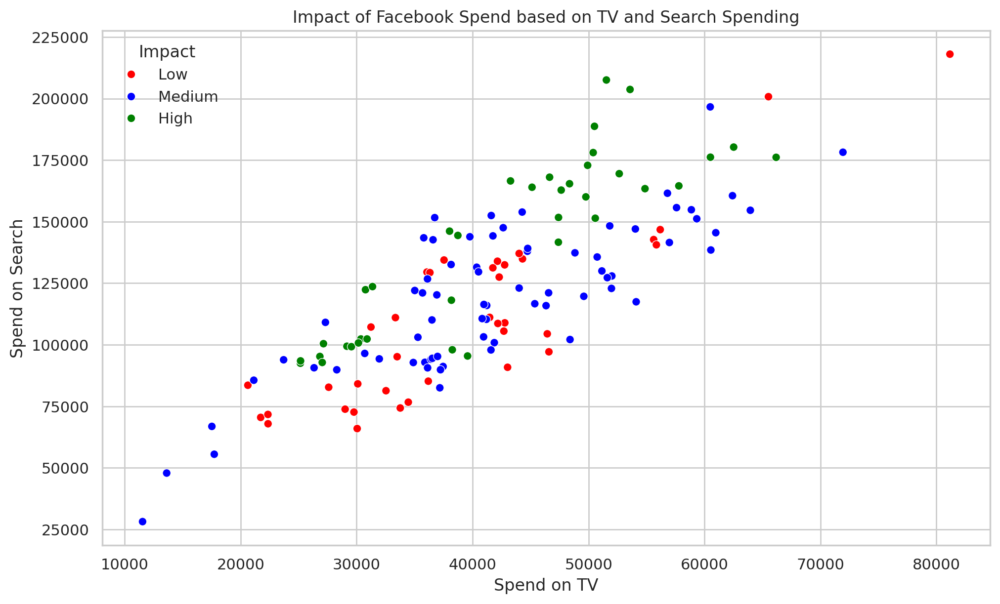

The figure layout has changed to tight


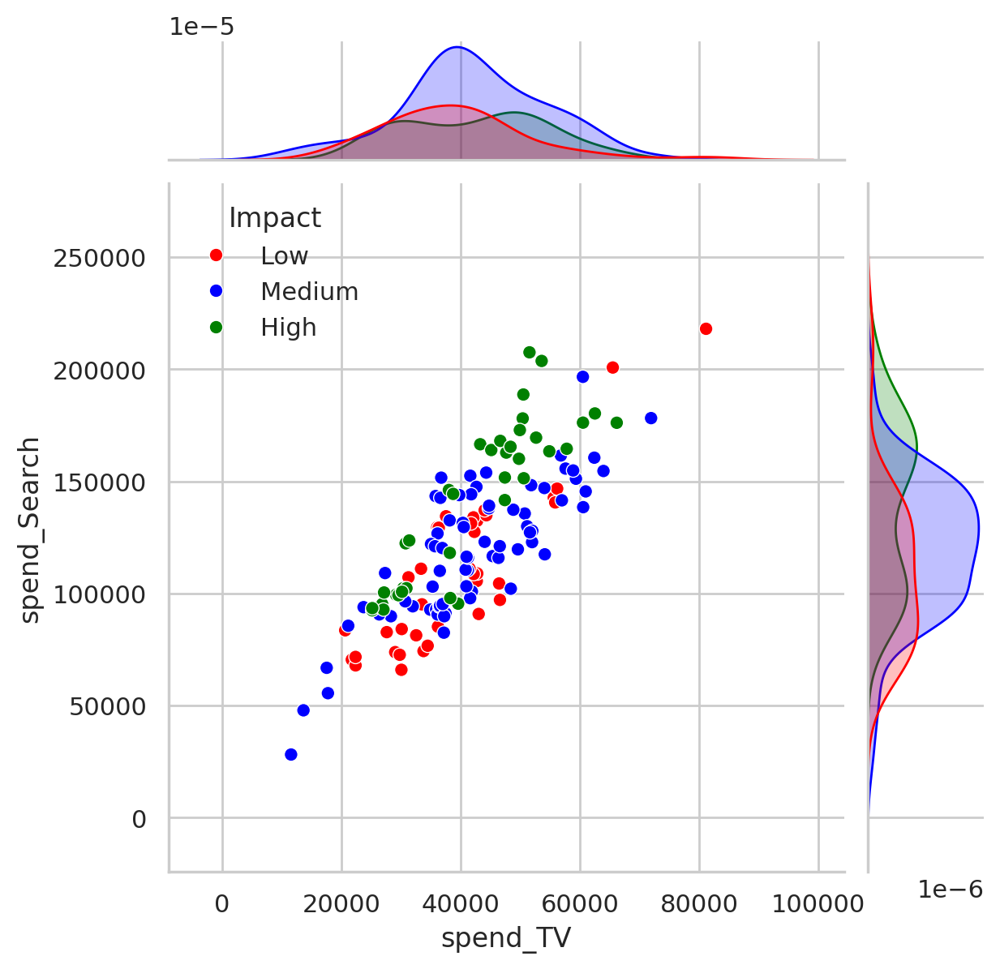

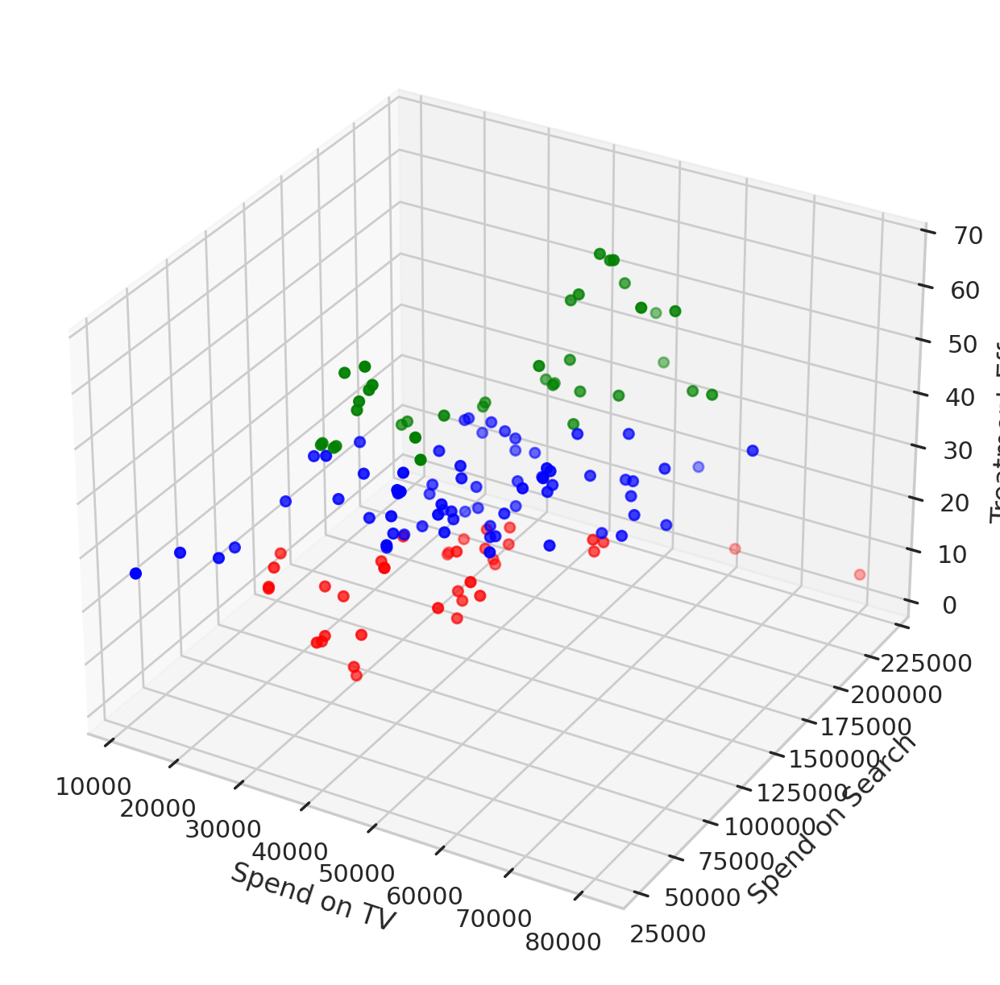

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from econml.dml import CausalForestDML
import matplotlib.pyplot as plt
import seaborn as sns  # Import seaborn for enhanced visualizations
# Actionable Insights

# 1. Identify High-Impact Samples
high_impact_indices = np.where(sorted_treatment_effects > np.percentile(sorted_treatment_effects, 75))[0] # Top 25%
high_impact_samples = sorted_X_test[high_impact_indices]
print("High Impact Samples (spend_TV, spend_Search):", high_impact_samples)

# 2. Identify Low-Impact Samples
low_impact_indices = np.where(sorted_treatment_effects < np.percentile(sorted_treatment_effects, 25))[0] # Bottom 25%
low_impact_samples = sorted_X_test[low_impact_indices]
print("Low Impact Samples (spend_TV, spend_Search):", low_impact_samples)

# --- Visualization ---

# 1. Scatter Plot with Color Coding

# Create a DataFrame for plotting
df_plot = pd.DataFrame(sorted_X_test, columns=['spend_TV', 'spend_Search'])
df_plot['Treatment Effect'] = sorted_treatment_effects

# Add a column to identify high and low impact samples
df_plot['Impact'] = 'Medium'
df_plot.loc[high_impact_indices, 'Impact'] = 'High'
df_plot.loc[low_impact_indices, 'Impact'] = 'Low'

# Scatter plot with color coding for impact
plt.figure(figsize=(10, 6))
sns.scatterplot(x='spend_TV', y='spend_Search', hue='Impact', data=df_plot, palette={'High': 'green', 'Medium': 'blue', 'Low': 'red'})
plt.xlabel('Spend on TV')
plt.ylabel('Spend on Search')
plt.title('Impact of Facebook Spend based on TV and Search Spending')
plt.show()

# 2. Joint Plot with Marginal Distributions

# Joint plot with scatter plot and marginal histograms
sns.jointplot(x='spend_TV', y='spend_Search', data=df_plot, hue='Impact', palette={'High': 'green', 'Medium': 'blue', 'Low': 'red'})
plt.show()

# 3. 3D Scatter Plot (if you have enough data points)

# For a more interactive visualization, you can use a 3D scatter plot
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_plot['spend_TV'], df_plot['spend_Search'], sorted_treatment_effects, c=df_plot['Impact'].map({'High': 'green', 'Medium': 'blue', 'Low': 'red'}))
ax.set_xlabel('Spend on TV')
ax.set_ylabel('Spend on Search')
ax.set_zlabel('Treatment Effect')
plt.show()

Step 4: Refutation

In [ ]:
#Adding a random common cause variable
res_random=model.refute_estimate(identified_estimand, estimate, method_name="random_common_cause")
print(res_random)

/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFra

Refute: Add a random common cause
Estimated effect:25.534294571261853
New effect:25.57406487781787
p value:0.8799999999999999



/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFra

In [ ]:
#Replacing treatment with a random (placebo) variable

res_placebo=model.refute_estimate(identified_estimand, estimate,
        method_name="placebo_treatment_refuter", placebo_type="permute")
print(res_placebo)

/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFra

Refute: Use a Placebo Treatment
Estimated effect:25.534294571261853
New effect:0.03196581461466849
p value:0.96



/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFra

In [ ]:
#Removing a random subset of the data
res_subset=model.refute_estimate(identified_estimand, estimate,
        method_name="data_subset_refuter", subset_fraction=0.9)
print(res_subset)

/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFra

Refute: Use a subset of data
Estimated effect:25.534294571261853
New effect:25.58607863264042
p value:0.98



/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]


Sensitivty analysis

In [ ]:
res_unobserved=model.refute_estimate(identified_estimand, estimate, method_name="add_unobserved_common_cause",
                                    confounders_effect_on_treatment="binary_flip", confounders_effect_on_outcome="linear",
                                   effect_strength_on_treatment=0.01, effect_strength_on_outcome=0.02)
print(res_unobserved)

Refute: Add an Unobserved Common Cause
Estimated effect:25.534294571261853
New effect:5.960063431411982



/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]


/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFra

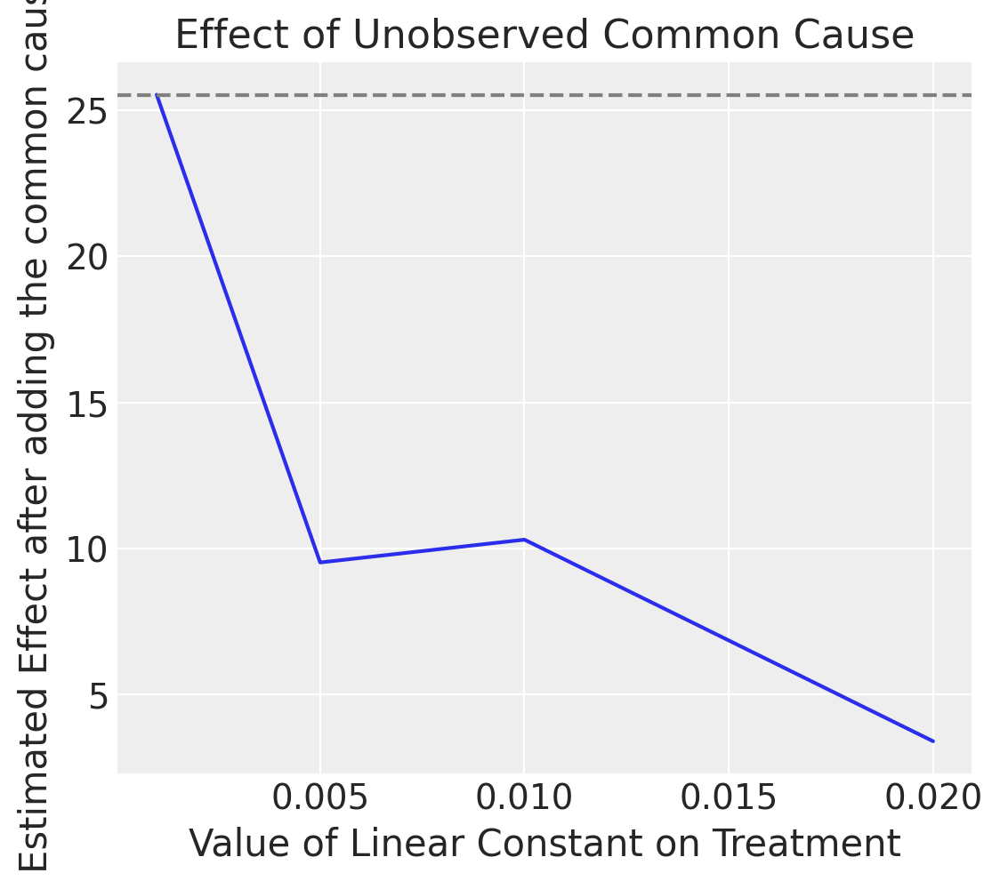

Refute: Add an Unobserved Common Cause
Estimated effect:25.534294571261853
New effect:(np.float64(3.4049434969201684), np.float64(25.534294578479603))



In [ ]:
res_unobserved_range=model.refute_estimate(identified_estimand, estimate, method_name="add_unobserved_common_cause",
                                    confounders_effect_on_treatment="binary_flip", confounders_effect_on_outcome="linear",
                                   effect_strength_on_treatment=np.array([0.001, 0.005, 0.01, 0.02]), effect_strength_on_outcome=0.01)
print(res_unobserved_range)

/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFra

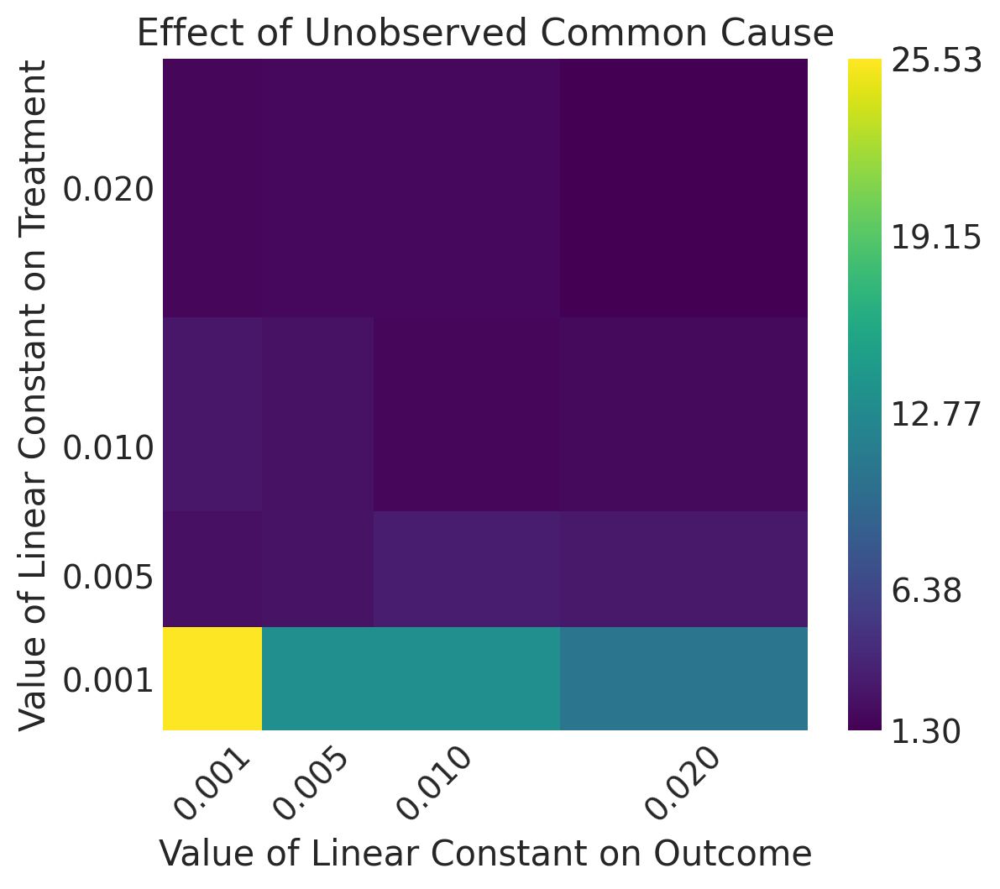

Refute: Add an Unobserved Common Cause
Estimated effect:25.534294571261853
New effect:(np.float64(1.2991390665993094), np.float64(25.534294574172236))



In [ ]:
res_unobserved_range=model.refute_estimate(identified_estimand, estimate, method_name="add_unobserved_common_cause",
                                          confounders_effect_on_treatment="binary_flip", confounders_effect_on_outcome="linear",
                                          effect_strength_on_treatment=[0.001, 0.005, 0.01, 0.02],
                                          effect_strength_on_outcome=[0.001, 0.005, 0.01,0.02])
print(res_unobserved_range)

In [ ]:
res_unobserved_auto = model.refute_estimate(identified_estimand, estimate, method_name="add_unobserved_common_cause",
                                          confounders_effect_on_treatment="binary_flip", confounders_effect_on_outcome="linear")
print(res_unobserved_auto)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


ValueError: Unknown label type: 'continuous'

## Google Model

In [ ]:
import statsmodels.api as sm
import pandas as pd

# Define the dependent variable (Outcome)
y = data['total_revenue']

# Define the independent variable (Treatment), add constant to the model
X = data[['spend_Search']]
X = sm.add_constant(X)  # Adds a constant term (intercept) to the model

# Fit the OLS model
ols_model = sm.OLS(y, X).fit()

# Print the regression results
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:          total_revenue   R-squared:                       0.210
Model:                            OLS   Adj. R-squared:                  0.209
Method:                 Least Squares   F-statistic:                     193.9
Date:                Sun, 27 Jul 2025   Prob (F-statistic):           2.99e-39
Time:                        09:52:05   Log-Likelihood:                -11650.
No. Observations:                 730   AIC:                         2.330e+04
Df Residuals:                     728   BIC:                         2.331e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const        -4.361e+04   2.49e+05     -0.175   

Step1: Causal Graph

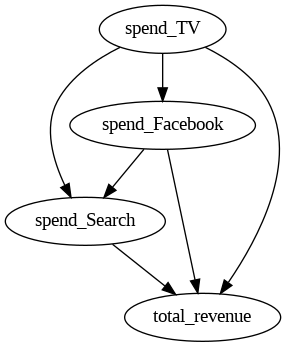

In [ ]:
from dowhy import CausalModel
from IPython.display import Image, display


# Define the DOT string for the causal graph
causal_graph = """
digraph {
    spend_TV ->  spend_Facebook
    spend_TV -> spend_Search;
    spend_Facebook -> spend_Search;
    spend_TV -> total_revenue;
    spend_Facebook -> total_revenue;
    spend_Search -> total_revenue;
}
"""

# Create the causal model
model = CausalModel(
    data=data,
    treatment='spend_Search',
    outcome='total_revenue',
    identify_vars = True,
    common_causes=['spend_TV', 'spend_Facebook'],
    graph=causal_graph)


from IPython.display import Image, display
display(Image(filename="causal_model.png"))


Step 2: Identification

In [ ]:
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                                                 
───────────────(E[total_revenue|spend_TV,spend_Facebook])
d[spend_Search]                                          
Estimand assumption 1, Unconfoundedness: If U→{spend_Search} and U→total_revenue then P(total_revenue|spend_Search,spend_TV,spend_Facebook,U) = P(total_revenue|spend_Search,spend_TV,spend_Facebook)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

### Estimand : 4
Estimand name: general_adjustment
Estimand expression:
       d                                                 
───────────────(E[total_revenue|spend_TV,spend_Facebook])
d[spend_Search]                                          
Estimand assumption 1, Unconfoundedness: If U→{spend_Search} and U→total_revenue then P(total_revenue|spend_Search,spend_TV,spend_Facebook,

Step 3: Estimation


In [ ]:
data.dtypes

### LR

In [ ]:
estimate = model.estimate_effect(identified_estimand,
        method_name="backdoor.linear_regression",  confidence_intervals=True,
  test_significance=True)
print("Causal Estimate is " + str(estimate))



Causal Estimate is *** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                                                 
───────────────(E[total_revenue|spend_TV,spend_Facebook])
d[spend_Search]                                          
Estimand assumption 1, Unconfoundedness: If U→{spend_Search} and U→total_revenue then P(total_revenue|spend_Search,spend_TV,spend_Facebook,U) = P(total_revenue|spend_Search,spend_TV,spend_Facebook)

## Realized estimand
b: total_revenue~spend_Search+spend_TV+spend_Facebook
Target units: ate

## Estimate
Mean value: -2.7446399512700737
p-value: [0.49823232]
95.0% confidence interval: [[-10.69662767   5.20734777]]



/usr/local/lib/python3.11/dist-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]


### DoubleML

In [ ]:
import econml
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor
dml_estimate = model.estimate_effect(identified_estimand,
                                    method_name="backdoor.econml.dml.DML",
                                    method_params={
                                        'init_params': {'model_y':GradientBoostingRegressor(),
                                                        'model_t': GradientBoostingRegressor(),
                                                        'model_final':LassoCV(fit_intercept=False), },
                                        'fit_params': {}
                                     })
print(dml_estimate)

/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                                                 
───────────────(E[total_revenue|spend_TV,spend_Facebook])
d[spend_Search]                                          
Estimand assumption 1, Unconfoundedness: If U→{spend_Search} and U→total_revenue then P(total_revenue|spend_Search,spend_TV,spend_Facebook,U) = P(total_revenue|spend_Search,spend_TV,spend_Facebook)

## Realized estimand
b: total_revenue~spend_Search+spend_TV+spend_Facebook | 
Target units: ate

## Estimate
Mean value: -8.989471357707275
Effect estimates: [[-8.98947136]]



In [ ]:
import dowhy
print(dowhy.__version__)

### Causal Forest

Treatment Effects: [ 21.89731604 -20.2569186   -4.48914366  17.06306626  -8.89124441
   0.75292857  16.82995148  -6.88385583   5.71620035 -19.67377254
  22.12298083 -46.67991529 -24.46709159 -33.44966228  -4.24849384
  -2.87555578  -5.84948741  16.72858615  25.65090073  16.96626719
  20.77860355  -7.48542699   8.19935897  29.65351739 -16.57877475
 -33.52547568  10.89653341  15.45481826 -11.30706825   4.36916872
  28.84335446 -15.7546146   28.77785498  -7.2346534  -11.80670396
 -24.85676879  -2.77762855  16.78460076  26.52615    -22.23575642
  24.00935035   0.85385999  27.42197953  -6.22721833 -14.20033334
 -14.79174286   2.6971917    0.25335178  -6.3503882   -2.79657602
  -8.75620048   1.83680744   2.71225862  -3.6970489   -6.55114709
  14.233724    26.86969054 -19.26346658  -9.35858167  -0.97105643
 -25.08441736 -18.18347373 -13.53659147 -15.0893031   -4.88112832
 -10.39348539 -12.16077661   8.53120861  -1.37019478 -30.51028769
  -0.97105643  21.36417896   5.90859038  -4.42488269  13.

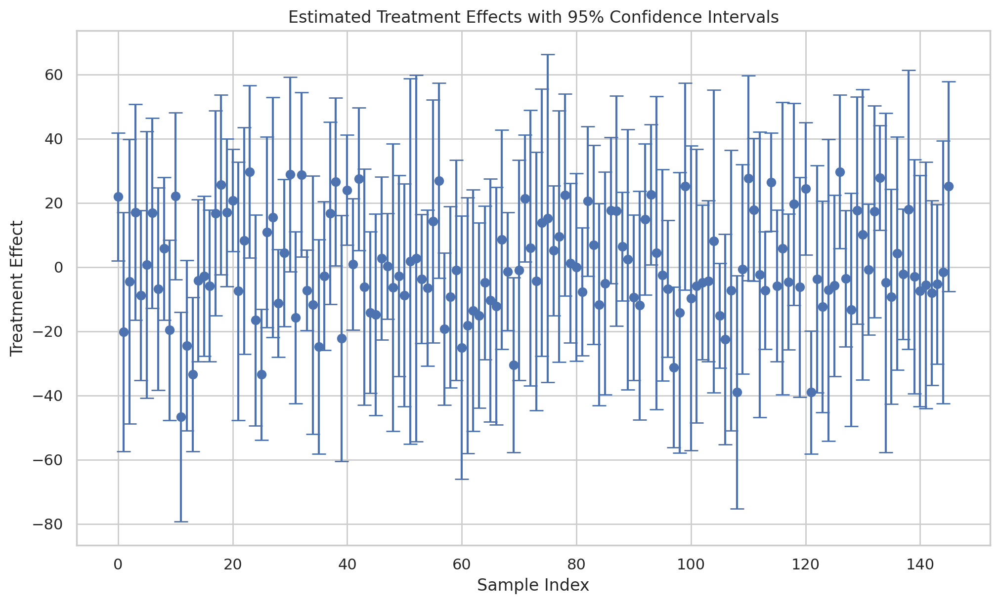

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from econml.dml import CausalForestDML

# Define the outcome, treatment, and covariates
Y = data['total_revenue'].values
T = data['spend_Search'].values
X = data[['spend_TV', 'spend_Facebook']].values

# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test, T_train, T_test = train_test_split(X, Y, T, test_size=0.2, random_state=42)

# Initialize CausalForestDML
cf_dml_estimator = CausalForestDML(
    model_y=RandomForestRegressor(),
    model_t=RandomForestRegressor(),
    discrete_treatment=False,
    random_state=42
)

# Fit the model
cf_dml_estimator.fit(Y_train, T_train, X=X_train)

# Estimate treatment effects
treatment_effects = cf_dml_estimator.effect(X_test)

# Estimate confidence intervals for treatment effects
lower_bounds, upper_bounds = cf_dml_estimator.effect_interval(X_test, alpha=0.05)

# Print the treatment effects and confidence intervals
print("Treatment Effects:", treatment_effects)
print("Lower Bounds:", lower_bounds)
print("Upper Bounds:", upper_bounds)

# Optionally, visualize the treatment effects with confidence intervals
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.errorbar(range(len(treatment_effects)), treatment_effects, yerr=[treatment_effects - lower_bounds, upper_bounds - treatment_effects], fmt='o', capsize=5)
plt.xlabel('Sample Index')
plt.ylabel('Treatment Effect')
plt.title('Estimated Treatment Effects with 95% Confidence Intervals')
plt.grid(True)
plt.show()

In [ ]:
np.mean(treatment_effects)

0.175271477031758

In [ ]:
import pandas as pd
import numpy as np
from econml.dml import DML
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LassoCV
from sklearn.model_selection import train_test_split
# Step 2: Define Variables
X = data[['spend_TV', 'spend_Facebook']].values  # Common causes
T = data['spend_Search'].values  # Treatment
y = data['total_revenue'].values  # Outcome

# Step 3: Ensure correct shapes for inputs
y = y.ravel()  # Convert to 1D array if necessary

# Step 4: Initialize the DML model
dml_model = DML(
    model_y=GradientBoostingRegressor(),
    model_t=GradientBoostingRegressor(),
    model_final=LinearRegression()
)

# Step 5: Fit the model
dml_model.fit(Y=y, T=T, X=X)  # Pass y, T, and X as keyword arguments

# Step 6: Estimate Treatment Effect
treatment_effect = dml_model.effect(X)
print("Treatment Effect:", treatment_effect)

# Optional: Confidence Intervals
lower, upper = dml_model.effect_interval(X)
print("Confidence Interval:", lower, upper)

Treatment Effect: [ 3.94540127e-02  2.47534300e-02 -8.81484378e-02  5.93975646e-02
  3.71197102e-02  1.30834252e-02 -6.60692329e-03  6.11832272e-02
 -4.28299556e-03  2.58264545e-02  4.50064193e-02 -9.42786079e-03
  1.78362524e-02  5.83557912e-02 -5.04869205e-02 -8.17694846e-02
  6.76023631e-02  6.19887284e-02  3.92707702e-02  2.25816486e-02
 -9.30044101e-02 -2.17425586e-02  8.12784736e-02  3.61698357e-02
 -1.03940659e-01  4.05107346e-02  2.87081147e-02  3.31146330e-02
  2.45118216e-02 -5.63031347e-02  8.28584734e-02  1.45860149e-02
  5.33382161e-02  6.65337302e-02 -8.43018754e-04  7.81039244e-02
  4.31253688e-02 -4.43888448e-02 -1.34031512e-02  5.18747195e-02
 -1.08321658e-02  2.19166989e-02  3.14948619e-02 -9.93292015e-04
 -1.06433976e-01  5.88652786e-02 -4.57783719e-02  2.61049365e-02
 -5.59077201e-02  7.33890774e-03  1.79565984e-02 -7.74204088e-02
  2.31568198e-02  3.64257263e-02 -1.73972754e-03 -4.37518007e-02
  5.13783155e-02  2.81697041e-02 -3.62936721e-02 -2.70939893e-02
  4.214

The final model has a nonzero intercept for at least one outcome; it will be subtracted, but consider fitting a model without an intercept if possible.
The final model has a nonzero intercept for at least one outcome; it will be subtracted, but consider fitting a model without an intercept if possible. Standard errors will also be slightly incorrect if the final model used fits an intercept as they will be including the variance of the intercept parameter estimate.
Final model doesn't have a `prediction_stderr` method, only point estimates will be returned.


AttributeError: Only point estimates are available!

The the expected change in revenue due to a change in Search, conditioned on tv and facebook, by using the Backdoor criterion

In [ ]:
from econml.dml import LinearDML
dml = LinearDML(model_y=GradientBoostingRegressor(),
                model_t=GradientBoostingRegressor())
dml.fit(Y, T, X=X)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
x_learner_estimate = model.estimate_effect(identified_estimand,
                                method_name="backdoor.econml.metalearners.XLearner",
                                confidence_intervals=False,
                                method_params={"init_params":{
                                                    'models': RandomForestRegressor()
                                                    },
                                               "fit_params":{}
                                              })
print(x_learner_estimate)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


KeyboardInterrupt: 

In [ ]:
print(f"Estimate value: {estimate.value}, Type: {type(estimate.value)}")
print(f"Intercept value: {estimate.params['intercept']}, Type: {type(estimate.params['intercept'])}")

Step 4: Refutation


Refutation methods provide tests that every correct estimator should pass. So if an estimator fails the refutation test (p-value is <0.05), then it means that there is some problem with the estimator.

RESULTS:

- Adding a random common cause variable: Pass

- Replacing treatment with a random (placebo) variable: Pass

- Removing a random subset of the dat: Pass





In [ ]:
import warnings

# Suppress all FutureWarnings
warnings.simplefilter(action="ignore", category=FutureWarning)

In [ ]:
#Adding a random common cause variable
res_random=model.refute_estimate(identified_estimand, estimate, method_name="random_common_cause")
print(res_random)

Refute: Add a random common cause
Estimated effect:-1.1576004135422409
New effect:-1.2037161482404917
p value:0.78



In [ ]:
#Replacing treatment with a random (placebo) variable

res_placebo=model.refute_estimate(identified_estimand, estimate,
        method_name="placebo_treatment_refuter", placebo_type="permute")
print(res_placebo)

Refute: Use a Placebo Treatment
Estimated effect:0.03949055612611119
New effect:-0.0015999538310279603
p value:0.9



In [ ]:
#Removing a random subset of the data
res_subset=model.refute_estimate(identified_estimand, estimate,
        method_name="data_subset_refuter", subset_fraction=0.9)
print(res_subset)

Refute: Use a subset of data
Estimated effect:0.03949055612611119
New effect:0.04003856522649585
p value:0.98



There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword


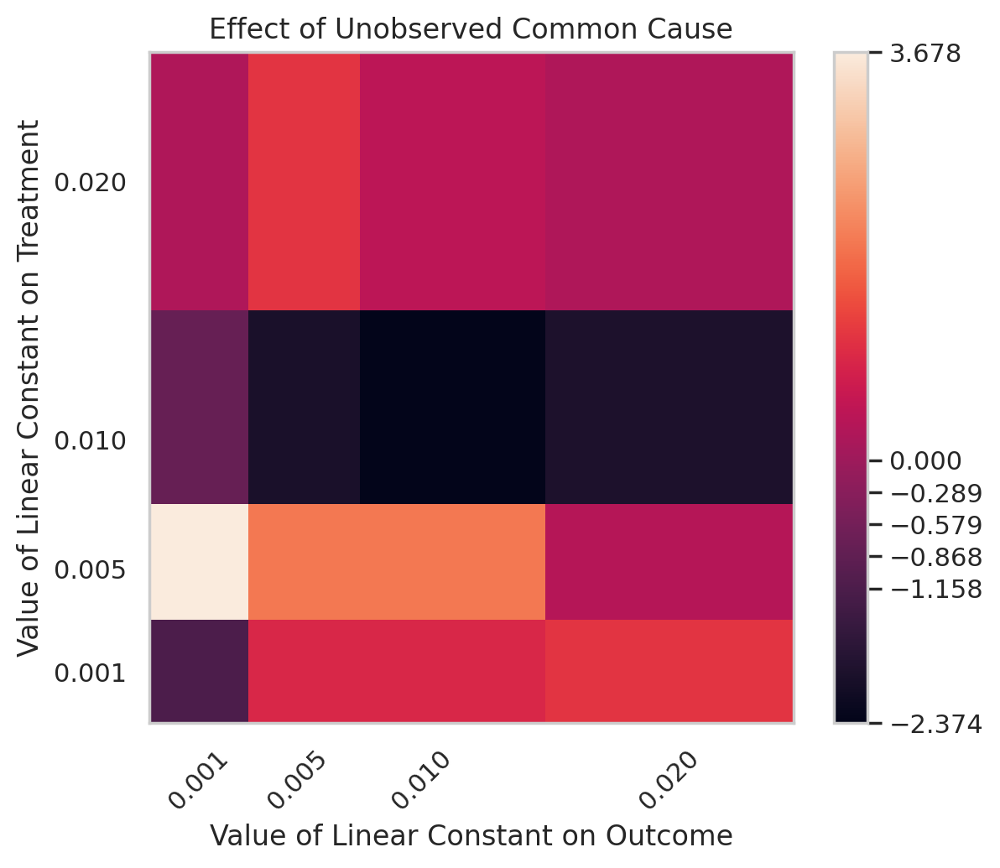

Refute: Add an Unobserved Common Cause
Estimated effect:-1.1576004135422409
New effect:(-2.3737750560976565, 3.677889993414283)



In [ ]:
res_unobserved_range=model.refute_estimate(identified_estimand, estimate, method_name="add_unobserved_common_cause",
                                          confounders_effect_on_treatment="binary_flip", confounders_effect_on_outcome="linear",
                                          effect_strength_on_treatment=[0.001, 0.005, 0.01, 0.02],
                                          effect_strength_on_outcome=[0.001, 0.005, 0.01,0.02])
print(res_unobserved_range)

## TV model




In [ ]:
import statsmodels.api as sm
import pandas as pd

# Define the dependent variable (Outcome)
y = data['total_revenue']

# Define the independent variable (Treatment), add constant to the model
X = data[['spend_TV']]
X = sm.add_constant(X)  # Adds a constant term (intercept) to the model

# Fit the OLS model
ols_model = sm.OLS(y, X).fit()

# Print the regression results
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:          total_revenue   R-squared:                       0.239
Model:                            OLS   Adj. R-squared:                  0.238
Method:                 Least Squares   F-statistic:                     228.3
Date:                Thu, 20 Feb 2025   Prob (F-statistic):           4.59e-45
Time:                        19:38:14   Log-Likelihood:                -8794.6
No. Observations:                 730   AIC:                         1.759e+04
Df Residuals:                     728   BIC:                         1.760e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       4315.2066   5042.894      0.856      0.3

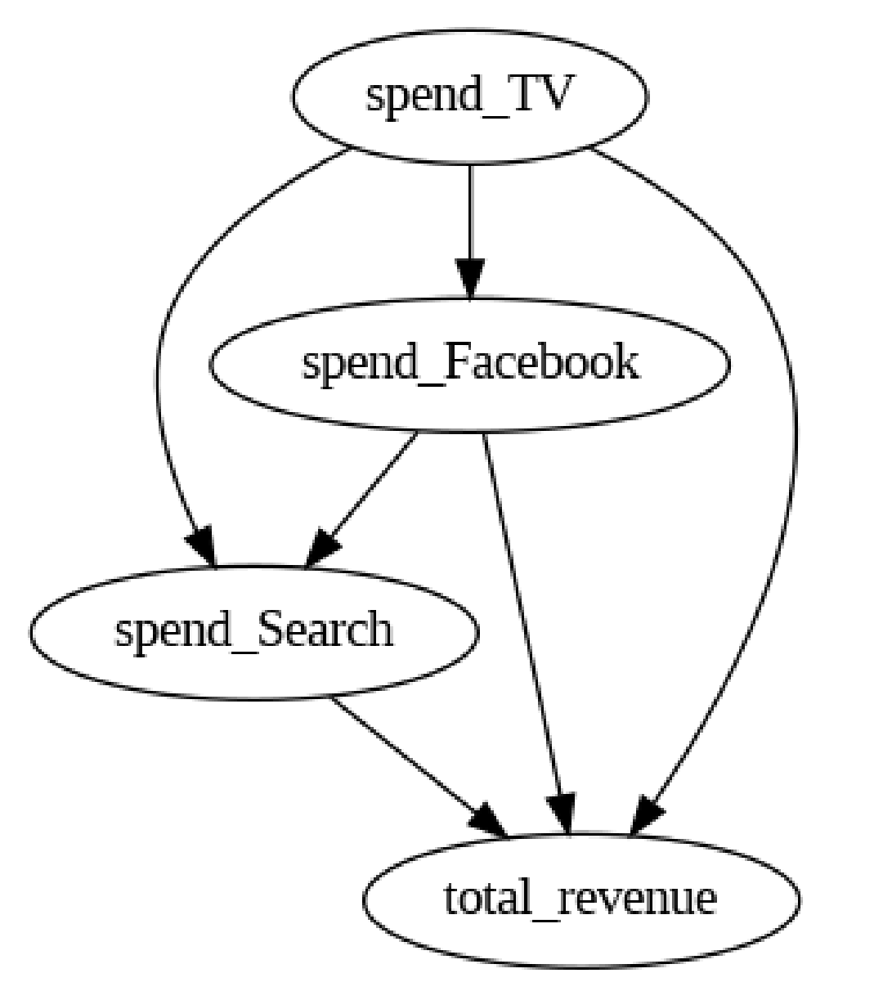

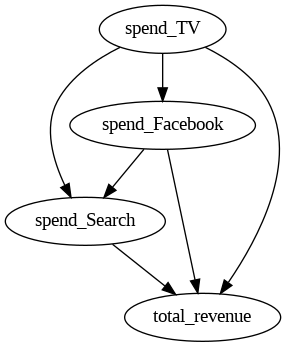

In [ ]:
from dowhy import CausalModel
from IPython.display import Image, display

# Define the DOT string for the causal graph
causal_graph = """
digraph {
    spend_TV ->  spend_Facebook
    spend_TV -> spend_Search;
    spend_Facebook -> spend_Search;
    spend_TV -> total_revenue;
    spend_Facebook -> total_revenue;
    spend_Search -> total_revenue;
}
"""


# Create the causal model
model = CausalModel(
    data=data,
    treatment='spend_TV',
    outcome='total_revenue',
    identify_vars = True,
    graph=causal_graph)

# View and display the model
model.view_model()
from IPython.display import Image, display
display(Image(filename="causal_model.png"))


# common_causes=['spend_Facebook', 'spend_Search'],


In [ ]:
help(CausalModel)

Help on class CausalModel in module dowhy.causal_model:

class CausalModel(builtins.object)
 |  CausalModel(data, treatment, outcome, graph=None, common_causes=None, instruments=None, effect_modifiers=None, estimand_type='nonparametric-ate', proceed_when_unidentifiable=False, missing_nodes_as_confounders=False, identify_vars=False, **kwargs)
 |  
 |  Main class for storing the causal model state.
 |  
 |  Methods defined here:
 |  
 |  __init__(self, data, treatment, outcome, graph=None, common_causes=None, instruments=None, effect_modifiers=None, estimand_type='nonparametric-ate', proceed_when_unidentifiable=False, missing_nodes_as_confounders=False, identify_vars=False, **kwargs)
 |      Initialize data and create a causal graph instance.
 |      
 |      Assigns treatment and outcome variables.
 |      Also checks and finds the common causes and instruments for treatment
 |      and outcome.
 |      
 |      At least one of graph, common_causes or instruments must be provided. If
 |

Step 2: Identification

- Total Effect: The standard identify_effect() without parameters estimates the total causal effect of TV spending on revenue, including all pathways (direct and indirect through Facebook and Search).
- Natural Direct Effect (NDE): This estimates the effect of TV spending on revenue that doesn't go through the mediators (Facebook and Search). It answers: "How much would revenue change if we changed TV spending but kept Facebook and Search spending at the levels they would have been at the original TV spending?"
- Natural Indirect Effect (NIE): This captures the effect of TV spending on revenue that works through the mediating variables. It answers: "How much would revenue change if we kept TV spending fixed but allowed Facebook and Search spending to change as they would with different TV spending?"

In [ ]:
identified_estimand_nde = model.identify_effect(
    estimand_type="nonparametric-nde",
    proceed_when_unidentifiable=True)
print(identified_estimand_nde)


Estimand type: EstimandType.NONPARAMETRIC_NDE

### Estimand : 1
Estimand name: mediation
Estimand expression:
 ⎡     d                                 ⎤
E⎢───────────(total_revenue|spend_Search)⎥
 ⎣d[spend_TV]                            ⎦
Estimand assumption 1, Mediation: spend_Search intercepts (blocks) all directed paths from spend_TV to t,o,t,a,l,_,r,e,v,e,n,u,e except the path {spend_TV}→{t,o,t,a,l,_,r,e,v,e,n,u,e}.
Estimand assumption 2, First-stage-unconfoundedness: If U→{spend_TV} and U→{spend_Search} then P(spend_Search|spend_TV,U) = P(spend_Search|spend_TV)
Estimand assumption 3, Second-stage-unconfoundedness: If U→{spend_Search} and U→total_revenue then P(total_revenue|spend_Search, spend_TV, U) = P(total_revenue|spend_Search, spend_TV)



In [ ]:
identified_estimand = model.identify_effect(proceed_when_unidentifiable= False)
print(identified_estimand)


# Natural direct effect (nde)
identified_estimand_nde = model.identify_effect(estimand_type="nonparametric-nde",optimize_backdoor=True,
                                                proceed_when_unidentifiable=True)
print(identified_estimand_nde)


# Natural indirect effect (nie)
identified_estimand_nie = model.identify_effect(estimand_type="nonparametric-nie",optimize_backdoor=True,
                                                proceed_when_unidentifiable=True)
print(identified_estimand_nie)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
     d                      
───────────(E[totalᵣₑᵥₑₙᵤₑ])
d[spend_TV]                 
Estimand assumption 1, Unconfoundedness: If U→{spend_TV} and U→total_revenue then P(total_revenue|spend_TV,,U) = P(total_revenue|spend_TV,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Estimand type: EstimandType.NONPARAMETRIC_NDE

### Estimand : 1
Estimand name: mediation
Estimand expression:
 ⎡     d                                 ⎤
E⎢───────────(total_revenue|spend_Search)⎥
 ⎣d[spend_TV]                            ⎦
Estimand assumption 1, Mediation: spend_Search intercepts (blocks) all directed paths from spend_TV to t,o,t,a,l,_,r,e,v,e,n,u,e except the path {spend_TV}→{t,o,t,a,l,_,r,e,v,e,n,u,e}.
Estimand assumption 2, First-stage-unconfoundedness: If U→{spend_TV} and U→{spend_Search} then P(spend_Sea

Step 3: Estimation


In [ ]:
data.dtypes

In [ ]:
estimate = model.estimate_effect(identified_estimand,
        method_name="backdoor.linear_regression")
print("Causal Estimate is " + str(estimate.value))



Causal Estimate is 1.7863126664205993


In [ ]:
print(f"Estimate value: {estimate.value}, Type: {type(estimate.value)}")
print(f"Intercept value: {estimate.params['intercept']}, Type: {type(estimate.params['intercept'])}")

In [ ]:
import econml
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor
dml_estimate = model.estimate_effect(identified_estimand,
                                    method_name="backdoor.econml.dml.DML",
                                    method_params={
                                        'init_params': {'model_y':GradientBoostingRegressor(),
                                                        'model_t': GradientBoostingRegressor(),
                                                        'model_final':LassoCV(fit_intercept=False), },
                                        'fit_params': {}
                                     })
print(dml_estimate)

*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
     d                      
───────────(E[totalᵣₑᵥₑₙᵤₑ])
d[spend_TV]                 
Estimand assumption 1, Unconfoundedness: If U→{spend_TV} and U→total_revenue then P(total_revenue|spend_TV,,U) = P(total_revenue|spend_TV,)

## Realized estimand
b: total_revenue~spend_TV | 
Target units: ate

## Estimate
Mean value: 1.7927945331138717
Effect estimates: [[1.79279453]]



A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


In [ ]:
import warnings

# Suppress all FutureWarnings
warnings.simplefilter(action="ignore", category=FutureWarning)

In [ ]:
#Adding a random common cause variable
res_random=model.refute_estimate(identified_estimand, estimate, method_name="random_common_cause")
print(res_random)

In [ ]:
#Replacing treatment with a random (placebo) variable

res_placebo=model.refute_estimate(identified_estimand, estimate,
        method_name="placebo_treatment_refuter", placebo_type="permute")
print(res_placebo)

In [ ]:
#Removing a random subset of the data
res_subset=model.refute_estimate(identified_estimand, estimate,
        method_name="data_subset_refuter", subset_fraction=0.9)
print(res_subset)

In [ ]:
help(model.estimate_effect)

# Causal Discovery

In [ ]:
!pip install causal-learn

In [ ]:
from causallearn.search.ConstraintBased.PC import pc
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import io
import matplotlib.pyplot as plt

Processing

In [ ]:
## Load your data (replace with your actual data)
data = pd.read_csv('/content/masters_daily_level_dataset.csv')

# Convert 'DATE' column to datetime objects
data['DATE'] = pd.to_datetime(data['DATE'])

# Drop the 'DATE' column as it is not needed for causal analysis
data = data.drop(columns=['DATE'])

# Focus only on the relevant variables
data = data[['spend_Facebook', 'spend_TV', 'spend_Search', 'total_revenue']]

# Check for NaN values and remove them
if data.isnull().values.any():
    data = data.dropna()

# Ensure all relevant variables are converted to numpy arrays
data_array = data.to_numpy()


Running PC algorithm with alpha = 0.01


  0%|          | 0/4 [00:00<?, ?it/s]

Graph structure:
Graph Nodes:
X1;X2;X3;X4

Graph Edges:
1. X1 --- X2
2. X1 --- X3
3. X1 --- X4
4. X2 --- X3



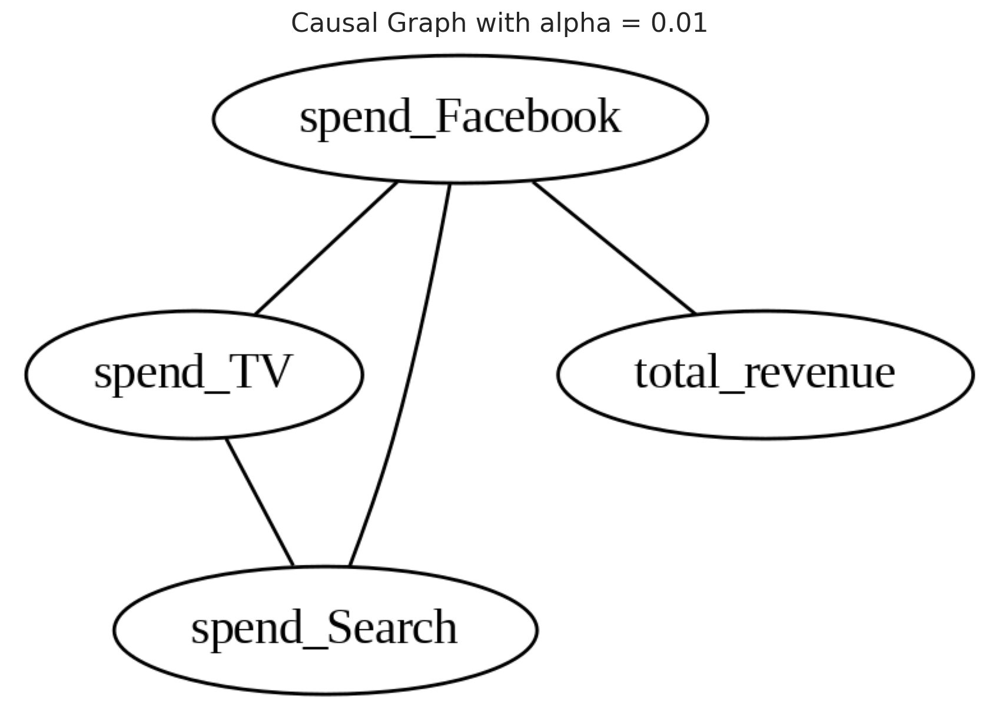

Running PC algorithm with alpha = 0.05


  0%|          | 0/4 [00:00<?, ?it/s]

Graph structure:
Graph Nodes:
X1;X2;X3;X4

Graph Edges:
1. X1 --- X2
2. X1 --- X3
3. X1 --- X4
4. X2 --- X3



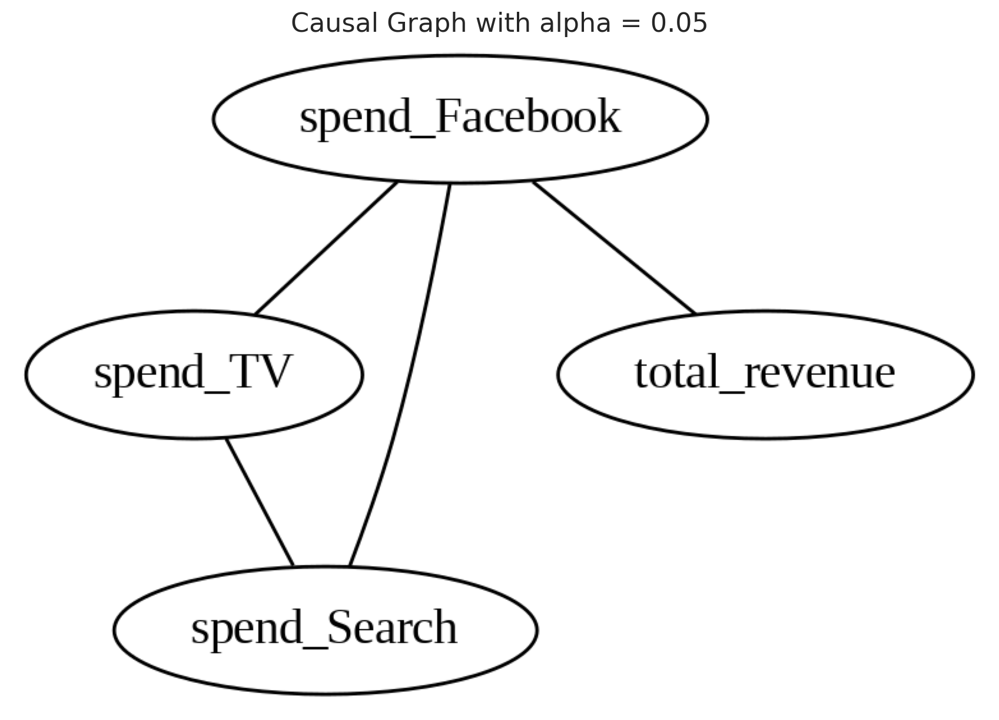

Running PC algorithm with alpha = 0.1


  0%|          | 0/4 [00:00<?, ?it/s]

Graph structure:
Graph Nodes:
X1;X2;X3;X4

Graph Edges:
1. X1 --- X2
2. X1 --- X3
3. X1 --- X4
4. X2 --- X3



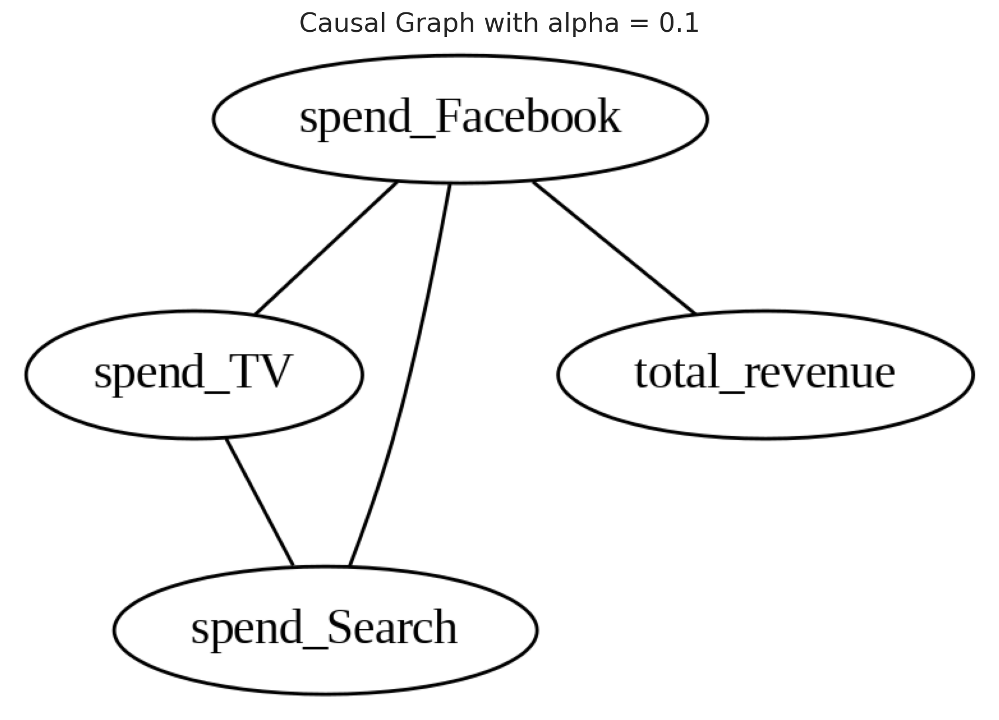

In [ ]:
from causallearn.utils.GraphUtils import GraphUtils
from causallearn.search.ConstraintBased.PC import pc
from causallearn.utils.cit import fisherz  # Import the fisherz test function

data = pd.read_csv('/content/masters_daily_level_dataset.csv')

# Convert 'DATE' column to datetime objects
data['DATE'] = pd.to_datetime(data['DATE'])

# Drop the 'DATE' column as it is not needed for causal analysis
data = data.drop(columns=['DATE'])

# Focus only on the relevant variables
data = data[['spend_Facebook', 'spend_TV', 'spend_Search', 'total_revenue']]

# Check for NaN values and remove them
if data.isnull().values.any():
    data = data.dropna()

# Convert DataFrame to NumPy array
data_array = data.values

# Define labels for the nodes
labels = {i: col for i, col in enumerate(data.columns)}


# Run the PC algorithm with different significance levels
for alpha in [0.01, 0.05, 0.1]:
    print(f"Running PC algorithm with alpha = {alpha}")
    cg = pc(data_array, alpha, fisherz)

    # Check the structure of the output graph
    print("Graph structure:")
    print(cg.G)

    # Visualize the causal graph
    pydot_graph = GraphUtils.to_pydot(cg.G, labels=labels)
    tmp_png = pydot_graph.create_png(f="png")
    fp = io.BytesIO(tmp_png)
    img = mpimg.imread(fp, format='png')
    plt.axis('off')
    plt.imshow(img)
    plt.title(f"Causal Graph with alpha = {alpha}")
    plt.show()

Data types: spend_Facebook    float64
spend_TV          float64
spend_Search      float64
total_revenue     float64
dtype: object


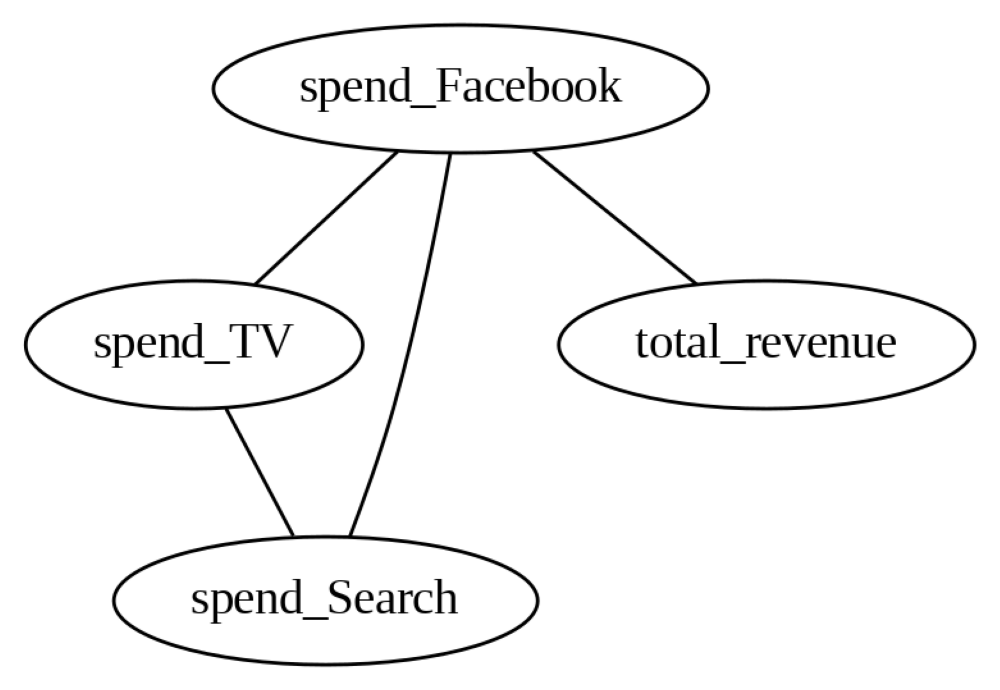

In [ ]:
from causallearn.search.ScoreBased.GES import ges

# Focus only on the relevant variables
data = data[['spend_Facebook', 'spend_TV', 'spend_Search', 'total_revenue']]

# Check for NaN values and remove them
if data.isnull().values.any():
    data = data.dropna()

# Ensure all relevant variables are converted to numpy arrays
data_array = data.to_numpy()

# Check the data types
print("Data types:", data.dtypes)

# Run the GES algorithm
Record = ges(data_array,'local_score_BIC')

# Visualization using pydot
labels = {i: col for i, col in enumerate(data.columns)}
pyd1 = GraphUtils.to_pydot(Record['G'], labels=labels)
tmp_png1 = pyd1.create_png(f="png")
fp1 = io.BytesIO(tmp_png1)
img1 = mpimg.imread(fp1, format='png')
plt.axis('off')
plt.imshow(img1)
plt.show()

  0%|          | 0/4 [00:00<?, ?it/s]

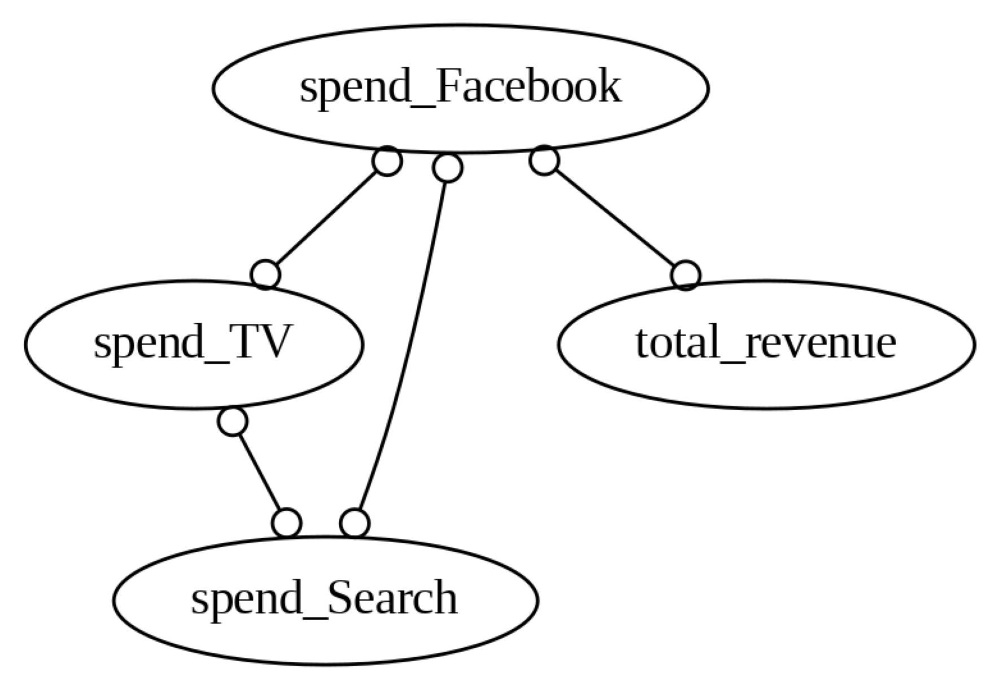

In [ ]:
from causallearn.search.ConstraintBased.FCI import fci

# Run the FCI algorithm
g, edges = fci(data_array)

# Visualization using pydot
labels = {i: col for i, col in enumerate(data.columns)}
pyd3 = GraphUtils.to_pydot(g, labels=labels)
tmp_png3 = pyd3.create_png(f="png")
fp3 = io.BytesIO(tmp_png3)
img3 = mpimg.imread(fp3, format='png')
plt.axis('off')
plt.imshow(img3)
plt.show()

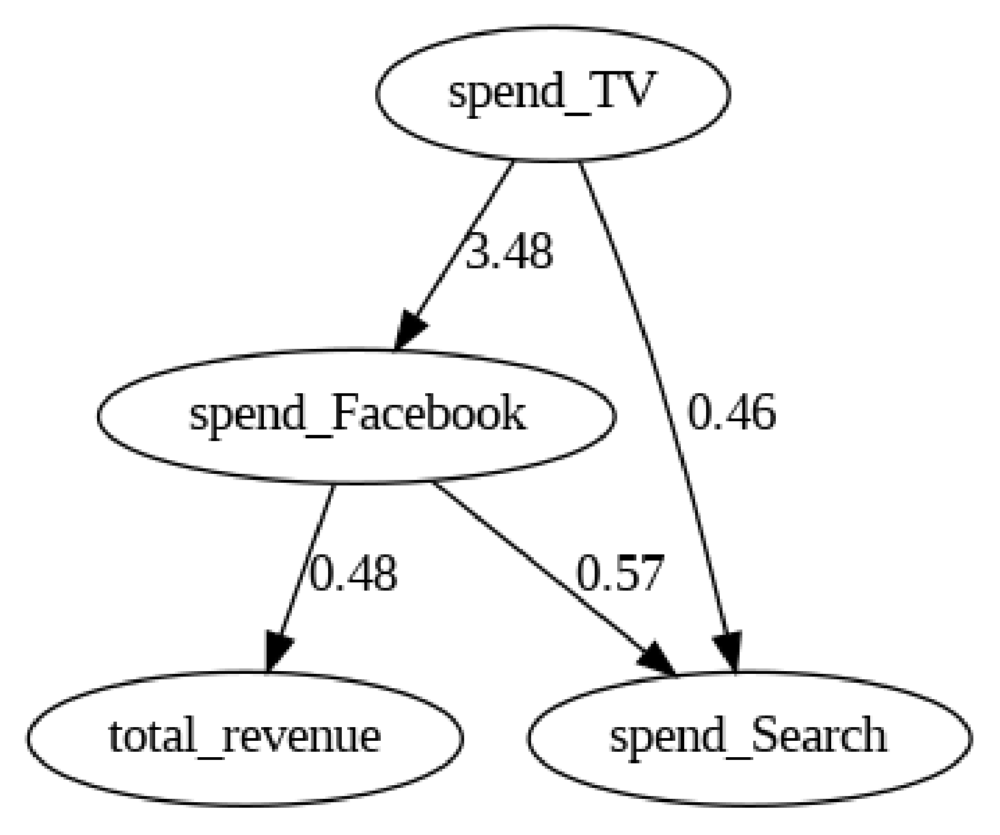

In [ ]:
from causallearn.search.FCMBased import lingam
from causallearn.search.FCMBased.lingam.utils import make_dot


# Focus only on the relevant variables
data = data[['spend_Facebook', 'spend_TV', 'spend_Search', 'total_revenue']]


# Run the LiNGAM algorithm
model_lingam = lingam.ICALiNGAM()
model_lingam.fit(data_array)

# Save the graph to a file and display it
dot.render('lingam_graph', format='png', cleanup=True)
img = plt.imread('lingam_graph.png')
plt.axis('off')
plt.imshow(img)
plt.show()

In [ ]:
data


,spend_Facebook,spend_TV,spend_Search,total_revenue
0,82034.937937,22385.451584,51660.038557,41206.413275
1,123990.866762,31711.024204,70107.649298,17277.378309
2,180539.928044,57882.927826,161598.362359,111878.270786
3,101978.039544,22882.830853,63744.266695,20338.446767
4,141986.600125,32982.511818,109457.001343,119773.127941
...,...,...,...,...
725,142408.449803,32481.572628,128471.255047,48932.459484
726,158220.141981,41563.805349,137512.053384,24523.186496
727,213712.838913,45151.749090,146995.665443,121411.119116
728,123160.665025,26664.223641,107727.707367,68606.422756


GRaSP edge count: 4    
GRaSP completed in: 0.03s 


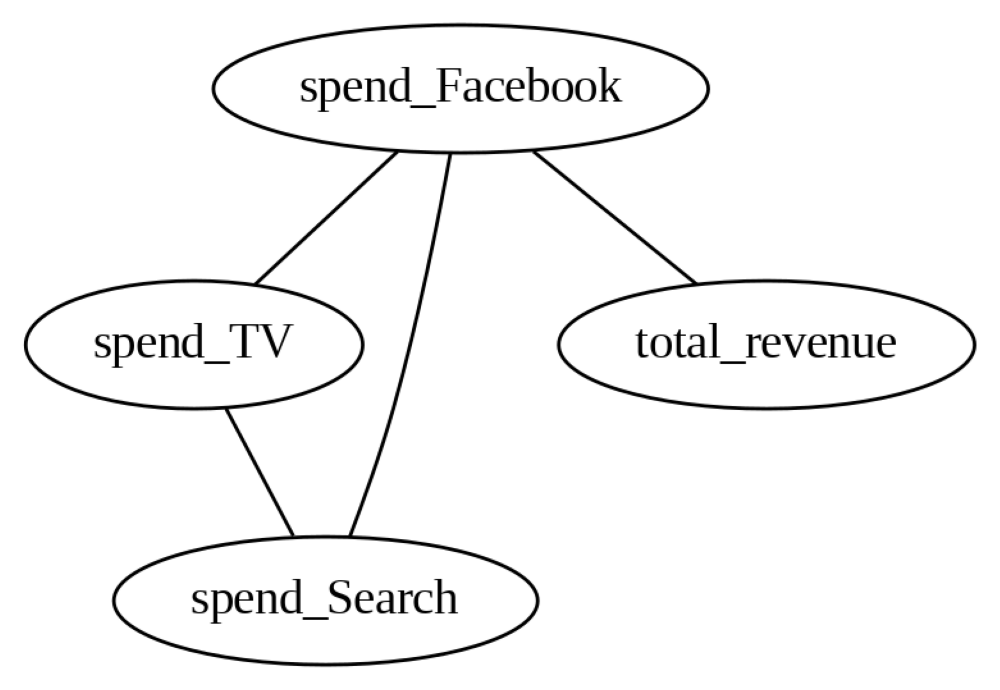

In [ ]:

import pandas as pd
import numpy as np
from causallearn.search.PermutationBased.GRaSP import grasp
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

# Run the GRaSP algorithm
G = grasp(data_array)

# Visualization using pydot
pyd = GraphUtils.to_pydot(G)

# Get the column names of the DataFrame
column_names = data.columns.tolist()


# Visualization using pydot
labels = {i: col for i, col in enumerate(data.columns)}
pyd = GraphUtils.to_pydot(G, labels=labels)

# Create a PNG image of the graph and display it
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

In [ ]:
from causallearn.search.FCMBased.PNL.PNL import PNL

# Load your data (replace with your actual data)
data = pd.read_csv('/content/masters_daily_level_dataset.csv')

# Convert 'DATE' column to datetime objects
data['DATE'] = pd.to_datetime(data['DATE'])

# Drop the 'DATE' column as it is not needed for causal analysis
data = data.drop(columns=['DATE'])

# Focus only on the relevant variables
data = data[['spend_Facebook', 'spend_TV', 'spend_Search', 'total_revenue']]


pnl = PNL()
# Extract the variables you want to analyze
data_x = data['spend_Facebook'].values.reshape(-1, 1)
data_y = data['total_revenue'].values.reshape(-1, 1)


# Initialize the PNL model
pnl = PNL()

# Determine the causal direction
p_value_forward, p_value_backward = pnl.cause_or_effect(data_x, data_y)

# Interpret the results
if p_value_forward < p_value_backward:
    print(f"spend_Facebook causes total_revenue with p-value: {p_value_forward}")
else:
    print(f"total_revenue causes spend_Facebook with p-value: {p_value_backward}")

Estimating bootstrap interval...:   0%|          | 0/4 [2:11:09<?, ?it/s]


total_revenue causes spend_Facebook with p-value: [0.]


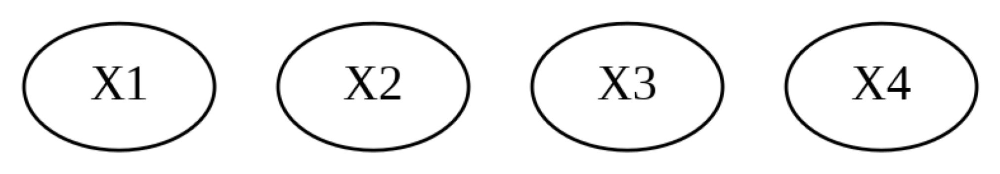

In [ ]:
import pandas as pd
from causallearn.search.HiddenCausal.GIN.GIN import GIN
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

# Load your data (replace with your actual data)
data = pd.read_csv('/content/masters_daily_level_dataset.csv')

# Convert 'DATE' column to datetime objects
data['DATE'] = pd.to_datetime(data['DATE'])

# Drop the 'DATE' column as it is not needed for causal analysis
data = data.drop(columns=['DATE'])

# Focus only on the relevant variables
data = data[['spend_Facebook', 'spend_TV', 'spend_Search', 'total_revenue']]

# Check for NaN values and remove them
if data.isnull().values.any():
    data = data.dropna()

# Convert DataFrame to NumPy array
data_array = data.values

# Apply the GIN algorithm
G, K = GIN(data_array)

# Visualization using pydot
pyd = GraphUtils.to_pydot(G)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

In [ ]:
!pip install causica


ERROR: Ignored the following versions that require a different python version: 0.1.0 Requires-Python >=3.8,<3.10; 0.1.1 Requires-Python >=3.8,<3.10; 0.2.0 Requires-Python >=3.9,<3.10; 0.3.0 Requires-Python >=3.10,<3.11; 0.3.1 Requires-Python >=3.10,<3.11; 0.3.2 Requires-Python >=3.10,<3.11; 0.3.3 Requires-Python >=3.10,<3.11; 0.3.4 Requires-Python >=3.10,<3.11; 0.3.5 Requires-Python >=3.10,<3.11; 0.3.6 Requires-Python >=3.10,<3.11; 0.4.0 Requires-Python >=3.10,<3.11; 0.4.1 Requires-Python <3.11,>=3.10; 0.4.2 Requires-Python <3.11,>=3.10; 0.4.3 Requires-Python <3.11,>=3.10; 0.4.4 Requires-Python <3.11,>=3.10; 0.4.5 Requires-Python <3.11,>=3.10
ERROR: Could not find a version that satisfies the requirement causica (from versions: none)
ERROR: No matching distribution found for causica


In [ ]:
!pip install pytorch-lightning

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.3/819.3 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 76.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 62.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 679.6 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 63.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 931.6/931.6 kB 40.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlin

In [ ]:
!pip install tensordict

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.7/400.7 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 766.7/766.7 MB 908.2 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.1/150.1 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.2/253.2 MB 3.4 MB/s eta 0:00:00
  Attempting uninstall: triton
    Found existing installation: triton 3.1.0
    Uninstalling triton-3.1.0:
      Successfully uninstalled triton-3.1.0
  Attempting uninstall: torch
    Found existing installation: torch 2.5.1+cu124
    Uninstalling torch-2.5.1+cu124:
      Successfully uninstalled torch-2.5.1+cu124
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fastai 2.7.18 requires torch<2.6,>=1.10, but you have torch 2.6.0 which is incompatible.
torchaudio 2.5.1+cu124 requires torch==2.5.1, but you have torch 2.6.0 which is incompatible.
to

In [ ]:
import os
from operator import itemgetter
import warnings

import fsspec
import json
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import pytorch_lightning as pl
import torch


from pytorch_lightning.callbacks import TQDMProgressBar
from tensordict import TensorDict

from causica.distributions import ContinuousNoiseDist
from causica.lightning.data_modules.basic_data_module import BasicDECIDataModule
from causica.lightning.modules.deci_module import DECIModule
from causica.sem.sem_distribution import SEMDistributionModule
from causica.sem.structural_equation_model import ite
from causica.training.auglag import AugLagLRConfig

warnings.filterwarnings("ignore")
test_run = bool(os.environ.get("TEST_RUN", False))  # used by testing to run the notebook as a script

ModuleNotFoundError: No module named 'causica'

In [ ]:
import json
import fsspec
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import torch
import pytorch_lightning as pl
from operator import itemgetter
from causica.data import BasicDECIDataModule, Variable
from causica.models.deci import DECIModule, ContinuousNoiseDist, AugLagLRConfig
from causica.models.sem import SEMDistributionModule
from torch.utils.data import TensorDict
from pytorch_lightning.callbacks import TQDMProgressBar

# Define test_run variable
test_run = False

root_path = CAUSICA_DATASETS_PATH + "causal_ai_suite"
df = data

# Load metadata telling us the data type of each column
variables_path = root_path + "/content/masters_daily_level_dataset_rev50.csv"
with fsspec.open(variables_path, mode="r", encoding="utf-8") as f:
    variables_spec = json.load(f)["variables"]

data_module = BasicDECIDataModule(
    df.loc[:, "Global Flag":"Revenue"],  # remove ground truth from dataframe
    variables=[Variable.from_dict(d) for d in variables_spec],
    batch_size=128,
    normalize=True,
)
num_nodes = len(data_module.dataset_train.keys())

outcome = "Total_revenue"
treatment_columns = ["spend_Facebook", "spend_TV", "spend_Search"]

adjacency_path = root_path + "/true_graph_gml_string.txt"
with fsspec.open(adjacency_path, mode="r", encoding="utf-8") as f:
    true_adj = nx.parse_gml(f.read())

fig, axis = plt.subplots(1, 1, figsize=(8, 8))
labels = {node: i for i, node in enumerate(true_adj.nodes)}

try:
    layout = nx.nx_agraph.graphviz_layout(true_adj, prog="dot")
except (ModuleNotFoundError, ImportError):
    layout = nx.layout.spring_layout(true_adj)

for node, i in labels.items():
    axis.scatter(layout[node][0], layout[node][1], label=f"{i}: {node}")
axis.legend()
nx.draw_networkx(true_adj, pos=layout, with_labels=True, arrows=True, labels=labels, ax=axis)

# The constraint matrix has the same shape as the adjacency matrix
# A `nan` value means no constraint
# A 0 value means a negative constraint
# A 1 value means a positive constraint
node_name_to_idx = {key: i for i, key in enumerate(data_module.dataset_train.keys())}
constraint_matrix = np.full((num_nodes, num_nodes), np.nan, dtype=np.float32)

engagement_nodes = ["spend_Facebook", "spend_TV", "spend_Search"]
engagement_idxs = itemgetter(*engagement_nodes)(node_name_to_idx)
for i in engagement_idxs:
    constraint_matrix[engagement_idxs, i] = 0.0

pl.seed_everything(seed=1)  # set the random seed

lightning_module = DECIModule(
    noise_dist=ContinuousNoiseDist.GAUSSIAN,
    prior_sparsity_lambda=43.0,
    init_rho=30.0,
    init_alpha=0.20,
    auglag_config=AugLagLRConfig(
        max_inner_steps=3400,
        max_outer_steps=8,
        lr_init_dict={
            "icgnn": 0.00076,
            "vardist": 0.0098,
            "functional_relationships": 3e-4,
            "noise_dist": 0.0070,
        },
    ),
)

lightning_module.constraint_matrix = torch.tensor(constraint_matrix)

trainer = pl.Trainer(
    accelerator="auto",
    max_epochs=2000,
    fast_dev_run=test_run,
    callbacks=[TQDMProgressBar(refresh_rate=19)],
    enable_checkpointing=False,
)

trainer.fit(lightning_module, datamodule=data_module)

torch.save(lightning_module.sem_module, "deci.pt")
sem_module: SEMDistributionModule = torch.load("deci.pt")

# create a structural equation model using the most likely graph
sem = sem_module().mode

graph = nx.from_numpy_array(sem.graph.cpu().numpy(), create_using=nx.DiGraph)
graph = nx.relabel_nodes(graph, dict(enumerate(data_module.dataset_train.keys())))

fig, axis = plt.subplots(1, 1, figsize=(8, 8))

for node, i in labels.items():
    axis.scatter(layout[node][0], layout[node][1], label=f"{i}: {node}")
axis.legend()

nx.draw_networkx(graph, pos=layout, with_labels=True, arrows=True, labels=labels, ax=axis)
revenue_estimated_ate = {}
num_samples = 10 if test_run else 20000
sample_shape = torch.Size([num_samples])
normalizer = data_module.normalizer

for treatment in treatment_columns:
    intervention_a = TensorDict({treatment: torch.tensor([1.0])}, batch_size=tuple())
    intervention_b = TensorDict({treatment: torch.tensor([0.0])}, batch_size=tuple())

    rev_a_samples = normalizer.inv(sem.do(interventions=intervention_a).sample(sample_shape))[outcome]
    rev_b_samples = normalizer.inv(sem.do(interventions=intervention_b).sample(sample_shape))[outcome]

    ate_mean = rev_a_samples.mean(0) - rev_b_samples.mean(0)
    ate_std = np.sqrt((rev_a_samples.var(0) + rev_b_samples.var(0)) / num_samples)

    revenue_estimated_ate[treatment] = (
        ate_mean.cpu().numpy()[0],
        ate_std.cpu().numpy()[0],
    )
revenue_estimated_ate

fig, axes = plt.subplots(1, len(revenue_estimated_ate), figsize=(16, 4))
fig.suptitle("Estimated ATEs with DECI")
for ax, treatment in zip(axes, revenue_estimated_ate.keys()):
    ax.errorbar([0], [revenue_estimated_ate[treatment][0]], [2 * revenue_estimated_ate[treatment][1]], fmt="o")
    ax.set_title(treatment)
    ax.set_ylabel("Revenue difference ($)")
plt.show()